In [381]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from tensorflow.keras import utils
from sklearn import preprocessing
from sklearn import ensemble
from sklearn import tree

In [382]:
# Baze podataka sa 12 stanica u Pekingu bez nedostajucih vrednosti:

filenames =["PRSA_Data_Aotizhongxin_20130301-20170228.csv","PRSA_Data_Changping_20130301-20170228.csv","PRSA_Data_Dingling_20130301-20170228.csv",
            "PRSA_Data_Dongsi_20130301-20170228.csv","PRSA_Data_Guanyuan_20130301-20170228.csv",
            "PRSA_Data_Gucheng_20130301-20170228.csv","PRSA_Data_Huairou_20130301-20170228.csv","PRSA_Data_Nongzhanguan_20130301-20170228.csv",
            "PRSA_Data_Shunyi_20130301-20170228.csv","PRSA_Data_Tiantan_20130301-20170228.csv","PRSA_Data_Wanliu_20130301-20170228.csv","PRSA_Data_Wanshouxigong_20130301-20170228.csv"]
dataframes=[]
for f in filenames:
    dataframes.append(pd.read_csv("data_without_na/"+f,index_col=0))
df_Dingling = dataframes[2].copy()
df_Huairou = dataframes[6].copy()
df_Aotizhongxin = dataframes[0].copy()
df_Changping = dataframes[1].copy()
df_Dongsi = dataframes[3].copy()
df_Guanyuan = dataframes[4].copy()
df_Nongzhanguan =dataframes[7].copy()
df_Shunyi=dataframes[8].copy()
df_Tiantan=dataframes[9].copy()
df_Wanliu=dataframes[10].copy()
df_Wanshouxigong =dataframes[11].copy()
df_Gucheng =dataframes[5].copy()

In [383]:
# Stanice:
stations=[]
for data in dataframes:
    stations.append(data['station'].iloc[0])

In [384]:
# Provera nedostajucih vrednosti:

for data in dataframes:
    print("{}:{}".format(data['station'].iloc[0],np.sum(np.sum(data.isna()))))

Aotizhongxin:0
Changping:0
Dingling:0
Dongsi:0
Guanyuan:0
Gucheng:0
Huairou:0
Nongzhanguan:0
Shunyi:0
Tiantan:0
Wanliu:0
Wanshouxigong:0


In [385]:
dataframes[0].head()

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,heating
2013-03-01 00:00:00,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,0,4.4,Aotizhongxin,0
2013-03-01 01:00:00,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,0,4.7,Aotizhongxin,0
2013-03-01 02:00:00,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,0,5.6,Aotizhongxin,0
2013-03-01 03:00:00,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,0,3.1,Aotizhongxin,0
2013-03-01 04:00:00,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,0,2.0,Aotizhongxin,0


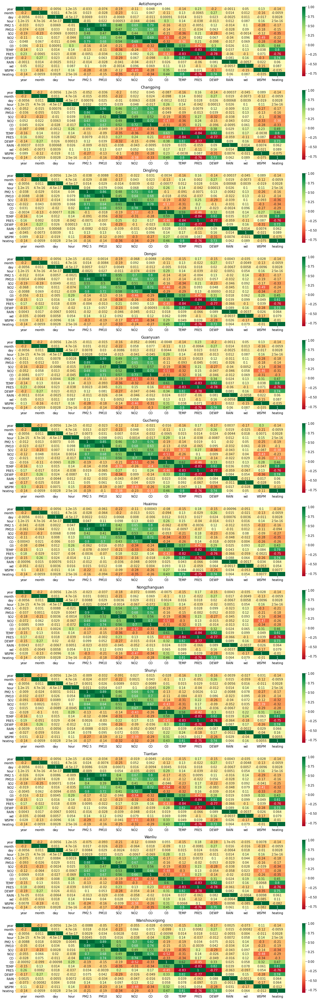

In [386]:
# Matrica korelacija za svaku od stanica:

import seaborn as sns
figure=plt.figure(figsize=(20,60))
for i,data in enumerate(dataframes):
    figure.add_subplot(12,1,i+1)
    corrmat = data.corr()
    top_corr_features = corrmat.index
    g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")
    plt.title(data['station'].iloc[0])
plt.show()

In [387]:
# Uklonimo kolone year,day,hour i station:

for i in dataframes:
  i=i.drop(['day','year','hour','station'],axis=1,inplace=True)

In [388]:
dataframes[0].head()

,month,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,heating
2013-03-01 00:00:00,3,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,0,4.4,0
2013-03-01 01:00:00,3,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,0,4.7,0
2013-03-01 02:00:00,3,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,0,5.6,0
2013-03-01 03:00:00,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,0,3.1,0
2013-03-01 04:00:00,3,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,0,2.0,0


In [389]:
# Siftovanje svih vrednosti u kolonoma 
# REZULTAT FUNKCIJE pri pozivu (1,1) je BAZA sa sledecim kolonama:
# v1(t-1), v2(t-1), v3(t-1)......v1(t), v2(t)......
# (t-1) ---> prethodni trenutak
# (t)   ---> sadasnjost

def s_to_super(data, n_in=1, n_out=1, dropnan=True):     
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [390]:
# Nove baze samo sa kolonama potrebnim za predvidjanje

station=[]
for i in dataframes:
    station.append(i.copy())
Dingling = station[2]
Huairou = station[6]
Aotizhongxin = station[0]
Changping = station[1]
Dongsi = station[3]
Guanyuan = station[4]
Nongzhanguan = station[7]
Shunyi= station[8]
Tiantan= station[9]
Wanliu= station[10]
Wanshouxigong = station[11]
Gucheng = station[5]

In [391]:
# Baze sa siftovanim vrednostima

reframed=[]
for i in station:
    values = i.values
    reframed.append(s_to_super(values, 1, 1))
  
Dingling_reframed = reframed[2]
Huairou_reframed = reframed[6]
Aotizhongxin_reframed = reframed[0]
Changping_reframed = reframed[1]
Dongsi_reframed = reframed[3]
Guanyuan_reframed = reframed[4]
Nongzhanguan_reframed = reframed[7]
Shunyi_reframed = reframed[8]
Tiantan_reframed = reframed[9]
Wanliu_reframed = reframed[10]
Wanshouxigong_reframed = reframed[11]
Gucheng_reframed = reframed[5]


In [392]:
# Postavljam indekse na datume u reframed bazama
# Dodeljivanje datuma svakoj od stanica

datetime_col = pd.date_range(start='2013-03-01 00:00:00', end='2017-02-28 23:00:00',freq='H')

for i in reframed:
  i.set_index(datetime_col[1:], drop = True, inplace = True)

In [393]:
# PRVI SLUCAJ: Predvidjanje koncentracije za naredni sat - CATBOOST

In [394]:
# => Predvidjanje PM2.5 na osnovu vrednosti polutanata u prethodnom satu i prognoze meteroloskih podataka za taj sat

reframedPM25=[]
for i in reframed:
    pom=i.drop(i.columns[[0,7,8,9,10,11,12,13,14,16,17,18,19,20]],axis=1).copy()
    reframedPM25.append(pom)
Dingling_reframedPM25 = reframedPM25[2]
Huairou_reframedPM25 = reframedPM25[6]
Aotizhongxin_reframedPM25 = reframedPM25[0]
Changping_reframedPM25 = reframedPM25[1]
Dongsi_reframedPM25 = reframedPM25[3]
Guanyuan_reframedPM25 = reframedPM25[4]
Nongzhanguan_reframedPM25 = reframedPM25[7]
Shunyi_reframedPM25 = reframedPM25[8]
Tiantan_reframedPM25 = reframedPM25[9]
Wanliu_reframedPM25 = reframedPM25[10]
Wanshouxigong_reframedPM25 = reframedPM25[11]
Gucheng_reframedPM25 = reframedPM25[5]

In [395]:
Dingling_reframedPM25.head(5) 
# var2(t-1) Koncentracija PM2.5 u prethodnom satu
# var2(t) Koncentracija PM2.5 za naredni sat

,var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var2(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t)
2013-03-01 01:00:00,4.0,4.0,3.0,7.0,200.0,82.0,7.0,-2.5,1021.3,-19.0,0.0,0.0,0.7,0.0
2013-03-01 02:00:00,7.0,7.0,3.0,6.0,200.0,80.0,5.0,-3.0,1021.3,-19.9,0.0,0.0,0.2,0.0
2013-03-01 03:00:00,5.0,5.0,3.0,2.0,200.0,79.0,6.0,-3.6,1021.8,-19.1,0.0,0.0,1.0,0.0
2013-03-01 04:00:00,6.0,6.0,3.0,8.0,200.0,79.0,5.0,-3.5,1022.3,-19.4,0.0,0.0,2.1,0.0
2013-03-01 05:00:00,5.0,5.0,3.0,8.0,200.0,81.0,6.0,-4.5,1022.6,-19.5,0.0,0.0,1.7,0.0


In [396]:
# Priprema: - X i y

XPM25=[]
yPM25=[]

for i in reframedPM25:
    pom=i.copy()
    pom=pom.drop('var2(t)',axis=1)
    XPM25.append(pom.copy())
    yPM25.append(i['var2(t)'])

In [397]:
XPM25[0].shape,yPM25[0].shape

((35063, 13), (35063,))

In [398]:
# Trening i test skup

# Zadajem broj do koga ce mi ici trening set 
# Ne mogu train_test_split jer moram da imam povezane sate!

n_len=34780
X_trainPM25=[]
X_testPM25=[]
y_trainPM25=[]
y_testPM25=[]

for i in XPM25:
  X_trainPM25.append(i.iloc[:n_len])
  X_testPM25.append(i.iloc[n_len:34901])
for i in yPM25:
  y_trainPM25.append(i.iloc[:n_len])
  y_testPM25.append(i.iloc[n_len:34901])

In [399]:
# Spajamo sve stanice u jednu veliku bazu podataka

X_trainPM25all=pd.concat(X_trainPM25,ignore_index=True)
X_testPM25all=pd.concat(X_testPM25,ignore_index=True)
y_trainPM25all=pd.concat(y_trainPM25,ignore_index=True)
y_testPM25all=pd.concat(y_testPM25,ignore_index=True)

In [400]:
n_train=X_trainPM25all.shape[0]
n_test=X_testPM25all.shape[0]

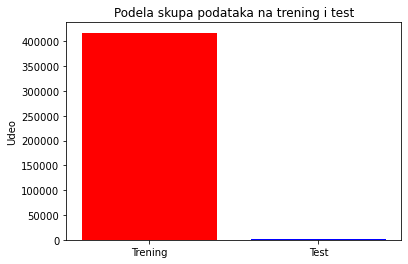

In [401]:

fig, ax = plt.subplots()
bar_trening, bar_test = plt.bar([0, 1], (n_train, n_test))

bar_trening.set_facecolor('r')
bar_test.set_facecolor('b')

ax.set_xticks([0, 1])
ax.set_xticklabels(['Trening', 'Test'])

ax.set_ylabel('Udeo')

ax.set_title('Podela skupa podataka na trening i test');

# U trening podacima nam je samo 24*5 casova

In [402]:
pip install catboost

Note: you may need to restart the kernel to use updated packages.


In [403]:
# Catboost model
# Napomena: Nisam radila skaliranje jer u dokumentaciji za Catboost stoji da nije potrebno!
# Ja sam ipak probala ali su rezultati isti, negde cak i losiji zato sam ostavila bez skaliranja, a skaliranje
# sam odradila za druge modele!

from catboost import Pool, CatBoostRegressor

modelPM25=CatBoostRegressor(iterations=1500,
                          depth=10, 
                          learning_rate = 0.01, 
                          loss_function='RMSE',
                          eval_metric = 'RMSE',
                          random_seed = 55,
                          od_type = "Iter",
                          metric_period = 1,
                          od_wait = 20
                          )

In [404]:
modelPM25.fit(X_trainPM25all,y_trainPM25all)

0:	learn: 80.4528875	total: 53.6ms	remaining: 1m 20s
1:	learn: 79.7179762	total: 109ms	remaining: 1m 21s
2:	learn: 78.9943868	total: 161ms	remaining: 1m 20s
3:	learn: 78.2793619	total: 216ms	remaining: 1m 20s
4:	learn: 77.5707728	total: 271ms	remaining: 1m 21s
5:	learn: 76.8713865	total: 330ms	remaining: 1m 22s
6:	learn: 76.1802324	total: 385ms	remaining: 1m 22s
7:	learn: 75.4890772	total: 446ms	remaining: 1m 23s
8:	learn: 74.8088854	total: 505ms	remaining: 1m 23s
9:	learn: 74.1348300	total: 565ms	remaining: 1m 24s
10:	learn: 73.4659974	total: 622ms	remaining: 1m 24s
11:	learn: 72.8061738	total: 675ms	remaining: 1m 23s
12:	learn: 72.1517387	total: 732ms	remaining: 1m 23s
13:	learn: 71.5078317	total: 806ms	remaining: 1m 25s
14:	learn: 70.8719606	total: 868ms	remaining: 1m 25s
15:	learn: 70.2395511	total: 932ms	remaining: 1m 26s
16:	learn: 69.6166448	total: 989ms	remaining: 1m 26s
17:	learn: 68.9940831	total: 1.05s	remaining: 1m 26s
18:	learn: 68.3804548	total: 1.1s	remaining: 1m 26s
19:

156:	learn: 26.0815543	total: 9.29s	remaining: 1m 19s
157:	learn: 25.9709770	total: 9.34s	remaining: 1m 19s
158:	learn: 25.8619793	total: 9.4s	remaining: 1m 19s
159:	learn: 25.7545217	total: 9.46s	remaining: 1m 19s
160:	learn: 25.6498186	total: 9.52s	remaining: 1m 19s
161:	learn: 25.5467708	total: 9.57s	remaining: 1m 19s
162:	learn: 25.4445605	total: 9.63s	remaining: 1m 19s
163:	learn: 25.3430223	total: 9.69s	remaining: 1m 18s
164:	learn: 25.2433913	total: 9.76s	remaining: 1m 18s
165:	learn: 25.1460994	total: 9.81s	remaining: 1m 18s
166:	learn: 25.0490284	total: 9.87s	remaining: 1m 18s
167:	learn: 24.9538096	total: 9.93s	remaining: 1m 18s
168:	learn: 24.8597586	total: 9.99s	remaining: 1m 18s
169:	learn: 24.7670040	total: 10s	remaining: 1m 18s
170:	learn: 24.6760613	total: 10.1s	remaining: 1m 18s
171:	learn: 24.5859432	total: 10.2s	remaining: 1m 18s
172:	learn: 24.4974079	total: 10.2s	remaining: 1m 18s
173:	learn: 24.4106936	total: 10.3s	remaining: 1m 18s
174:	learn: 24.3268357	total: 1

312:	learn: 19.5258711	total: 19s	remaining: 1m 11s
313:	learn: 19.5162280	total: 19s	remaining: 1m 11s
314:	learn: 19.5057221	total: 19.1s	remaining: 1m 11s
315:	learn: 19.4953351	total: 19.2s	remaining: 1m 11s
316:	learn: 19.4853729	total: 19.2s	remaining: 1m 11s
317:	learn: 19.4764179	total: 19.3s	remaining: 1m 11s
318:	learn: 19.4668704	total: 19.3s	remaining: 1m 11s
319:	learn: 19.4578591	total: 19.4s	remaining: 1m 11s
320:	learn: 19.4484483	total: 19.4s	remaining: 1m 11s
321:	learn: 19.4395138	total: 19.5s	remaining: 1m 11s
322:	learn: 19.4299319	total: 19.6s	remaining: 1m 11s
323:	learn: 19.4209575	total: 19.6s	remaining: 1m 11s
324:	learn: 19.4128488	total: 19.7s	remaining: 1m 11s
325:	learn: 19.4044185	total: 19.7s	remaining: 1m 11s
326:	learn: 19.3958035	total: 19.8s	remaining: 1m 11s
327:	learn: 19.3874396	total: 19.9s	remaining: 1m 10s
328:	learn: 19.3790848	total: 19.9s	remaining: 1m 10s
329:	learn: 19.3708277	total: 20s	remaining: 1m 10s
330:	learn: 19.3632188	total: 20s	

468:	learn: 18.7743456	total: 28.5s	remaining: 1m 2s
469:	learn: 18.7718869	total: 28.6s	remaining: 1m 2s
470:	learn: 18.7701050	total: 28.7s	remaining: 1m 2s
471:	learn: 18.7675288	total: 28.7s	remaining: 1m 2s
472:	learn: 18.7652622	total: 28.8s	remaining: 1m 2s
473:	learn: 18.7626731	total: 28.9s	remaining: 1m 2s
474:	learn: 18.7601439	total: 28.9s	remaining: 1m 2s
475:	learn: 18.7582538	total: 29s	remaining: 1m 2s
476:	learn: 18.7556132	total: 29.1s	remaining: 1m 2s
477:	learn: 18.7527930	total: 29.1s	remaining: 1m 2s
478:	learn: 18.7504020	total: 29.2s	remaining: 1m 2s
479:	learn: 18.7479418	total: 29.3s	remaining: 1m 2s
480:	learn: 18.7457335	total: 29.3s	remaining: 1m 2s
481:	learn: 18.7434373	total: 29.4s	remaining: 1m 2s
482:	learn: 18.7412285	total: 29.5s	remaining: 1m 2s
483:	learn: 18.7389259	total: 29.5s	remaining: 1m 1s
484:	learn: 18.7370425	total: 29.6s	remaining: 1m 1s
485:	learn: 18.7348190	total: 29.6s	remaining: 1m 1s
486:	learn: 18.7326549	total: 29.7s	remaining: 1

627:	learn: 18.4835084	total: 38.2s	remaining: 53.1s
628:	learn: 18.4821849	total: 38.3s	remaining: 53s
629:	learn: 18.4806502	total: 38.3s	remaining: 53s
630:	learn: 18.4789851	total: 38.4s	remaining: 52.9s
631:	learn: 18.4774707	total: 38.5s	remaining: 52.8s
632:	learn: 18.4762290	total: 38.5s	remaining: 52.8s
633:	learn: 18.4748694	total: 38.6s	remaining: 52.7s
634:	learn: 18.4736837	total: 38.6s	remaining: 52.6s
635:	learn: 18.4721659	total: 38.7s	remaining: 52.6s
636:	learn: 18.4709405	total: 38.8s	remaining: 52.5s
637:	learn: 18.4695059	total: 38.8s	remaining: 52.5s
638:	learn: 18.4679288	total: 38.9s	remaining: 52.4s
639:	learn: 18.4661526	total: 39s	remaining: 52.3s
640:	learn: 18.4646268	total: 39s	remaining: 52.3s
641:	learn: 18.4631837	total: 39.1s	remaining: 52.2s
642:	learn: 18.4614724	total: 39.1s	remaining: 52.2s
643:	learn: 18.4599740	total: 39.2s	remaining: 52.1s
644:	learn: 18.4587073	total: 39.3s	remaining: 52s
645:	learn: 18.4578570	total: 39.3s	remaining: 52s
646:	

786:	learn: 18.2806835	total: 48.1s	remaining: 43.6s
787:	learn: 18.2790896	total: 48.2s	remaining: 43.5s
788:	learn: 18.2779792	total: 48.2s	remaining: 43.5s
789:	learn: 18.2764286	total: 48.3s	remaining: 43.4s
790:	learn: 18.2748791	total: 48.4s	remaining: 43.3s
791:	learn: 18.2742000	total: 48.4s	remaining: 43.3s
792:	learn: 18.2726176	total: 48.5s	remaining: 43.2s
793:	learn: 18.2716920	total: 48.5s	remaining: 43.2s
794:	learn: 18.2704962	total: 48.6s	remaining: 43.1s
795:	learn: 18.2690809	total: 48.7s	remaining: 43s
796:	learn: 18.2675877	total: 48.7s	remaining: 43s
797:	learn: 18.2663779	total: 48.8s	remaining: 42.9s
798:	learn: 18.2656308	total: 48.9s	remaining: 42.9s
799:	learn: 18.2650194	total: 48.9s	remaining: 42.8s
800:	learn: 18.2639045	total: 49s	remaining: 42.7s
801:	learn: 18.2628696	total: 49s	remaining: 42.7s
802:	learn: 18.2620889	total: 49.1s	remaining: 42.6s
803:	learn: 18.2609319	total: 49.1s	remaining: 42.5s
804:	learn: 18.2596442	total: 49.2s	remaining: 42.5s
8

943:	learn: 18.1080873	total: 57.7s	remaining: 34s
944:	learn: 18.1070225	total: 57.7s	remaining: 33.9s
945:	learn: 18.1060888	total: 57.8s	remaining: 33.8s
946:	learn: 18.1047964	total: 57.8s	remaining: 33.8s
947:	learn: 18.1043299	total: 57.9s	remaining: 33.7s
948:	learn: 18.1034924	total: 58s	remaining: 33.7s
949:	learn: 18.1025591	total: 58s	remaining: 33.6s
950:	learn: 18.1013614	total: 58.1s	remaining: 33.5s
951:	learn: 18.1007408	total: 58.1s	remaining: 33.5s
952:	learn: 18.1000941	total: 58.2s	remaining: 33.4s
953:	learn: 18.0983956	total: 58.3s	remaining: 33.3s
954:	learn: 18.0973600	total: 58.3s	remaining: 33.3s
955:	learn: 18.0964595	total: 58.4s	remaining: 33.2s
956:	learn: 18.0954179	total: 58.4s	remaining: 33.2s
957:	learn: 18.0943339	total: 58.5s	remaining: 33.1s
958:	learn: 18.0934861	total: 58.6s	remaining: 33s
959:	learn: 18.0923291	total: 58.6s	remaining: 33s
960:	learn: 18.0910179	total: 58.7s	remaining: 32.9s
961:	learn: 18.0902361	total: 58.7s	remaining: 32.9s
962

1099:	learn: 17.9596680	total: 1m 7s	remaining: 24.5s
1100:	learn: 17.9590622	total: 1m 7s	remaining: 24.5s
1101:	learn: 17.9578750	total: 1m 7s	remaining: 24.4s
1102:	learn: 17.9571487	total: 1m 7s	remaining: 24.3s
1103:	learn: 17.9562736	total: 1m 7s	remaining: 24.3s
1104:	learn: 17.9551591	total: 1m 7s	remaining: 24.2s
1105:	learn: 17.9543521	total: 1m 7s	remaining: 24.2s
1106:	learn: 17.9532400	total: 1m 7s	remaining: 24.1s
1107:	learn: 17.9523095	total: 1m 7s	remaining: 24s
1108:	learn: 17.9512547	total: 1m 7s	remaining: 24s
1109:	learn: 17.9501230	total: 1m 8s	remaining: 23.9s
1110:	learn: 17.9493603	total: 1m 8s	remaining: 23.8s
1111:	learn: 17.9481974	total: 1m 8s	remaining: 23.8s
1112:	learn: 17.9472426	total: 1m 8s	remaining: 23.7s
1113:	learn: 17.9466779	total: 1m 8s	remaining: 23.7s
1114:	learn: 17.9460277	total: 1m 8s	remaining: 23.6s
1115:	learn: 17.9444148	total: 1m 8s	remaining: 23.5s
1116:	learn: 17.9436790	total: 1m 8s	remaining: 23.5s
1117:	learn: 17.9428171	total: 1

1250:	learn: 17.8292626	total: 1m 16s	remaining: 15.3s
1251:	learn: 17.8286070	total: 1m 16s	remaining: 15.2s
1252:	learn: 17.8277487	total: 1m 16s	remaining: 15.2s
1253:	learn: 17.8272957	total: 1m 17s	remaining: 15.1s
1254:	learn: 17.8262924	total: 1m 17s	remaining: 15s
1255:	learn: 17.8250216	total: 1m 17s	remaining: 15s
1256:	learn: 17.8241912	total: 1m 17s	remaining: 14.9s
1257:	learn: 17.8230990	total: 1m 17s	remaining: 14.9s
1258:	learn: 17.8220914	total: 1m 17s	remaining: 14.8s
1259:	learn: 17.8213383	total: 1m 17s	remaining: 14.7s
1260:	learn: 17.8203140	total: 1m 17s	remaining: 14.7s
1261:	learn: 17.8195620	total: 1m 17s	remaining: 14.6s
1262:	learn: 17.8188181	total: 1m 17s	remaining: 14.6s
1263:	learn: 17.8179799	total: 1m 17s	remaining: 14.5s
1264:	learn: 17.8172579	total: 1m 17s	remaining: 14.4s
1265:	learn: 17.8164341	total: 1m 17s	remaining: 14.4s
1266:	learn: 17.8155072	total: 1m 17s	remaining: 14.3s
1267:	learn: 17.8147043	total: 1m 17s	remaining: 14.3s
1268:	learn: 1

1403:	learn: 17.7019653	total: 1m 27s	remaining: 5.95s
1404:	learn: 17.7012308	total: 1m 27s	remaining: 5.89s
1405:	learn: 17.7007062	total: 1m 27s	remaining: 5.83s
1406:	learn: 17.6998322	total: 1m 27s	remaining: 5.76s
1407:	learn: 17.6987847	total: 1m 27s	remaining: 5.7s
1408:	learn: 17.6982153	total: 1m 27s	remaining: 5.64s
1409:	learn: 17.6972808	total: 1m 27s	remaining: 5.58s
1410:	learn: 17.6969229	total: 1m 27s	remaining: 5.51s
1411:	learn: 17.6962380	total: 1m 27s	remaining: 5.45s
1412:	learn: 17.6954817	total: 1m 27s	remaining: 5.39s
1413:	learn: 17.6946534	total: 1m 27s	remaining: 5.33s
1414:	learn: 17.6939877	total: 1m 27s	remaining: 5.27s
1415:	learn: 17.6932305	total: 1m 27s	remaining: 5.21s
1416:	learn: 17.6923250	total: 1m 27s	remaining: 5.14s
1417:	learn: 17.6916708	total: 1m 27s	remaining: 5.08s
1418:	learn: 17.6906674	total: 1m 27s	remaining: 5.02s
1419:	learn: 17.6897606	total: 1m 27s	remaining: 4.96s
1420:	learn: 17.6889624	total: 1m 28s	remaining: 4.89s
1421:	learn

In [405]:
# Predvidjanje modelom:


predsPM25=[]

for i in range(0,len(reframed)):
  predsPM25.append(modelPM25.predict(X_testPM25[i]))

In [406]:
# Evaluacija modela:

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import math
from sklearn.metrics import r2_score

# Cuvamo RMSE,MAE i R2 u ovim matricama jer ce nam biti potrebni kasnije za poredjenje modela
R_CAT=[]
M_CAT=[]
R2_CAT=[]

for i in range(0,len(reframedPM25)):
  print('Stanica: '+ stations[i].split('_')[0])
  rmse = math.sqrt(mean_squared_error(y_testPM25[i], predsPM25[i]))
  mae= mean_absolute_error(y_testPM25[i], predsPM25[i])
  r2 = r2_score(y_testPM25[i],predsPM25[i])
  R_CAT.append(rmse)
  M_CAT.append(mae)
  R2_CAT.append(r2)
  print('Test RMSE: %.3f' % rmse)
  print('Test MAE: %.3f' % mae)
  print('R2 SCORE: {}'.format(r2))

Stanica: Aotizhongxin
Test RMSE: 9.916
Test MAE: 6.566
R2 SCORE: 0.9622738533286113
Stanica: Changping
Test RMSE: 11.837
Test MAE: 7.640
R2 SCORE: 0.9370545010767757
Stanica: Dingling
Test RMSE: 11.056
Test MAE: 6.642
R2 SCORE: 0.9358105630660734
Stanica: Dongsi
Test RMSE: 9.508
Test MAE: 6.863
R2 SCORE: 0.9645688260585117
Stanica: Guanyuan
Test RMSE: 10.007
Test MAE: 7.157
R2 SCORE: 0.9570138180593686
Stanica: Gucheng
Test RMSE: 13.138
Test MAE: 8.029
R2 SCORE: 0.9383207648477453
Stanica: Huairou
Test RMSE: 8.648
Test MAE: 6.004
R2 SCORE: 0.9603733064797758
Stanica: Nongzhanguan
Test RMSE: 9.386
Test MAE: 6.709
R2 SCORE: 0.965854913186789
Stanica: Shunyi
Test RMSE: 11.016
Test MAE: 7.336
R2 SCORE: 0.9481615900160452
Stanica: Tiantan
Test RMSE: 9.133
Test MAE: 6.577
R2 SCORE: 0.9630603932381703
Stanica: Wanliu
Test RMSE: 11.726
Test MAE: 7.415
R2 SCORE: 0.9410335119879966
Stanica: Wanshouxigong
Test RMSE: 9.329
Test MAE: 6.689
R2 SCORE: 0.9647770690499956


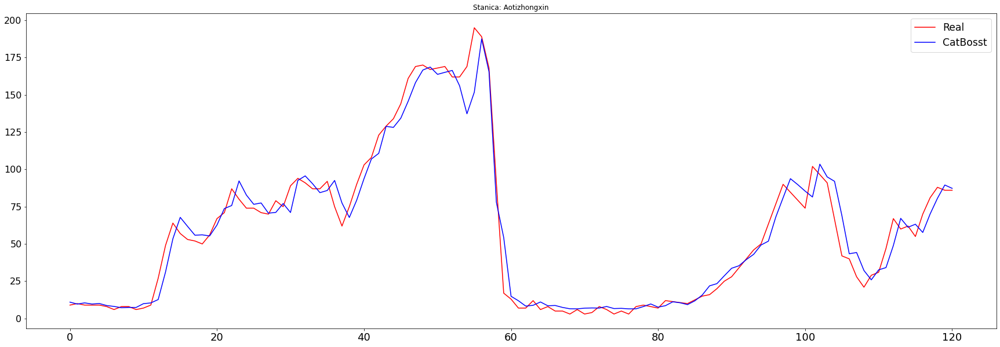

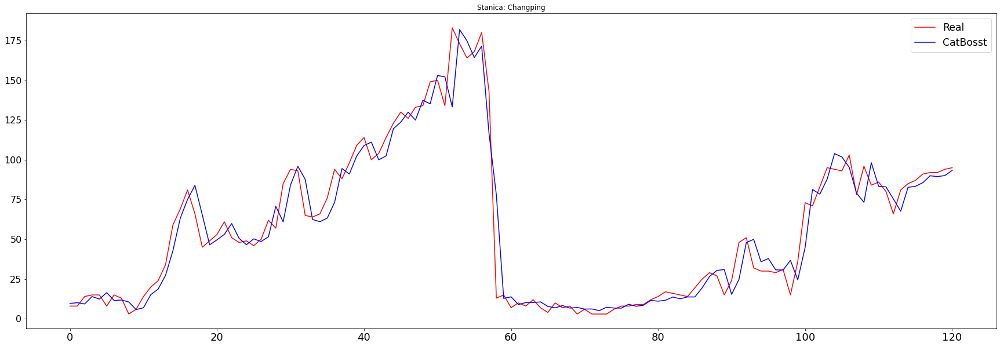

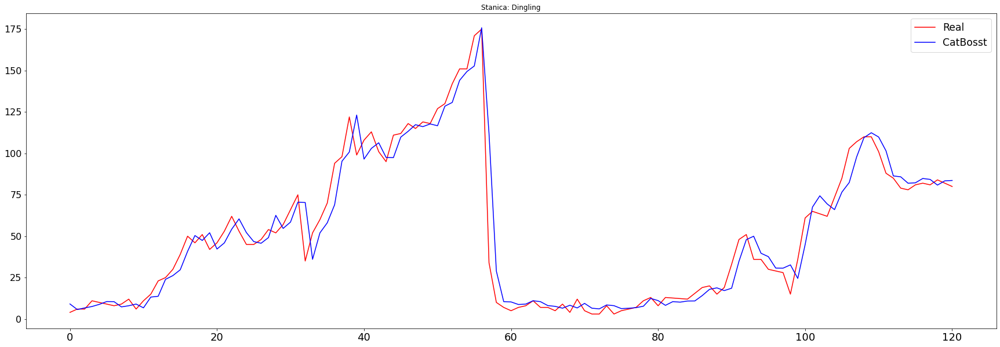

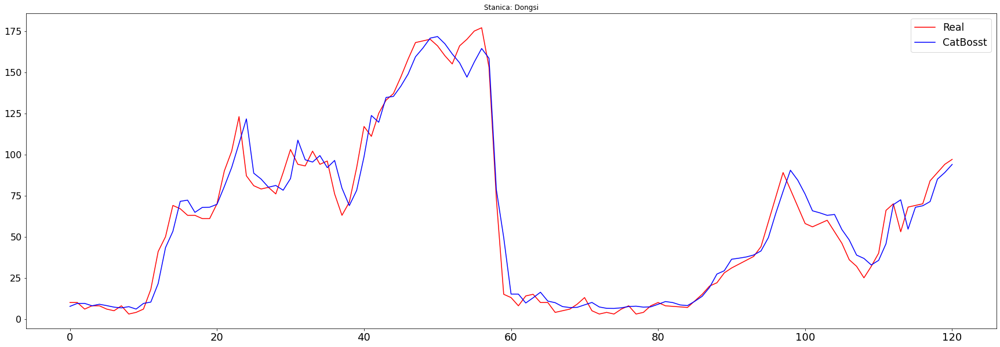

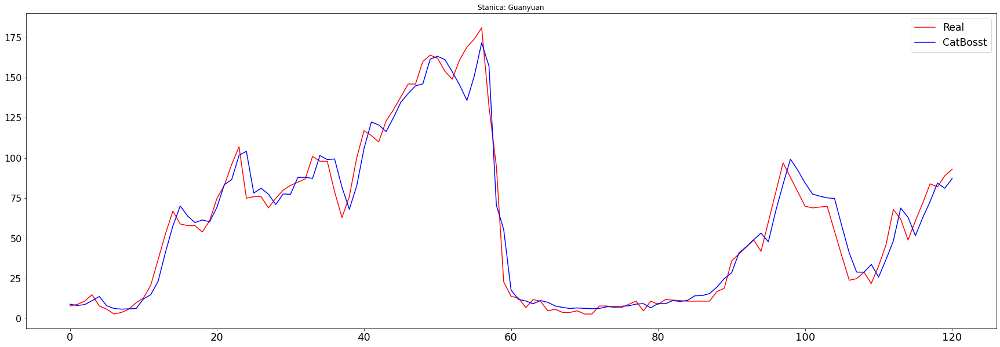

...

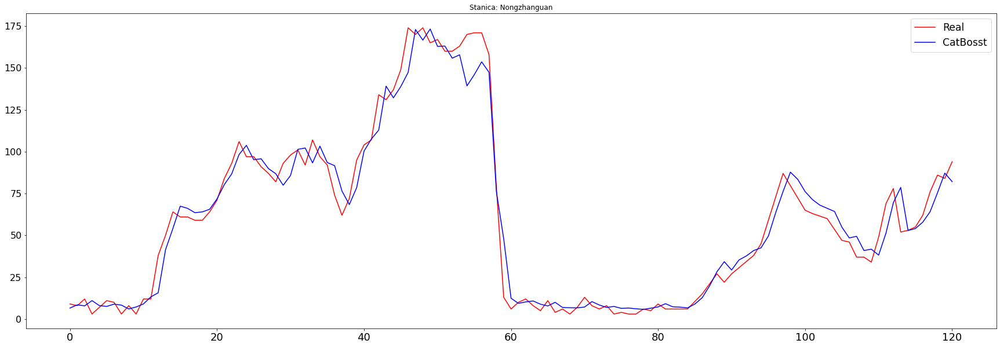

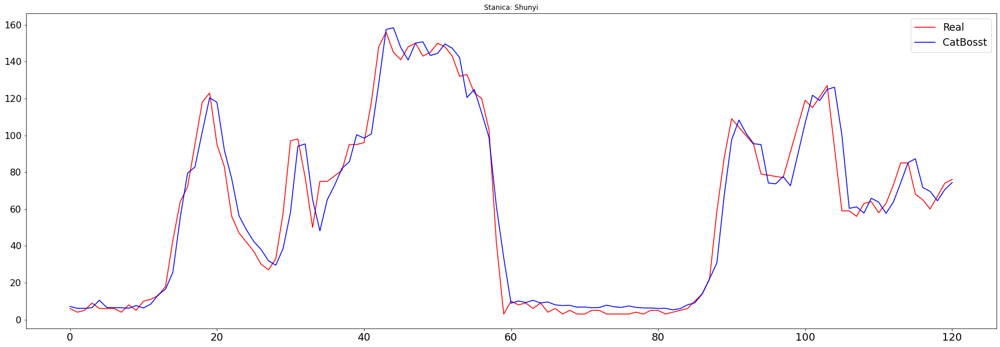

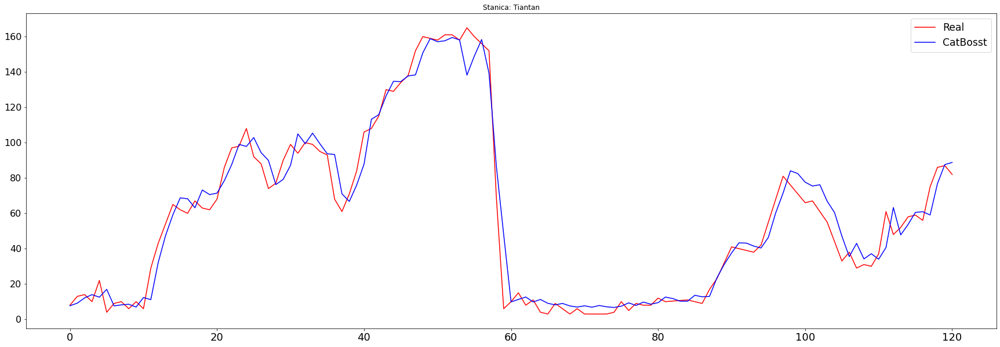

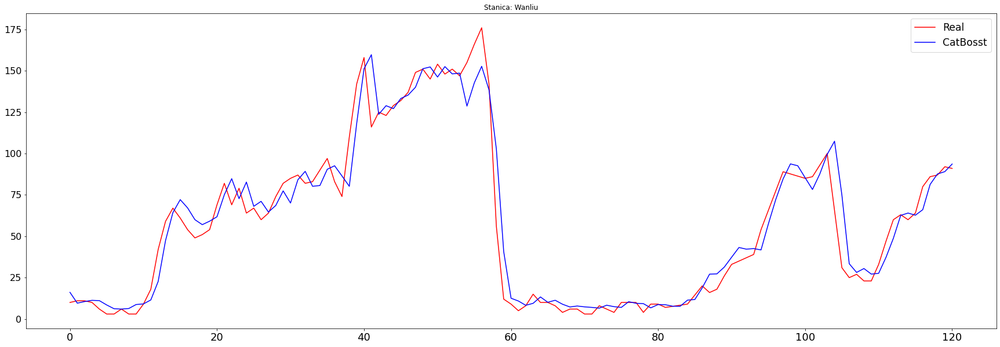

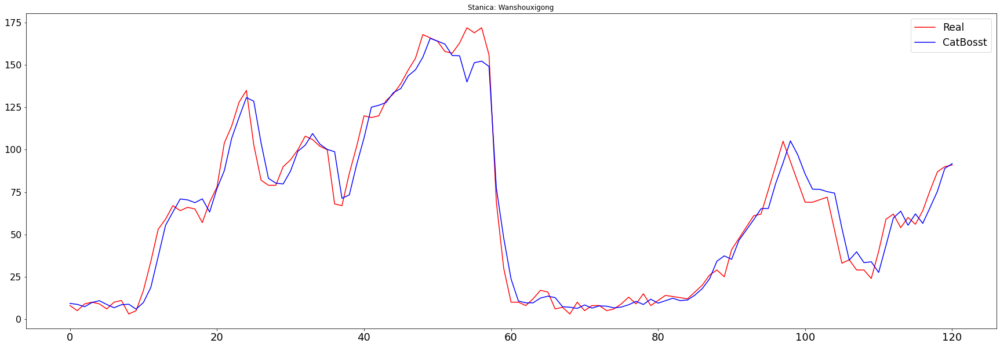

In [407]:
# Nacrtajmo grafike:

for i in range(0,len(reframedPM25)):
  plt.figure(figsize=(30, 10))
  plt.plot(np.arange(len(X_testPM25[i])), y_testPM25[i], label='Real', color='r')
  plt.plot(np.arange(len(X_testPM25[i])), predsPM25[i], label='CatBosst', color='blue')
  plt.legend(loc='best', fontsize='xx-large')
  plt.xticks(fontsize=18)
  plt.yticks(fontsize=16)
  plt.title('Stanica: '+ stations[i].split('_')[0])
plt.show()

In [408]:
# => Predvidjanje SO2 na osnovu vrednosti polutanata u prethodnom satu i prognoze meteroloskih podataka za taj sat

reframedSO2=[]
for i in reframed:
    pom=i.drop(i.columns[[0,7,8,9,10,11,12,13,14,15,16,18,19,20]],axis=1).copy()
    reframedSO2.append(pom)
Dingling_reframedSO2 = reframedSO2[2]
Huairou_reframedSO2 = reframedSO2[6]
Aotizhongxin_reframedSO2 = reframedSO2[0]
Changping_reframedSO2 = reframedSO2[1]
Dongsi_reframedSO2 = reframedSO2[3]
Guanyuan_reframedSO2 = reframedSO2[4]
Nongzhanguan_reframedSO2 = reframedSO2[7]
Shunyi_reframedSO2 = reframedSO2[8]
Tiantan_reframedSO2 = reframedSO2[9]
Wanliu_reframedSO2 = reframedSO2[10]
Wanshouxigong_reframedSO2 = reframedSO2[11]
Gucheng_reframedSO2 = reframedSO2[5]


In [409]:
Dingling_reframedSO2.head(5) 
# var4(t-1) Koncentracija SO2 u prethodnom satu
# var4(t) Koncentracija SO2 za naredni sat

,var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var4(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t)
2013-03-01 01:00:00,4.0,4.0,3.0,7.0,200.0,82.0,3.0,-2.5,1021.3,-19.0,0.0,0.0,0.7,0.0
2013-03-01 02:00:00,7.0,7.0,3.0,6.0,200.0,80.0,3.0,-3.0,1021.3,-19.9,0.0,0.0,0.2,0.0
2013-03-01 03:00:00,5.0,5.0,3.0,2.0,200.0,79.0,3.0,-3.6,1021.8,-19.1,0.0,0.0,1.0,0.0
2013-03-01 04:00:00,6.0,6.0,3.0,8.0,200.0,79.0,3.0,-3.5,1022.3,-19.4,0.0,0.0,2.1,0.0
2013-03-01 05:00:00,5.0,5.0,3.0,8.0,200.0,81.0,3.0,-4.5,1022.6,-19.5,0.0,0.0,1.7,0.0


In [410]:
# Priprema - X i y
XSO2=[]
ySO2=[]

for i in reframedSO2:
    pom=i.copy()
    pom=pom.drop('var4(t)',axis=1)
    XSO2.append(pom.copy())
    ySO2.append(i['var4(t)'])

In [411]:
# ----- Formiranje SETA ZA TRENIRANJE I TESTIRANJE  ------

# Zadajem broj do koga ce mi ici TRAINING SET
n_len=34780
X_trainSO2=[]
X_testSO2=[]
y_trainSO2=[]
y_testSO2=[]

for i in XSO2:
  X_trainSO2.append(i.iloc[:n_len])
  X_testSO2.append(i.iloc[n_len:34901])
for i in ySO2:
  y_trainSO2.append(i.iloc[:n_len])
  y_testSO2.append(i.iloc[n_len:34901])

In [412]:
# Spajamo sve stanice u jednu veliku bazu podataka

X_trainSO2all=pd.concat(X_trainSO2,ignore_index=True)
X_testSO2all=pd.concat(X_testSO2,ignore_index=True)
y_trainSO2all=pd.concat(y_trainSO2,ignore_index=True)
y_testSO2all=pd.concat(y_testSO2,ignore_index=True)

In [413]:
# Definisanje modela --- CATBOOST ---

from catboost import Pool, CatBoostRegressor

modelSO2=CatBoostRegressor(iterations=1500,
                          depth=10, 
                          learning_rate = 0.01, 
                          loss_function='RMSE',
                          eval_metric = 'RMSE',
                          random_seed = 55,
                          od_type = "Iter",
                          metric_period = 1,
                          od_wait = 20
                          )

In [414]:
modelSO2.fit(X_trainSO2all,y_trainSO2all)

0:	learn: 21.6393002	total: 52.3ms	remaining: 1m 18s
1:	learn: 21.4479868	total: 108ms	remaining: 1m 20s
2:	learn: 21.2592887	total: 163ms	remaining: 1m 21s
3:	learn: 21.0729800	total: 220ms	remaining: 1m 22s
4:	learn: 20.8877572	total: 280ms	remaining: 1m 23s
5:	learn: 20.7068479	total: 337ms	remaining: 1m 23s
6:	learn: 20.5251806	total: 395ms	remaining: 1m 24s
7:	learn: 20.3461190	total: 452ms	remaining: 1m 24s
8:	learn: 20.1691094	total: 519ms	remaining: 1m 25s
9:	learn: 19.9946546	total: 577ms	remaining: 1m 25s
10:	learn: 19.8204457	total: 635ms	remaining: 1m 25s
11:	learn: 19.6489635	total: 694ms	remaining: 1m 26s
12:	learn: 19.4797504	total: 755ms	remaining: 1m 26s
13:	learn: 19.3126924	total: 813ms	remaining: 1m 26s
14:	learn: 19.1473322	total: 871ms	remaining: 1m 26s
15:	learn: 18.9841347	total: 943ms	remaining: 1m 27s
16:	learn: 18.8216393	total: 1.01s	remaining: 1m 28s
17:	learn: 18.6613457	total: 1.08s	remaining: 1m 28s
18:	learn: 18.5034594	total: 1.14s	remaining: 1m 28s
19

156:	learn: 7.9781438	total: 9.45s	remaining: 1m 20s
157:	learn: 7.9529857	total: 9.51s	remaining: 1m 20s
158:	learn: 7.9285286	total: 9.57s	remaining: 1m 20s
159:	learn: 7.9042292	total: 9.63s	remaining: 1m 20s
160:	learn: 7.8807414	total: 9.69s	remaining: 1m 20s
161:	learn: 7.8572207	total: 9.75s	remaining: 1m 20s
162:	learn: 7.8340286	total: 9.81s	remaining: 1m 20s
163:	learn: 7.8108242	total: 9.88s	remaining: 1m 20s
164:	learn: 7.7884959	total: 9.95s	remaining: 1m 20s
165:	learn: 7.7667580	total: 10s	remaining: 1m 20s
166:	learn: 7.7446746	total: 10.1s	remaining: 1m 20s
167:	learn: 7.7235610	total: 10.2s	remaining: 1m 20s
168:	learn: 7.7026870	total: 10.3s	remaining: 1m 20s
169:	learn: 7.6816699	total: 10.3s	remaining: 1m 20s
170:	learn: 7.6611297	total: 10.4s	remaining: 1m 20s
171:	learn: 7.6410610	total: 10.5s	remaining: 1m 20s
172:	learn: 7.6212814	total: 10.6s	remaining: 1m 21s
173:	learn: 7.6018302	total: 10.7s	remaining: 1m 21s
174:	learn: 7.5828139	total: 10.7s	remaining: 1m

313:	learn: 6.5302453	total: 19.8s	remaining: 1m 14s
314:	learn: 6.5281448	total: 19.9s	remaining: 1m 14s
315:	learn: 6.5256439	total: 20s	remaining: 1m 14s
316:	learn: 6.5232006	total: 20s	remaining: 1m 14s
317:	learn: 6.5212987	total: 20.1s	remaining: 1m 14s
318:	learn: 6.5191437	total: 20.2s	remaining: 1m 14s
319:	learn: 6.5171626	total: 20.2s	remaining: 1m 14s
320:	learn: 6.5152457	total: 20.3s	remaining: 1m 14s
321:	learn: 6.5131931	total: 20.3s	remaining: 1m 14s
322:	learn: 6.5114970	total: 20.4s	remaining: 1m 14s
323:	learn: 6.5093390	total: 20.5s	remaining: 1m 14s
324:	learn: 6.5076080	total: 20.5s	remaining: 1m 14s
325:	learn: 6.5057154	total: 20.6s	remaining: 1m 14s
326:	learn: 6.5037118	total: 20.7s	remaining: 1m 14s
327:	learn: 6.5020034	total: 20.7s	remaining: 1m 14s
328:	learn: 6.5001579	total: 20.8s	remaining: 1m 13s
329:	learn: 6.4984243	total: 20.8s	remaining: 1m 13s
330:	learn: 6.4968097	total: 20.9s	remaining: 1m 13s
331:	learn: 6.4951301	total: 21s	remaining: 1m 13s

471:	learn: 6.3461043	total: 30s	remaining: 1m 5s
472:	learn: 6.3453868	total: 30s	remaining: 1m 5s
473:	learn: 6.3446153	total: 30.1s	remaining: 1m 5s
474:	learn: 6.3441186	total: 30.2s	remaining: 1m 5s
475:	learn: 6.3436007	total: 30.2s	remaining: 1m 5s
476:	learn: 6.3429468	total: 30.3s	remaining: 1m 4s
477:	learn: 6.3422614	total: 30.3s	remaining: 1m 4s
478:	learn: 6.3414685	total: 30.4s	remaining: 1m 4s
479:	learn: 6.3407513	total: 30.5s	remaining: 1m 4s
480:	learn: 6.3401239	total: 30.5s	remaining: 1m 4s
481:	learn: 6.3393761	total: 30.6s	remaining: 1m 4s
482:	learn: 6.3385130	total: 30.6s	remaining: 1m 4s
483:	learn: 6.3378342	total: 30.7s	remaining: 1m 4s
484:	learn: 6.3373351	total: 30.8s	remaining: 1m 4s
485:	learn: 6.3365330	total: 30.8s	remaining: 1m 4s
486:	learn: 6.3359968	total: 30.9s	remaining: 1m 4s
487:	learn: 6.3353981	total: 30.9s	remaining: 1m 4s
488:	learn: 6.3346747	total: 31s	remaining: 1m 4s
489:	learn: 6.3340348	total: 31.1s	remaining: 1m 4s
490:	learn: 6.3332

633:	learn: 6.2563290	total: 40s	remaining: 54.7s
634:	learn: 6.2558597	total: 40.1s	remaining: 54.6s
635:	learn: 6.2554117	total: 40.1s	remaining: 54.5s
636:	learn: 6.2551705	total: 40.2s	remaining: 54.5s
637:	learn: 6.2549000	total: 40.3s	remaining: 54.4s
638:	learn: 6.2543204	total: 40.3s	remaining: 54.3s
639:	learn: 6.2538110	total: 40.4s	remaining: 54.3s
640:	learn: 6.2533335	total: 40.4s	remaining: 54.2s
641:	learn: 6.2530115	total: 40.5s	remaining: 54.1s
642:	learn: 6.2526058	total: 40.6s	remaining: 54.1s
643:	learn: 6.2518098	total: 40.6s	remaining: 54s
644:	learn: 6.2512838	total: 40.7s	remaining: 53.9s
645:	learn: 6.2506706	total: 40.8s	remaining: 53.9s
646:	learn: 6.2501722	total: 40.8s	remaining: 53.8s
647:	learn: 6.2497854	total: 40.9s	remaining: 53.8s
648:	learn: 6.2494126	total: 40.9s	remaining: 53.7s
649:	learn: 6.2490412	total: 41s	remaining: 53.6s
650:	learn: 6.2484630	total: 41.1s	remaining: 53.5s
651:	learn: 6.2479124	total: 41.1s	remaining: 53.5s
652:	learn: 6.2473

793:	learn: 6.1865308	total: 50.1s	remaining: 44.5s
794:	learn: 6.1860175	total: 50.1s	remaining: 44.5s
795:	learn: 6.1858230	total: 50.2s	remaining: 44.4s
796:	learn: 6.1854317	total: 50.3s	remaining: 44.3s
797:	learn: 6.1851771	total: 50.3s	remaining: 44.3s
798:	learn: 6.1849138	total: 50.4s	remaining: 44.2s
799:	learn: 6.1845825	total: 50.4s	remaining: 44.1s
800:	learn: 6.1841313	total: 50.5s	remaining: 44.1s
801:	learn: 6.1838738	total: 50.6s	remaining: 44s
802:	learn: 6.1836893	total: 50.6s	remaining: 43.9s
803:	learn: 6.1831792	total: 50.7s	remaining: 43.9s
804:	learn: 6.1828521	total: 50.7s	remaining: 43.8s
805:	learn: 6.1824632	total: 50.8s	remaining: 43.7s
806:	learn: 6.1820355	total: 50.9s	remaining: 43.7s
807:	learn: 6.1815610	total: 50.9s	remaining: 43.6s
808:	learn: 6.1809975	total: 51s	remaining: 43.5s
809:	learn: 6.1806574	total: 51s	remaining: 43.5s
810:	learn: 6.1802244	total: 51.1s	remaining: 43.4s
811:	learn: 6.1797273	total: 51.2s	remaining: 43.4s
812:	learn: 6.1796

955:	learn: 6.1274857	total: 1m	remaining: 34.3s
956:	learn: 6.1272032	total: 1m	remaining: 34.2s
957:	learn: 6.1269928	total: 1m	remaining: 34.2s
958:	learn: 6.1265638	total: 1m	remaining: 34.1s
959:	learn: 6.1263328	total: 1m	remaining: 34s
960:	learn: 6.1260795	total: 1m	remaining: 34s
961:	learn: 6.1257351	total: 1m	remaining: 33.9s
962:	learn: 6.1254573	total: 1m	remaining: 33.9s
963:	learn: 6.1253172	total: 1m	remaining: 33.8s
964:	learn: 6.1249683	total: 1m	remaining: 33.7s
965:	learn: 6.1247215	total: 1m	remaining: 33.7s
966:	learn: 6.1241021	total: 1m	remaining: 33.6s
967:	learn: 6.1238295	total: 1m 1s	remaining: 33.5s
968:	learn: 6.1236120	total: 1m 1s	remaining: 33.5s
969:	learn: 6.1232898	total: 1m 1s	remaining: 33.4s
970:	learn: 6.1231856	total: 1m 1s	remaining: 33.3s
971:	learn: 6.1227884	total: 1m 1s	remaining: 33.3s
972:	learn: 6.1222008	total: 1m 1s	remaining: 33.2s
973:	learn: 6.1218466	total: 1m 1s	remaining: 33.1s
974:	learn: 6.1216495	total: 1m 1s	remaining: 33.1s


1113:	learn: 6.0755802	total: 1m 9s	remaining: 24.3s
1114:	learn: 6.0753335	total: 1m 10s	remaining: 24.2s
1115:	learn: 6.0749705	total: 1m 10s	remaining: 24.1s
1116:	learn: 6.0748259	total: 1m 10s	remaining: 24.1s
1117:	learn: 6.0744854	total: 1m 10s	remaining: 24s
1118:	learn: 6.0741526	total: 1m 10s	remaining: 23.9s
1119:	learn: 6.0738987	total: 1m 10s	remaining: 23.9s
1120:	learn: 6.0736515	total: 1m 10s	remaining: 23.8s
1121:	learn: 6.0732842	total: 1m 10s	remaining: 23.7s
1122:	learn: 6.0728038	total: 1m 10s	remaining: 23.7s
1123:	learn: 6.0724414	total: 1m 10s	remaining: 23.6s
1124:	learn: 6.0719312	total: 1m 10s	remaining: 23.6s
1125:	learn: 6.0713965	total: 1m 10s	remaining: 23.5s
1126:	learn: 6.0709259	total: 1m 10s	remaining: 23.4s
1127:	learn: 6.0706002	total: 1m 10s	remaining: 23.4s
1128:	learn: 6.0704614	total: 1m 10s	remaining: 23.3s
1129:	learn: 6.0701300	total: 1m 10s	remaining: 23.2s
1130:	learn: 6.0698782	total: 1m 11s	remaining: 23.2s
1131:	learn: 6.0694287	total: 1

1268:	learn: 6.0283495	total: 1m 19s	remaining: 14.5s
1269:	learn: 6.0278015	total: 1m 19s	remaining: 14.5s
1270:	learn: 6.0274860	total: 1m 19s	remaining: 14.4s
1271:	learn: 6.0272551	total: 1m 19s	remaining: 14.3s
1272:	learn: 6.0268601	total: 1m 20s	remaining: 14.3s
1273:	learn: 6.0266431	total: 1m 20s	remaining: 14.2s
1274:	learn: 6.0261177	total: 1m 20s	remaining: 14.1s
1275:	learn: 6.0259323	total: 1m 20s	remaining: 14.1s
1276:	learn: 6.0257216	total: 1m 20s	remaining: 14s
1277:	learn: 6.0255551	total: 1m 20s	remaining: 14s
1278:	learn: 6.0253303	total: 1m 20s	remaining: 13.9s
1279:	learn: 6.0250912	total: 1m 20s	remaining: 13.8s
1280:	learn: 6.0248548	total: 1m 20s	remaining: 13.8s
1281:	learn: 6.0246450	total: 1m 20s	remaining: 13.7s
1282:	learn: 6.0244289	total: 1m 20s	remaining: 13.6s
1283:	learn: 6.0238612	total: 1m 20s	remaining: 13.6s
1284:	learn: 6.0237169	total: 1m 20s	remaining: 13.5s
1285:	learn: 6.0233484	total: 1m 20s	remaining: 13.4s
1286:	learn: 6.0228463	total: 1m

1424:	learn: 5.9863413	total: 1m 29s	remaining: 4.7s
1425:	learn: 5.9861266	total: 1m 29s	remaining: 4.64s
1426:	learn: 5.9857694	total: 1m 29s	remaining: 4.58s
1427:	learn: 5.9855495	total: 1m 29s	remaining: 4.51s
1428:	learn: 5.9853168	total: 1m 29s	remaining: 4.45s
1429:	learn: 5.9850348	total: 1m 29s	remaining: 4.39s
1430:	learn: 5.9849151	total: 1m 29s	remaining: 4.32s
1431:	learn: 5.9846805	total: 1m 29s	remaining: 4.26s
1432:	learn: 5.9845484	total: 1m 29s	remaining: 4.2s
1433:	learn: 5.9843128	total: 1m 29s	remaining: 4.13s
1434:	learn: 5.9839952	total: 1m 29s	remaining: 4.07s
1435:	learn: 5.9838567	total: 1m 29s	remaining: 4.01s
1436:	learn: 5.9836518	total: 1m 30s	remaining: 3.95s
1437:	learn: 5.9833268	total: 1m 30s	remaining: 3.89s
1438:	learn: 5.9831952	total: 1m 30s	remaining: 3.82s
1439:	learn: 5.9830458	total: 1m 30s	remaining: 3.76s
1440:	learn: 5.9828550	total: 1m 30s	remaining: 3.7s
1441:	learn: 5.9827458	total: 1m 30s	remaining: 3.64s
1442:	learn: 5.9826118	total: 1

In [415]:
# Predvidjanje modelom

predsSO2=[]

for i in range(0,len(reframed)):
  predsSO2.append(modelSO2.predict(X_testSO2[i]))
  

In [416]:
# Evaluacija modela

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import math
from sklearn.metrics import r2_score

for i in range(0,len(reframedSO2)):
  print('Stanica: '+ stations[i].split('_')[0])
  rmse = math.sqrt(mean_squared_error(y_testSO2[i], predsSO2[i]))
  R2 = r2_score(y_testSO2[i],predsSO2[i])
  print('Test RMSE: %.3f' % rmse)
  print('Test MAE: %.3f' % mae)
  print('R2 SCORE: {}'.format(R2))
  print(' ------------ ')

Stanica: Aotizhongxin
Test RMSE: 4.367
Test MAE: 6.689
R2 SCORE: 0.924688022774852
 ------------ 
Stanica: Changping
Test RMSE: 6.416
Test MAE: 6.689
R2 SCORE: 0.7640567514956169
 ------------ 
Stanica: Dingling
Test RMSE: 4.436
Test MAE: 6.689
R2 SCORE: 0.830190556159581
 ------------ 
Stanica: Dongsi
Test RMSE: 3.636
Test MAE: 6.689
R2 SCORE: 0.9370149047730616
 ------------ 
Stanica: Guanyuan
Test RMSE: 4.033
Test MAE: 6.689
R2 SCORE: 0.9226073848763937
 ------------ 
Stanica: Gucheng
Test RMSE: 4.100
Test MAE: 6.689
R2 SCORE: 0.9372976064049299
 ------------ 
Stanica: Huairou
Test RMSE: 2.898
Test MAE: 6.689
R2 SCORE: 0.9179702276121934
 ------------ 
Stanica: Nongzhanguan
Test RMSE: 3.357
Test MAE: 6.689
R2 SCORE: 0.937325947465041
 ------------ 
Stanica: Shunyi
Test RMSE: 4.719
Test MAE: 6.689
R2 SCORE: 0.9005325244567642
 ------------ 
Stanica: Tiantan
Test RMSE: 5.359
Test MAE: 6.689
R2 SCORE: 0.8433238623403421
 ------------ 
Stanica: Wanliu
Test RMSE: 4.941
Test MAE: 6.689
R2

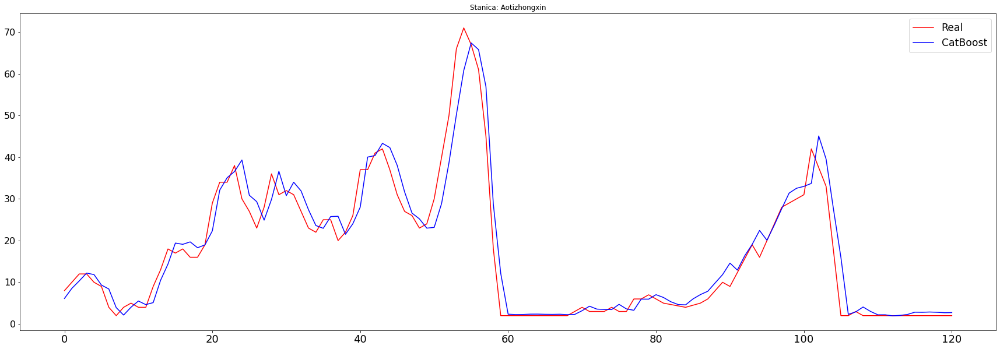

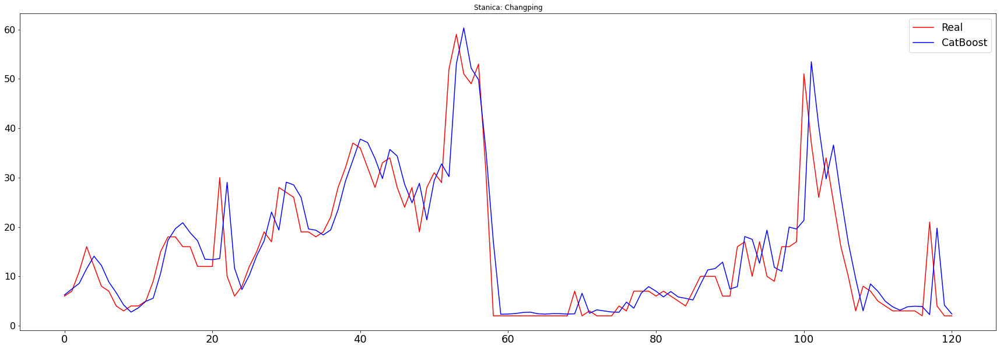

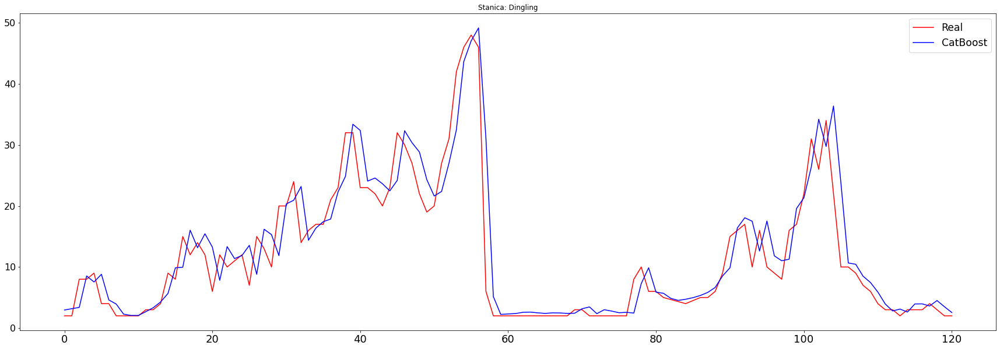

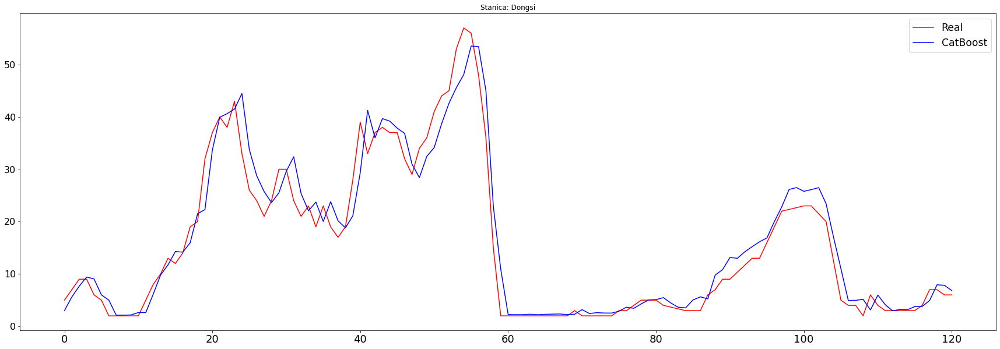

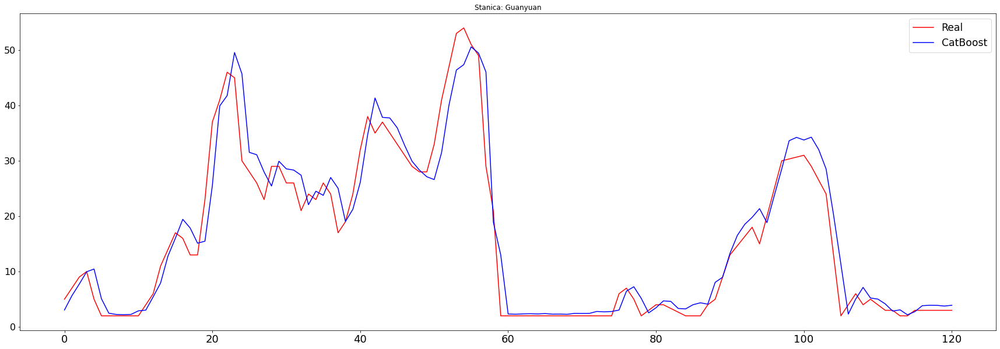

...

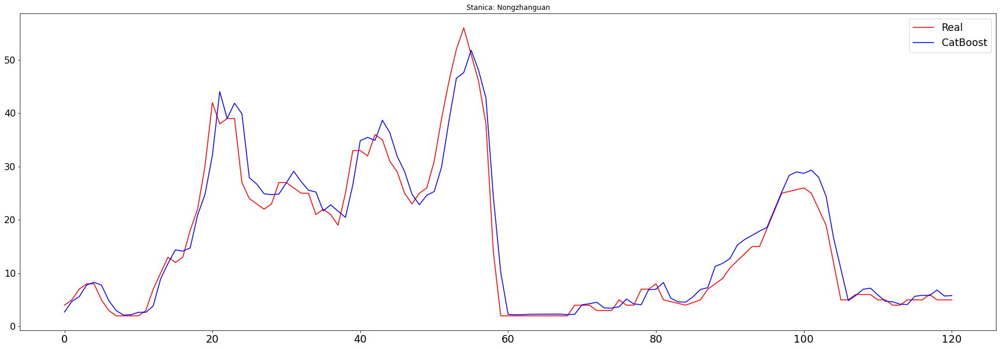

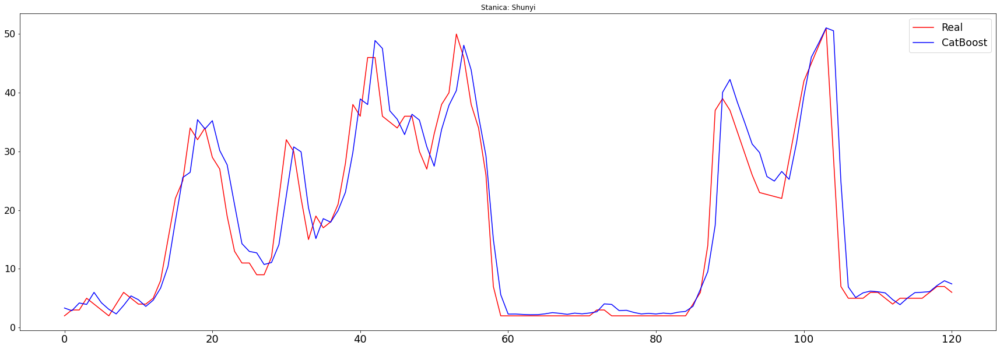

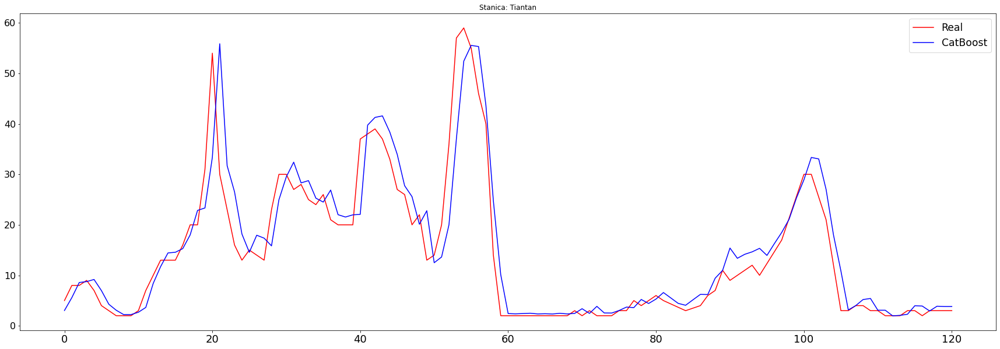

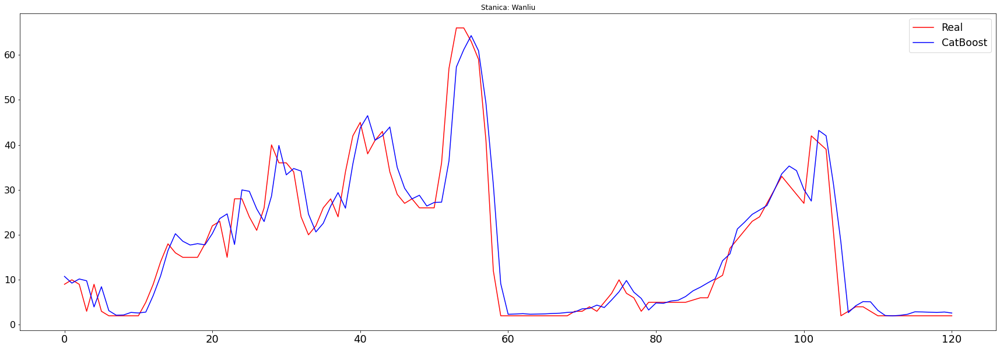

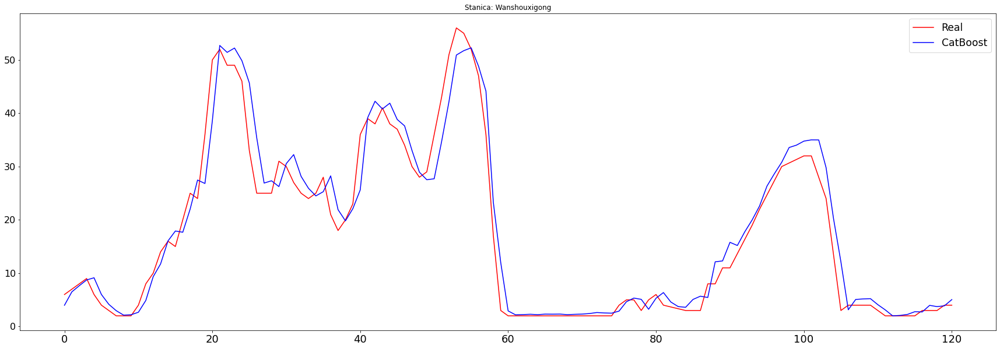

In [417]:
# Nacrtajmo grafike:

for i in range(0,len(reframedPM25)):
  plt.figure(figsize=(30, 10))
  plt.plot(np.arange(len(X_testSO2[i])), y_testSO2[i], label='Real', color='r')
  plt.plot(np.arange(len(X_testSO2[i])), predsSO2[i], label='CatBoost', color='blue')
  plt.legend(loc='best', fontsize='xx-large')
  plt.xticks(fontsize=18)
  plt.yticks(fontsize=16)
  plt.title('Stanica: '+ stations[i].split('_')[0])
plt.show()

In [418]:
# => Predvidjanje PM10 na osnovu vrednosti polutanata u prethodnom satu i prognoze meteroloskih podataka za taj sat

reframedPM10=[]
for i in reframed:
    pom=i.drop(i.columns[[0,7,8,9,10,11,12,13,14,15,17,18,19,20]],axis=1).copy()
    reframedPM10.append(pom)
Dingling_reframedPM10 = reframedPM10[2]
Huairou_reframedPM10 = reframedPM10[6]
Aotizhongxin_reframedPM10 = reframedPM10[0]
Changping_reframedPM10 = reframedPM10[1]
Dongsi_reframedPM10 = reframedPM10[3]
Guanyuan_reframedPM10 = reframedPM10[4]
Nongzhanguan_reframedPM10 = reframedPM10[7]
Shunyi_reframedPM10 = reframedPM10[8]
Tiantan_reframedPM10 = reframedPM10[9]
Wanliu_reframedPM10 = reframedPM10[10]
Wanshouxigong_reframedPM10 = reframedPM10[11]
Gucheng_reframedPM10 = reframedPM10[5]

In [419]:
Dingling_reframedPM10.head(5) 
# var3(t-1) Koncentracija PM10 u prethodnom satu
# var3(t) Koncentracija PM10 za naredni sat

,var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var3(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t)
2013-03-01 01:00:00,4.0,4.0,3.0,7.0,200.0,82.0,7.0,-2.5,1021.3,-19.0,0.0,0.0,0.7,0.0
2013-03-01 02:00:00,7.0,7.0,3.0,6.0,200.0,80.0,5.0,-3.0,1021.3,-19.9,0.0,0.0,0.2,0.0
2013-03-01 03:00:00,5.0,5.0,3.0,2.0,200.0,79.0,6.0,-3.6,1021.8,-19.1,0.0,0.0,1.0,0.0
2013-03-01 04:00:00,6.0,6.0,3.0,8.0,200.0,79.0,5.0,-3.5,1022.3,-19.4,0.0,0.0,2.1,0.0
2013-03-01 05:00:00,5.0,5.0,3.0,8.0,200.0,81.0,6.0,-4.5,1022.6,-19.5,0.0,0.0,1.7,0.0


In [420]:
# Priprema - X i y

XPM10=[]
yPM10=[]

for i in reframedPM10:
    pom=i.copy()
    pom=pom.drop('var3(t)',axis=1)
    XPM10.append(pom.copy())
    yPM10.append(i['var3(t)'])

In [421]:
n_len=34780
X_trainPM10=[]
X_testPM10=[]
y_trainPM10=[]
y_testPM10=[]

for i in XPM10:
  X_trainPM10.append(i.iloc[:n_len])
  X_testPM10.append(i.iloc[n_len:34901]) # Uzimamo 5 narednih dana za test set
for i in yPM10:
  y_trainPM10.append(i.iloc[:n_len])
  y_testPM10.append(i.iloc[n_len:34901]) # Uzimamo 5 narednih dana za test set

In [422]:
# Spojimo sve baze u jednu veliku bazu na kojoj cemo trenirati nas model jer su rezultati bolji!

X_trainPM10all=pd.concat(X_trainPM10,ignore_index=True)
X_testPM10all=pd.concat(X_testPM10,ignore_index=True)
y_trainPM10all=pd.concat(y_trainPM10,ignore_index=True)
y_testPM10all=pd.concat(y_testPM10,ignore_index=True)

In [423]:
from catboost import Pool, CatBoostRegressor

modelPM10=CatBoostRegressor(iterations=1500,
                          depth=10, 
                          learning_rate = 0.01, 
                          loss_function='RMSE',
                          eval_metric = 'RMSE',
                          random_seed = 55,
                          od_type = "Iter",
                          metric_period = 1,
                          od_wait = 20
                          )

In [424]:
modelPM10.fit(X_trainPM10all,y_trainPM10all)

0:	learn: 91.8921898	total: 62.6ms	remaining: 1m 33s
1:	learn: 91.1132589	total: 119ms	remaining: 1m 29s
2:	learn: 90.3394288	total: 184ms	remaining: 1m 31s
3:	learn: 89.5753217	total: 243ms	remaining: 1m 30s
4:	learn: 88.8163462	total: 304ms	remaining: 1m 30s
5:	learn: 88.0731867	total: 362ms	remaining: 1m 30s
6:	learn: 87.3331756	total: 421ms	remaining: 1m 29s
7:	learn: 86.6023757	total: 478ms	remaining: 1m 29s
8:	learn: 85.8819719	total: 539ms	remaining: 1m 29s
9:	learn: 85.1703697	total: 597ms	remaining: 1m 28s
10:	learn: 84.4618226	total: 655ms	remaining: 1m 28s
11:	learn: 83.7635869	total: 722ms	remaining: 1m 29s
12:	learn: 83.0755303	total: 784ms	remaining: 1m 29s
13:	learn: 82.3954595	total: 843ms	remaining: 1m 29s
14:	learn: 81.7247783	total: 901ms	remaining: 1m 29s
15:	learn: 81.0551487	total: 959ms	remaining: 1m 28s
16:	learn: 80.3967741	total: 1.03s	remaining: 1m 29s
17:	learn: 79.7450109	total: 1.1s	remaining: 1m 30s
18:	learn: 79.1030024	total: 1.17s	remaining: 1m 31s
19:

154:	learn: 37.3862151	total: 9.53s	remaining: 1m 22s
155:	learn: 37.2876278	total: 9.61s	remaining: 1m 22s
156:	learn: 37.1911089	total: 9.69s	remaining: 1m 22s
157:	learn: 37.0955677	total: 9.77s	remaining: 1m 22s
158:	learn: 37.0011847	total: 9.84s	remaining: 1m 22s
159:	learn: 36.9076998	total: 9.91s	remaining: 1m 23s
160:	learn: 36.8177984	total: 9.99s	remaining: 1m 23s
161:	learn: 36.7274077	total: 10.1s	remaining: 1m 23s
162:	learn: 36.6412038	total: 10.1s	remaining: 1m 23s
163:	learn: 36.5552454	total: 10.2s	remaining: 1m 23s
164:	learn: 36.4694212	total: 10.3s	remaining: 1m 23s
165:	learn: 36.3840208	total: 10.4s	remaining: 1m 23s
166:	learn: 36.3005320	total: 10.4s	remaining: 1m 23s
167:	learn: 36.2191433	total: 10.5s	remaining: 1m 23s
168:	learn: 36.1385851	total: 10.6s	remaining: 1m 23s
169:	learn: 36.0608258	total: 10.6s	remaining: 1m 23s
170:	learn: 35.9827447	total: 10.7s	remaining: 1m 23s
171:	learn: 35.9053729	total: 10.8s	remaining: 1m 23s
172:	learn: 35.8288504	total

309:	learn: 31.6195534	total: 19.7s	remaining: 1m 15s
310:	learn: 31.6107797	total: 19.7s	remaining: 1m 15s
311:	learn: 31.6024602	total: 19.8s	remaining: 1m 15s
312:	learn: 31.5933022	total: 19.9s	remaining: 1m 15s
313:	learn: 31.5842687	total: 19.9s	remaining: 1m 15s
314:	learn: 31.5751500	total: 20s	remaining: 1m 15s
315:	learn: 31.5631723	total: 20.1s	remaining: 1m 15s
316:	learn: 31.5544590	total: 20.1s	remaining: 1m 15s
317:	learn: 31.5462235	total: 20.2s	remaining: 1m 15s
318:	learn: 31.5372283	total: 20.3s	remaining: 1m 14s
319:	learn: 31.5289466	total: 20.3s	remaining: 1m 14s
320:	learn: 31.5171234	total: 20.4s	remaining: 1m 14s
321:	learn: 31.5092863	total: 20.4s	remaining: 1m 14s
322:	learn: 31.4991795	total: 20.5s	remaining: 1m 14s
323:	learn: 31.4913055	total: 20.6s	remaining: 1m 14s
324:	learn: 31.4845073	total: 20.6s	remaining: 1m 14s
325:	learn: 31.4762767	total: 20.7s	remaining: 1m 14s
326:	learn: 31.4685626	total: 20.7s	remaining: 1m 14s
327:	learn: 31.4586538	total: 

463:	learn: 30.7298523	total: 29.5s	remaining: 1m 5s
464:	learn: 30.7255509	total: 29.6s	remaining: 1m 5s
465:	learn: 30.7221583	total: 29.6s	remaining: 1m 5s
466:	learn: 30.7177621	total: 29.7s	remaining: 1m 5s
467:	learn: 30.7133274	total: 29.7s	remaining: 1m 5s
468:	learn: 30.7110376	total: 29.8s	remaining: 1m 5s
469:	learn: 30.7062830	total: 29.9s	remaining: 1m 5s
470:	learn: 30.7032962	total: 29.9s	remaining: 1m 5s
471:	learn: 30.6978442	total: 30s	remaining: 1m 5s
472:	learn: 30.6952635	total: 30.1s	remaining: 1m 5s
473:	learn: 30.6917068	total: 30.1s	remaining: 1m 5s
474:	learn: 30.6868477	total: 30.2s	remaining: 1m 5s
475:	learn: 30.6832007	total: 30.2s	remaining: 1m 5s
476:	learn: 30.6800071	total: 30.3s	remaining: 1m 4s
477:	learn: 30.6772696	total: 30.4s	remaining: 1m 4s
478:	learn: 30.6741757	total: 30.4s	remaining: 1m 4s
479:	learn: 30.6703441	total: 30.5s	remaining: 1m 4s
480:	learn: 30.6676214	total: 30.5s	remaining: 1m 4s
481:	learn: 30.6658276	total: 30.6s	remaining: 1

620:	learn: 30.2816788	total: 39.2s	remaining: 55.5s
621:	learn: 30.2790459	total: 39.3s	remaining: 55.4s
622:	learn: 30.2764905	total: 39.3s	remaining: 55.4s
623:	learn: 30.2747421	total: 39.4s	remaining: 55.3s
624:	learn: 30.2728094	total: 39.5s	remaining: 55.2s
625:	learn: 30.2699289	total: 39.5s	remaining: 55.2s
626:	learn: 30.2673646	total: 39.6s	remaining: 55.1s
627:	learn: 30.2650660	total: 39.6s	remaining: 55s
628:	learn: 30.2618157	total: 39.7s	remaining: 55s
629:	learn: 30.2595052	total: 39.8s	remaining: 54.9s
630:	learn: 30.2566851	total: 39.8s	remaining: 54.8s
631:	learn: 30.2537275	total: 39.9s	remaining: 54.8s
632:	learn: 30.2516502	total: 40s	remaining: 54.7s
633:	learn: 30.2487686	total: 40s	remaining: 54.7s
634:	learn: 30.2463010	total: 40.1s	remaining: 54.6s
635:	learn: 30.2440717	total: 40.1s	remaining: 54.5s
636:	learn: 30.2410524	total: 40.2s	remaining: 54.5s
637:	learn: 30.2392804	total: 40.3s	remaining: 54.4s
638:	learn: 30.2370502	total: 40.3s	remaining: 54.4s
6

777:	learn: 29.9535759	total: 49.2s	remaining: 45.6s
778:	learn: 29.9509623	total: 49.2s	remaining: 45.6s
779:	learn: 29.9496108	total: 49.3s	remaining: 45.5s
780:	learn: 29.9475576	total: 49.4s	remaining: 45.4s
781:	learn: 29.9460602	total: 49.4s	remaining: 45.4s
782:	learn: 29.9443052	total: 49.5s	remaining: 45.3s
783:	learn: 29.9421117	total: 49.5s	remaining: 45.2s
784:	learn: 29.9407165	total: 49.6s	remaining: 45.2s
785:	learn: 29.9395687	total: 49.7s	remaining: 45.1s
786:	learn: 29.9387562	total: 49.7s	remaining: 45s
787:	learn: 29.9373655	total: 49.8s	remaining: 45s
788:	learn: 29.9344311	total: 49.8s	remaining: 44.9s
789:	learn: 29.9327657	total: 49.9s	remaining: 44.9s
790:	learn: 29.9305777	total: 50s	remaining: 44.8s
791:	learn: 29.9286759	total: 50s	remaining: 44.7s
792:	learn: 29.9266370	total: 50.1s	remaining: 44.7s
793:	learn: 29.9253843	total: 50.1s	remaining: 44.6s
794:	learn: 29.9237834	total: 50.2s	remaining: 44.5s
795:	learn: 29.9208614	total: 50.3s	remaining: 44.5s
7

936:	learn: 29.6771152	total: 59.3s	remaining: 35.6s
937:	learn: 29.6749537	total: 59.4s	remaining: 35.6s
938:	learn: 29.6731652	total: 59.4s	remaining: 35.5s
939:	learn: 29.6712116	total: 59.5s	remaining: 35.4s
940:	learn: 29.6703328	total: 59.5s	remaining: 35.4s
941:	learn: 29.6689569	total: 59.6s	remaining: 35.3s
942:	learn: 29.6673446	total: 59.7s	remaining: 35.2s
943:	learn: 29.6656501	total: 59.7s	remaining: 35.2s
944:	learn: 29.6638698	total: 59.8s	remaining: 35.1s
945:	learn: 29.6614617	total: 59.8s	remaining: 35s
946:	learn: 29.6597128	total: 59.9s	remaining: 35s
947:	learn: 29.6578743	total: 60s	remaining: 34.9s
948:	learn: 29.6563612	total: 1m	remaining: 34.9s
949:	learn: 29.6550089	total: 1m	remaining: 34.8s
950:	learn: 29.6529542	total: 1m	remaining: 34.7s
951:	learn: 29.6516916	total: 1m	remaining: 34.7s
952:	learn: 29.6507915	total: 1m	remaining: 34.6s
953:	learn: 29.6485867	total: 1m	remaining: 34.6s
954:	learn: 29.6466350	total: 1m	remaining: 34.5s
955:	learn: 29.64490

1094:	learn: 29.4310755	total: 1m 9s	remaining: 25.6s
1095:	learn: 29.4288704	total: 1m 9s	remaining: 25.5s
1096:	learn: 29.4271385	total: 1m 9s	remaining: 25.5s
1097:	learn: 29.4259409	total: 1m 9s	remaining: 25.4s
1098:	learn: 29.4242234	total: 1m 9s	remaining: 25.3s
1099:	learn: 29.4222735	total: 1m 9s	remaining: 25.3s
1100:	learn: 29.4202267	total: 1m 9s	remaining: 25.2s
1101:	learn: 29.4191460	total: 1m 9s	remaining: 25.2s
1102:	learn: 29.4181431	total: 1m 9s	remaining: 25.1s
1103:	learn: 29.4167635	total: 1m 9s	remaining: 25s
1104:	learn: 29.4155405	total: 1m 9s	remaining: 25s
1105:	learn: 29.4143764	total: 1m 9s	remaining: 24.9s
1106:	learn: 29.4129325	total: 1m 9s	remaining: 24.8s
1107:	learn: 29.4115950	total: 1m 10s	remaining: 24.8s
1108:	learn: 29.4100834	total: 1m 10s	remaining: 24.7s
1109:	learn: 29.4085764	total: 1m 10s	remaining: 24.6s
1110:	learn: 29.4068582	total: 1m 10s	remaining: 24.6s
1111:	learn: 29.4050717	total: 1m 10s	remaining: 24.5s
1112:	learn: 29.4040402	tot

1246:	learn: 29.2133591	total: 1m 18s	remaining: 16s
1247:	learn: 29.2121022	total: 1m 18s	remaining: 15.9s
1248:	learn: 29.2113850	total: 1m 18s	remaining: 15.9s
1249:	learn: 29.2103491	total: 1m 19s	remaining: 15.8s
1250:	learn: 29.2092169	total: 1m 19s	remaining: 15.7s
1251:	learn: 29.2076197	total: 1m 19s	remaining: 15.7s
1252:	learn: 29.2068498	total: 1m 19s	remaining: 15.6s
1253:	learn: 29.2051853	total: 1m 19s	remaining: 15.6s
1254:	learn: 29.2031996	total: 1m 19s	remaining: 15.5s
1255:	learn: 29.2022789	total: 1m 19s	remaining: 15.4s
1256:	learn: 29.2011927	total: 1m 19s	remaining: 15.4s
1257:	learn: 29.2000286	total: 1m 19s	remaining: 15.3s
1258:	learn: 29.1984125	total: 1m 19s	remaining: 15.2s
1259:	learn: 29.1969234	total: 1m 19s	remaining: 15.2s
1260:	learn: 29.1955356	total: 1m 19s	remaining: 15.1s
1261:	learn: 29.1938521	total: 1m 19s	remaining: 15s
1262:	learn: 29.1925027	total: 1m 19s	remaining: 15s
1263:	learn: 29.1910440	total: 1m 19s	remaining: 14.9s
1264:	learn: 29.

1396:	learn: 29.0379837	total: 1m 28s	remaining: 6.5s
1397:	learn: 29.0364196	total: 1m 28s	remaining: 6.43s
1398:	learn: 29.0353895	total: 1m 28s	remaining: 6.37s
1399:	learn: 29.0343284	total: 1m 28s	remaining: 6.31s
1400:	learn: 29.0333507	total: 1m 28s	remaining: 6.25s
1401:	learn: 29.0316403	total: 1m 28s	remaining: 6.18s
1402:	learn: 29.0308475	total: 1m 28s	remaining: 6.12s
1403:	learn: 29.0294966	total: 1m 28s	remaining: 6.06s
1404:	learn: 29.0286359	total: 1m 28s	remaining: 6s
1405:	learn: 29.0256027	total: 1m 28s	remaining: 5.93s
1406:	learn: 29.0246890	total: 1m 28s	remaining: 5.87s
1407:	learn: 29.0238619	total: 1m 28s	remaining: 5.81s
1408:	learn: 29.0226295	total: 1m 28s	remaining: 5.75s
1409:	learn: 29.0209399	total: 1m 29s	remaining: 5.68s
1410:	learn: 29.0196362	total: 1m 29s	remaining: 5.62s
1411:	learn: 29.0189711	total: 1m 29s	remaining: 5.55s
1412:	learn: 29.0179147	total: 1m 29s	remaining: 5.49s
1413:	learn: 29.0172515	total: 1m 29s	remaining: 5.43s
1414:	learn: 2

In [425]:
predsPM10=[]

for i in range(0,len(reframed)):
  predsPM10.append(modelPM10.predict(X_testPM10[i]))

In [426]:
for i in range(0,len(reframedPM10)):
  print('Stanica: '+ stations[i].split('_')[0])
  rmse = math.sqrt(mean_squared_error(y_testPM10[i], predsPM10[i]))
  mae= mean_absolute_error(y_testPM10[i], predsPM10[i])
  R2 = r2_score(y_testPM10[i],predsPM10[i])
  print('Test RMSE: %.3f' % rmse)
  print('Test MAE: %.3f' % mae)
  print('R2 SCORE: {}'.format(R2))
  print(' ------------ ')

Stanica: Aotizhongxin
Test RMSE: 16.613
Test MAE: 11.826
R2 SCORE: 0.8892360494668815
 ------------ 
Stanica: Changping
Test RMSE: 23.644
Test MAE: 15.598
R2 SCORE: 0.7961484254292157
 ------------ 
Stanica: Dingling
Test RMSE: 20.001
Test MAE: 12.841
R2 SCORE: 0.8090904087488178
 ------------ 
Stanica: Dongsi
Test RMSE: 36.758
Test MAE: 17.884
R2 SCORE: 0.7179675837728348
 ------------ 
Stanica: Guanyuan
Test RMSE: 18.533
Test MAE: 13.088
R2 SCORE: 0.8835986007024819
 ------------ 
Stanica: Gucheng
Test RMSE: 21.716
Test MAE: 14.536
R2 SCORE: 0.8928669399940646
 ------------ 
Stanica: Huairou
Test RMSE: 21.594
Test MAE: 13.211
R2 SCORE: 0.8242585661575426
 ------------ 
Stanica: Nongzhanguan
Test RMSE: 16.078
Test MAE: 11.744
R2 SCORE: 0.9094184901721649
 ------------ 
Stanica: Shunyi
Test RMSE: 19.883
Test MAE: 12.508
R2 SCORE: 0.848689890826946
 ------------ 
Stanica: Tiantan
Test RMSE: 19.553
Test MAE: 12.806
R2 SCORE: 0.8707878002615487
 ------------ 
Stanica: Wanliu
Test RMSE: 20

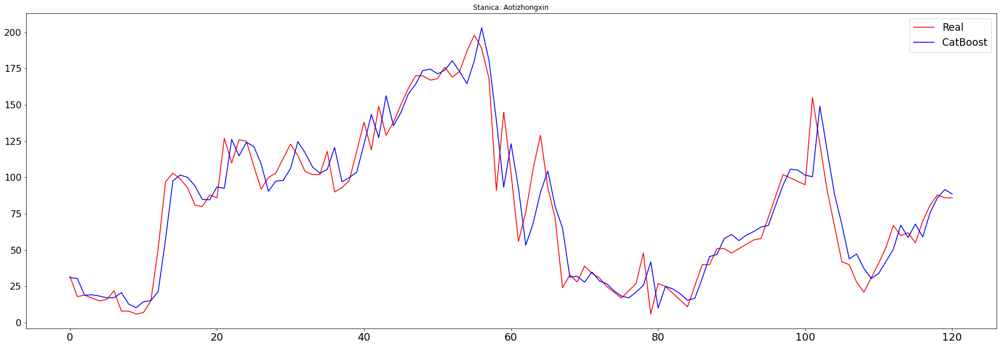

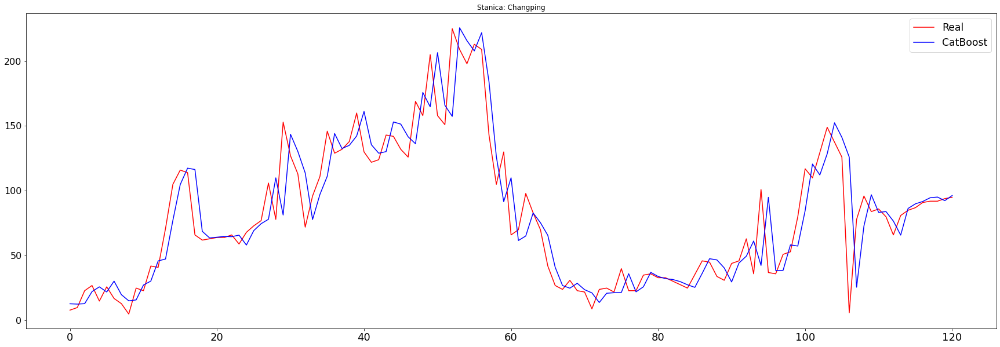

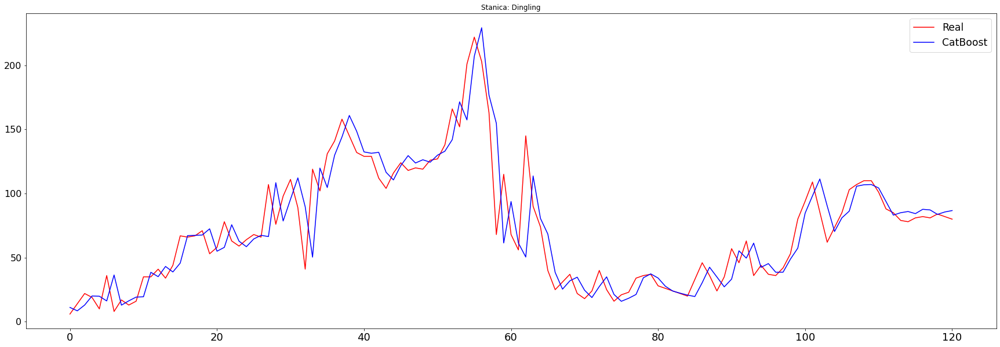

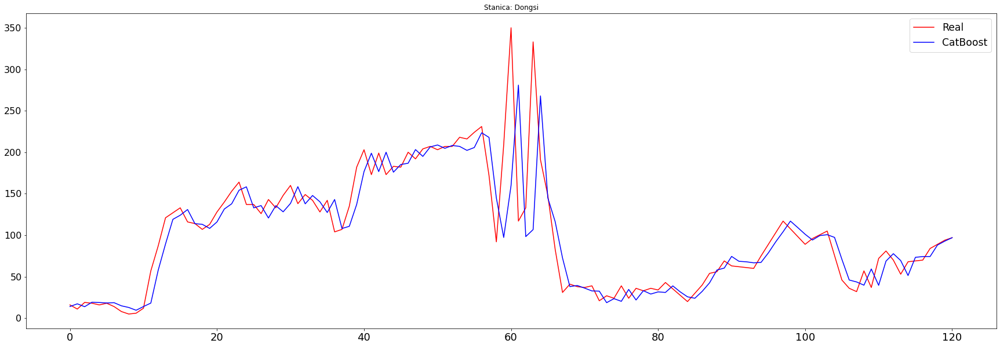

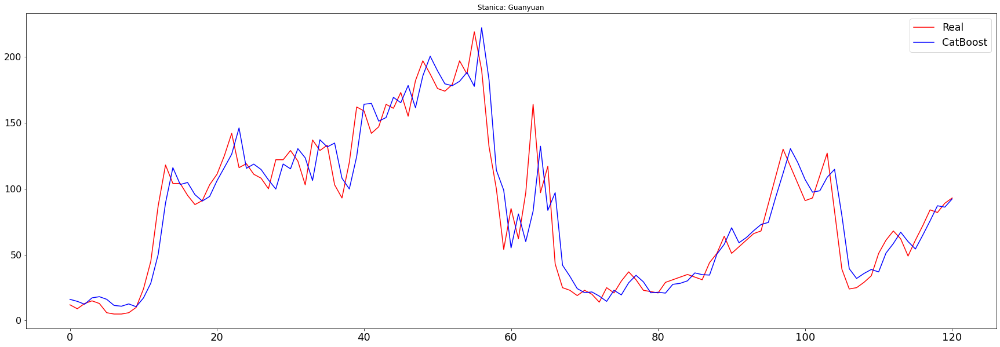

...

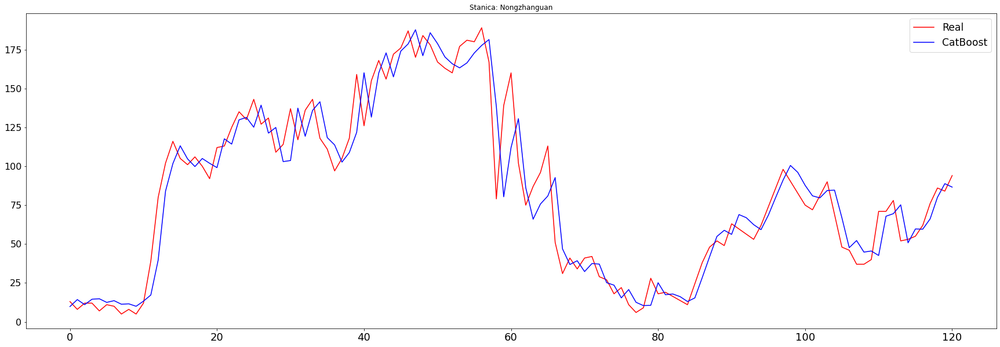

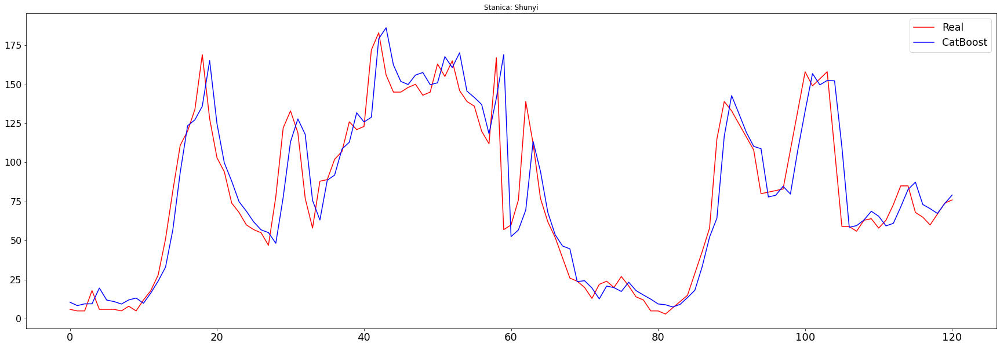

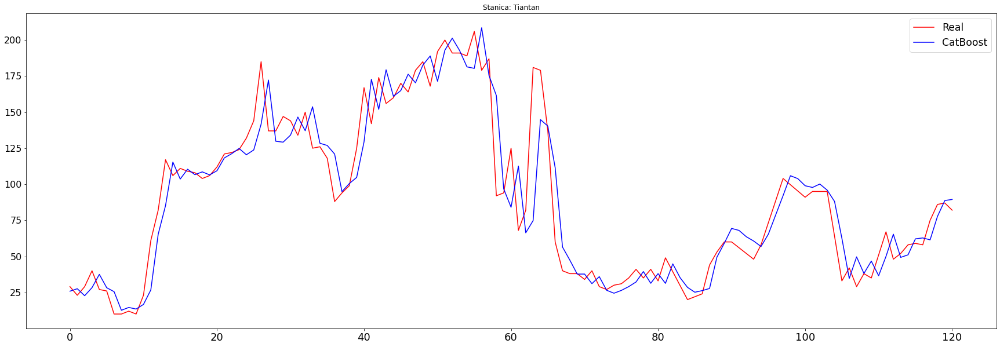

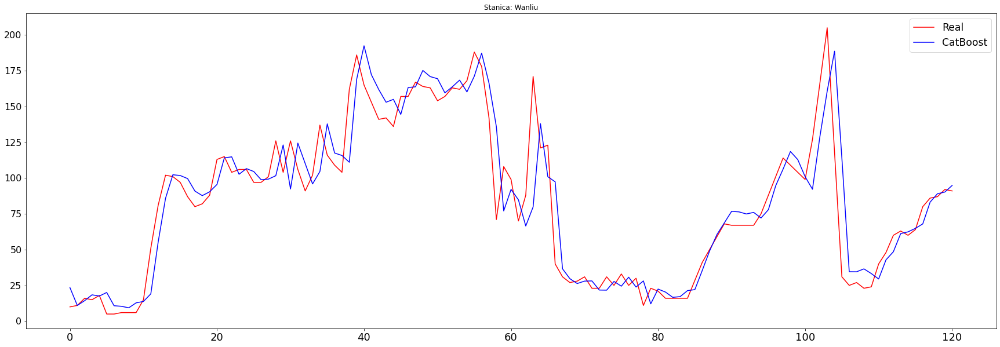

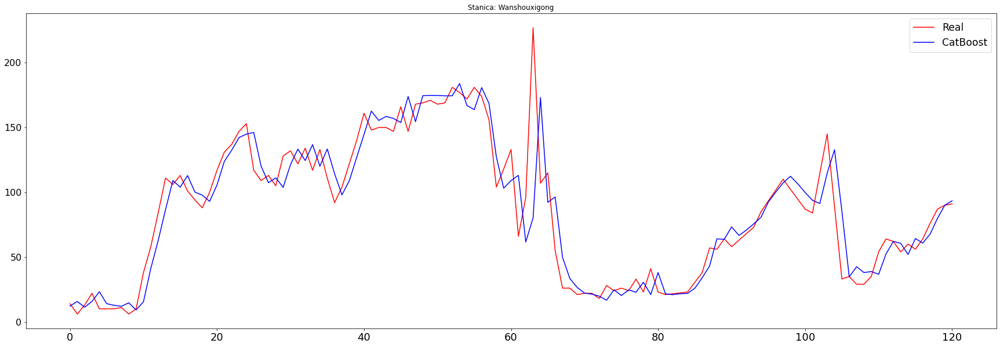

In [427]:
for i in range(0,len(reframedPM10)):
  plt.figure(figsize=(30, 10))
  plt.plot(np.arange(len(X_testPM10[i])), y_testPM10[i], label='Real', color='r')
  plt.plot(np.arange(len(X_testPM10[i])), predsPM10[i], label='CatBoost', color='blue')
  plt.legend(loc='best', fontsize='xx-large')
  plt.xticks(fontsize=18)
  plt.yticks(fontsize=16)
  plt.title('Stanica: '+ stations[i].split('_')[0])
plt.show()

In [428]:
# => Predvidjanje NO2 na osnovu vrednosti polutanata u prethodnom satu i prognoze meteroloskih podataka za taj sat

In [429]:
reframedNO2=[]
for i in reframed:
    pom=i.drop(i.columns[[0,7,8,9,10,11,12,13,14,15,16,17,19,20]],axis=1).copy()
    reframedNO2.append(pom)
Dingling_reframedNO2 = reframedNO2[2]
Huairou_reframedNO2 = reframedNO2[6]
Aotizhongxin_reframedNO2 = reframedNO2[0]
Changping_reframedNO2 = reframedNO2[1]
Dongsi_reframedNO2 = reframedNO2[3]
Guanyuan_reframedNO2 = reframedNO2[4]
Nongzhanguan_reframedNO2 = reframedNO2[7]
Shunyi_reframedNO2 = reframedNO2[8]
Tiantan_reframedNO2 = reframedNO2[9]
Wanliu_reframedNO2 = reframedNO2[10]
Wanshouxigong_reframedNO2 = reframedNO2[11]
Gucheng_reframedNO2 = reframedNO2[5]

In [430]:
Dingling_reframedNO2.head(5) 
# var5(t-1) Koncentracija NO2 u prethodnom satu
# var5(t) Koncentracija NO2 za naredni sat

,var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var5(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t)
2013-03-01 01:00:00,4.0,4.0,3.0,7.0,200.0,82.0,6.0,-2.5,1021.3,-19.0,0.0,0.0,0.7,0.0
2013-03-01 02:00:00,7.0,7.0,3.0,6.0,200.0,80.0,2.0,-3.0,1021.3,-19.9,0.0,0.0,0.2,0.0
2013-03-01 03:00:00,5.0,5.0,3.0,2.0,200.0,79.0,8.0,-3.6,1021.8,-19.1,0.0,0.0,1.0,0.0
2013-03-01 04:00:00,6.0,6.0,3.0,8.0,200.0,79.0,8.0,-3.5,1022.3,-19.4,0.0,0.0,2.1,0.0
2013-03-01 05:00:00,5.0,5.0,3.0,8.0,200.0,81.0,4.0,-4.5,1022.6,-19.5,0.0,0.0,1.7,0.0


In [431]:
XNO2=[]
yNO2=[]

for i in reframedNO2:
    pom=i.copy()
    pom=pom.drop('var5(t)',axis=1)
    XNO2.append(pom.copy())
    yNO2.append(i['var5(t)'])

In [432]:
n_len=34780
X_trainNO2=[]
X_testNO2=[]
y_trainNO2=[]
y_testNO2=[]

for i in XNO2:
  X_trainNO2.append(i.iloc[:n_len])
  X_testNO2.append(i.iloc[n_len:34901])
for i in yNO2:
  y_trainNO2.append(i.iloc[:n_len])
  y_testNO2.append(i.iloc[n_len:34901])

In [433]:
X_trainNO2all=pd.concat(X_trainNO2,ignore_index=True)
X_testNO2all=pd.concat(X_testNO2,ignore_index=True)
y_trainNO2all=pd.concat(y_trainNO2,ignore_index=True)
y_testNO2all=pd.concat(y_testNO2,ignore_index=True)

In [434]:
modelNO2=CatBoostRegressor(iterations=1500,
                          depth=10, 
                          learning_rate = 0.01, 
                          loss_function='RMSE',
                          eval_metric = 'RMSE',
                          random_seed = 55,
                          od_type = "Iter",
                          metric_period = 1,
                          od_wait = 20
                          )

In [435]:
modelNO2.fit(X_trainNO2all,y_trainNO2all)

0:	learn: 34.8858036	total: 57.2ms	remaining: 1m 25s
1:	learn: 34.5834722	total: 116ms	remaining: 1m 27s
2:	learn: 34.2832210	total: 175ms	remaining: 1m 27s
3:	learn: 33.9872864	total: 235ms	remaining: 1m 27s
4:	learn: 33.6957951	total: 299ms	remaining: 1m 29s
5:	learn: 33.4080058	total: 372ms	remaining: 1m 32s
6:	learn: 33.1210475	total: 433ms	remaining: 1m 32s
7:	learn: 32.8380813	total: 499ms	remaining: 1m 33s
8:	learn: 32.5567401	total: 562ms	remaining: 1m 33s
9:	learn: 32.2790433	total: 621ms	remaining: 1m 32s
10:	learn: 32.0036486	total: 681ms	remaining: 1m 32s
11:	learn: 31.7315284	total: 740ms	remaining: 1m 31s
12:	learn: 31.4630586	total: 803ms	remaining: 1m 31s
13:	learn: 31.1982265	total: 862ms	remaining: 1m 31s
14:	learn: 30.9381747	total: 920ms	remaining: 1m 31s
15:	learn: 30.6799566	total: 977ms	remaining: 1m 30s
16:	learn: 30.4223477	total: 1.04s	remaining: 1m 30s
17:	learn: 30.1688247	total: 1.1s	remaining: 1m 30s
18:	learn: 29.9166319	total: 1.16s	remaining: 1m 30s
19:

155:	learn: 13.4162774	total: 9.87s	remaining: 1m 25s
156:	learn: 13.3768979	total: 9.93s	remaining: 1m 24s
157:	learn: 13.3379189	total: 9.99s	remaining: 1m 24s
158:	learn: 13.2999395	total: 10s	remaining: 1m 24s
159:	learn: 13.2630258	total: 10.1s	remaining: 1m 24s
160:	learn: 13.2263461	total: 10.2s	remaining: 1m 24s
161:	learn: 13.1904089	total: 10.2s	remaining: 1m 24s
162:	learn: 13.1545943	total: 10.3s	remaining: 1m 24s
163:	learn: 13.1188377	total: 10.4s	remaining: 1m 24s
164:	learn: 13.0836312	total: 10.4s	remaining: 1m 24s
165:	learn: 13.0492731	total: 10.5s	remaining: 1m 24s
166:	learn: 13.0155250	total: 10.5s	remaining: 1m 24s
167:	learn: 12.9819491	total: 10.6s	remaining: 1m 24s
168:	learn: 12.9496602	total: 10.7s	remaining: 1m 24s
169:	learn: 12.9178853	total: 10.7s	remaining: 1m 23s
170:	learn: 12.8862292	total: 10.8s	remaining: 1m 23s
171:	learn: 12.8550363	total: 10.8s	remaining: 1m 23s
172:	learn: 12.8242165	total: 10.9s	remaining: 1m 23s
173:	learn: 12.7937210	total: 

310:	learn: 11.1224621	total: 19.5s	remaining: 1m 14s
311:	learn: 11.1188356	total: 19.6s	remaining: 1m 14s
312:	learn: 11.1152291	total: 19.7s	remaining: 1m 14s
313:	learn: 11.1113342	total: 19.7s	remaining: 1m 14s
314:	learn: 11.1076438	total: 19.8s	remaining: 1m 14s
315:	learn: 11.1039150	total: 19.9s	remaining: 1m 14s
316:	learn: 11.1001577	total: 19.9s	remaining: 1m 14s
317:	learn: 11.0964551	total: 20s	remaining: 1m 14s
318:	learn: 11.0932566	total: 20s	remaining: 1m 14s
319:	learn: 11.0902418	total: 20.1s	remaining: 1m 14s
320:	learn: 11.0866291	total: 20.2s	remaining: 1m 14s
321:	learn: 11.0835071	total: 20.3s	remaining: 1m 14s
322:	learn: 11.0805268	total: 20.3s	remaining: 1m 14s
323:	learn: 11.0776825	total: 20.4s	remaining: 1m 13s
324:	learn: 11.0746930	total: 20.4s	remaining: 1m 13s
325:	learn: 11.0716536	total: 20.5s	remaining: 1m 13s
326:	learn: 11.0688277	total: 20.6s	remaining: 1m 13s
327:	learn: 11.0658445	total: 20.6s	remaining: 1m 13s
328:	learn: 11.0627218	total: 20

466:	learn: 10.8362508	total: 29.8s	remaining: 1m 5s
467:	learn: 10.8353323	total: 29.9s	remaining: 1m 5s
468:	learn: 10.8344119	total: 29.9s	remaining: 1m 5s
469:	learn: 10.8332665	total: 30s	remaining: 1m 5s
470:	learn: 10.8322227	total: 30s	remaining: 1m 5s
471:	learn: 10.8311869	total: 30.1s	remaining: 1m 5s
472:	learn: 10.8302911	total: 30.2s	remaining: 1m 5s
473:	learn: 10.8293525	total: 30.2s	remaining: 1m 5s
474:	learn: 10.8283913	total: 30.3s	remaining: 1m 5s
475:	learn: 10.8273400	total: 30.4s	remaining: 1m 5s
476:	learn: 10.8267426	total: 30.4s	remaining: 1m 5s
477:	learn: 10.8257038	total: 30.5s	remaining: 1m 5s
478:	learn: 10.8248057	total: 30.6s	remaining: 1m 5s
479:	learn: 10.8236769	total: 30.6s	remaining: 1m 5s
480:	learn: 10.8228420	total: 30.7s	remaining: 1m 5s
481:	learn: 10.8218689	total: 30.8s	remaining: 1m 4s
482:	learn: 10.8207881	total: 30.8s	remaining: 1m 4s
483:	learn: 10.8199873	total: 30.9s	remaining: 1m 4s
484:	learn: 10.8192693	total: 30.9s	remaining: 1m 

625:	learn: 10.7201734	total: 40.3s	remaining: 56.3s
626:	learn: 10.7193167	total: 40.4s	remaining: 56.3s
627:	learn: 10.7188634	total: 40.5s	remaining: 56.2s
628:	learn: 10.7182267	total: 40.5s	remaining: 56.1s
629:	learn: 10.7174882	total: 40.6s	remaining: 56.1s
630:	learn: 10.7169569	total: 40.7s	remaining: 56s
631:	learn: 10.7163109	total: 40.7s	remaining: 55.9s
632:	learn: 10.7157135	total: 40.8s	remaining: 55.9s
633:	learn: 10.7152862	total: 40.8s	remaining: 55.8s
634:	learn: 10.7145538	total: 40.9s	remaining: 55.7s
635:	learn: 10.7140356	total: 41s	remaining: 55.7s
636:	learn: 10.7136987	total: 41s	remaining: 55.6s
637:	learn: 10.7130436	total: 41.1s	remaining: 55.5s
638:	learn: 10.7124609	total: 41.2s	remaining: 55.5s
639:	learn: 10.7117483	total: 41.2s	remaining: 55.4s
640:	learn: 10.7113619	total: 41.3s	remaining: 55.4s
641:	learn: 10.7109179	total: 41.4s	remaining: 55.3s
642:	learn: 10.7103097	total: 41.4s	remaining: 55.2s
643:	learn: 10.7098280	total: 41.5s	remaining: 55.2s

784:	learn: 10.6409269	total: 51.1s	remaining: 46.5s
785:	learn: 10.6401386	total: 51.1s	remaining: 46.5s
786:	learn: 10.6398110	total: 51.2s	remaining: 46.4s
787:	learn: 10.6394589	total: 51.3s	remaining: 46.3s
788:	learn: 10.6392171	total: 51.3s	remaining: 46.3s
789:	learn: 10.6388320	total: 51.4s	remaining: 46.2s
790:	learn: 10.6383459	total: 51.5s	remaining: 46.1s
791:	learn: 10.6380465	total: 51.5s	remaining: 46.1s
792:	learn: 10.6374418	total: 51.6s	remaining: 46s
793:	learn: 10.6369265	total: 51.6s	remaining: 45.9s
794:	learn: 10.6364270	total: 51.7s	remaining: 45.9s
795:	learn: 10.6359709	total: 51.8s	remaining: 45.8s
796:	learn: 10.6356864	total: 51.8s	remaining: 45.7s
797:	learn: 10.6352366	total: 51.9s	remaining: 45.6s
798:	learn: 10.6348105	total: 52s	remaining: 45.6s
799:	learn: 10.6345021	total: 52s	remaining: 45.5s
800:	learn: 10.6341799	total: 52.1s	remaining: 45.4s
801:	learn: 10.6337515	total: 52.2s	remaining: 45.4s
802:	learn: 10.6333335	total: 52.2s	remaining: 45.3s

943:	learn: 10.5797585	total: 1m 1s	remaining: 36.4s
944:	learn: 10.5794787	total: 1m 1s	remaining: 36.4s
945:	learn: 10.5792884	total: 1m 1s	remaining: 36.3s
946:	learn: 10.5787477	total: 1m 2s	remaining: 36.2s
947:	learn: 10.5783024	total: 1m 2s	remaining: 36.2s
948:	learn: 10.5779491	total: 1m 2s	remaining: 36.1s
949:	learn: 10.5775770	total: 1m 2s	remaining: 36s
950:	learn: 10.5772198	total: 1m 2s	remaining: 36s
951:	learn: 10.5769136	total: 1m 2s	remaining: 35.9s
952:	learn: 10.5764357	total: 1m 2s	remaining: 35.8s
953:	learn: 10.5761689	total: 1m 2s	remaining: 35.8s
954:	learn: 10.5756909	total: 1m 2s	remaining: 35.7s
955:	learn: 10.5753344	total: 1m 2s	remaining: 35.6s
956:	learn: 10.5751043	total: 1m 2s	remaining: 35.6s
957:	learn: 10.5748247	total: 1m 2s	remaining: 35.5s
958:	learn: 10.5742708	total: 1m 2s	remaining: 35.4s
959:	learn: 10.5738557	total: 1m 2s	remaining: 35.4s
960:	learn: 10.5735833	total: 1m 2s	remaining: 35.3s
961:	learn: 10.5731042	total: 1m 3s	remaining: 35.

1097:	learn: 10.5261545	total: 1m 12s	remaining: 26.4s
1098:	learn: 10.5257860	total: 1m 12s	remaining: 26.3s
1099:	learn: 10.5255148	total: 1m 12s	remaining: 26.3s
1100:	learn: 10.5250637	total: 1m 12s	remaining: 26.2s
1101:	learn: 10.5248183	total: 1m 12s	remaining: 26.2s
1102:	learn: 10.5244763	total: 1m 12s	remaining: 26.1s
1103:	learn: 10.5242036	total: 1m 12s	remaining: 26s
1104:	learn: 10.5237493	total: 1m 12s	remaining: 26s
1105:	learn: 10.5235770	total: 1m 12s	remaining: 25.9s
1106:	learn: 10.5233190	total: 1m 12s	remaining: 25.8s
1107:	learn: 10.5228918	total: 1m 12s	remaining: 25.8s
1108:	learn: 10.5225676	total: 1m 12s	remaining: 25.7s
1109:	learn: 10.5222436	total: 1m 12s	remaining: 25.6s
1110:	learn: 10.5219628	total: 1m 13s	remaining: 25.6s
1111:	learn: 10.5216260	total: 1m 13s	remaining: 25.5s
1112:	learn: 10.5213199	total: 1m 13s	remaining: 25.4s
1113:	learn: 10.5209174	total: 1m 13s	remaining: 25.4s
1114:	learn: 10.5207044	total: 1m 13s	remaining: 25.3s
1115:	learn: 1

1249:	learn: 10.4786060	total: 1m 23s	remaining: 16.6s
1250:	learn: 10.4783062	total: 1m 23s	remaining: 16.6s
1251:	learn: 10.4779376	total: 1m 23s	remaining: 16.5s
1252:	learn: 10.4777051	total: 1m 23s	remaining: 16.4s
1253:	learn: 10.4774622	total: 1m 23s	remaining: 16.4s
1254:	learn: 10.4772821	total: 1m 23s	remaining: 16.3s
1255:	learn: 10.4770698	total: 1m 23s	remaining: 16.2s
1256:	learn: 10.4768695	total: 1m 23s	remaining: 16.2s
1257:	learn: 10.4766047	total: 1m 23s	remaining: 16.1s
1258:	learn: 10.4762609	total: 1m 23s	remaining: 16.1s
1259:	learn: 10.4760164	total: 1m 23s	remaining: 16s
1260:	learn: 10.4756872	total: 1m 24s	remaining: 15.9s
1261:	learn: 10.4754391	total: 1m 24s	remaining: 15.9s
1262:	learn: 10.4751559	total: 1m 24s	remaining: 15.8s
1263:	learn: 10.4749356	total: 1m 24s	remaining: 15.7s
1264:	learn: 10.4746364	total: 1m 24s	remaining: 15.7s
1265:	learn: 10.4744115	total: 1m 24s	remaining: 15.6s
1266:	learn: 10.4741448	total: 1m 24s	remaining: 15.5s
1267:	learn:

1400:	learn: 10.4348810	total: 1m 34s	remaining: 6.66s
1401:	learn: 10.4345284	total: 1m 34s	remaining: 6.59s
1402:	learn: 10.4341869	total: 1m 34s	remaining: 6.53s
1403:	learn: 10.4339395	total: 1m 34s	remaining: 6.46s
1404:	learn: 10.4335634	total: 1m 34s	remaining: 6.39s
1405:	learn: 10.4332100	total: 1m 34s	remaining: 6.33s
1406:	learn: 10.4329645	total: 1m 34s	remaining: 6.26s
1407:	learn: 10.4326224	total: 1m 34s	remaining: 6.19s
1408:	learn: 10.4323973	total: 1m 34s	remaining: 6.12s
1409:	learn: 10.4319486	total: 1m 34s	remaining: 6.06s
1410:	learn: 10.4316934	total: 1m 34s	remaining: 5.99s
1411:	learn: 10.4314377	total: 1m 35s	remaining: 5.92s
1412:	learn: 10.4311749	total: 1m 35s	remaining: 5.86s
1413:	learn: 10.4309778	total: 1m 35s	remaining: 5.79s
1414:	learn: 10.4307817	total: 1m 35s	remaining: 5.72s
1415:	learn: 10.4304020	total: 1m 35s	remaining: 5.66s
1416:	learn: 10.4300622	total: 1m 35s	remaining: 5.59s
1417:	learn: 10.4295840	total: 1m 35s	remaining: 5.52s
1418:	lear

In [436]:
predsNO2=[]

for i in range(0,len(reframedNO2)):
  predsNO2.append(modelNO2.predict(X_testNO2[i]))
  

In [437]:
for i in range(0,len(reframedNO2)):
  print('Stanica: '+ stations[i].split('_')[0])
  rmse = math.sqrt(mean_squared_error(y_testNO2[i], predsNO2[i]))
  mae= mean_absolute_error(y_testNO2[i], predsNO2[i])
  R2 = r2_score(y_testNO2[i],predsNO2[i])
  print('Test RMSE: %.3f' % rmse)
  print('Test MAE: %.3f' % mae)
  print('R2 SCORE: {}'.format(R2))
  print(' ------------ ')

Stanica: Aotizhongxin
Test RMSE: 6.844
Test MAE: 4.911
R2 SCORE: 0.9511713356209643
 ------------ 
Stanica: Changping
Test RMSE: 14.297
Test MAE: 9.403
R2 SCORE: 0.8154493979774933
 ------------ 
Stanica: Dingling
Test RMSE: 8.114
Test MAE: 5.280
R2 SCORE: 0.9251603856273689
 ------------ 
Stanica: Dongsi
Test RMSE: 7.228
Test MAE: 5.333
R2 SCORE: 0.93964147626828
 ------------ 
Stanica: Guanyuan
Test RMSE: 8.239
Test MAE: 5.260
R2 SCORE: 0.9190355277876445
 ------------ 
Stanica: Gucheng
Test RMSE: 9.312
Test MAE: 6.548
R2 SCORE: 0.9250088429675177
 ------------ 
Stanica: Huairou
Test RMSE: 10.479
Test MAE: 7.536
R2 SCORE: 0.8778804207445844
 ------------ 
Stanica: Nongzhanguan
Test RMSE: 7.730
Test MAE: 5.518
R2 SCORE: 0.9271533437937709
 ------------ 
Stanica: Shunyi
Test RMSE: 9.649
Test MAE: 6.198
R2 SCORE: 0.9221848809092446
 ------------ 
Stanica: Tiantan
Test RMSE: 7.790
Test MAE: 5.823
R2 SCORE: 0.9337079447101847
 ------------ 
Stanica: Wanliu
Test RMSE: 10.640
Test MAE: 6.78

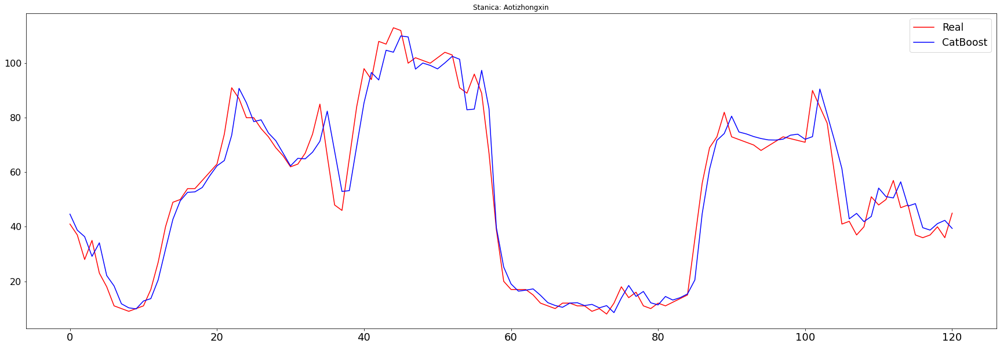

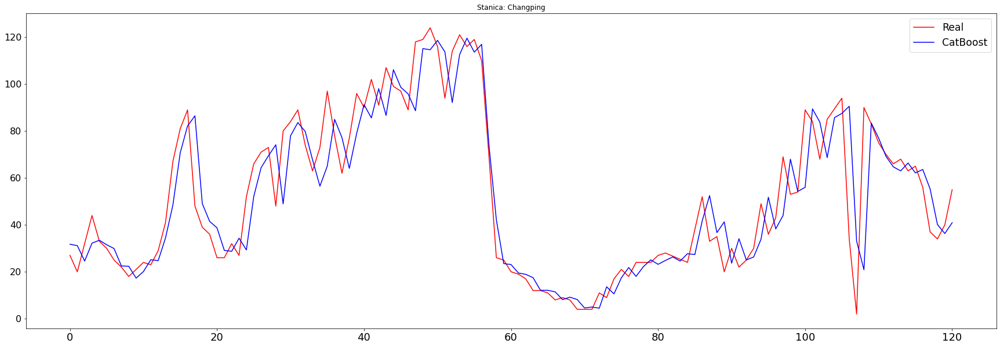

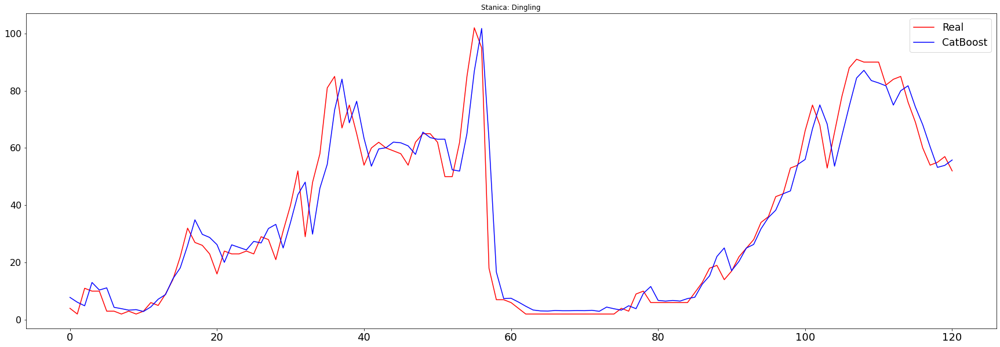

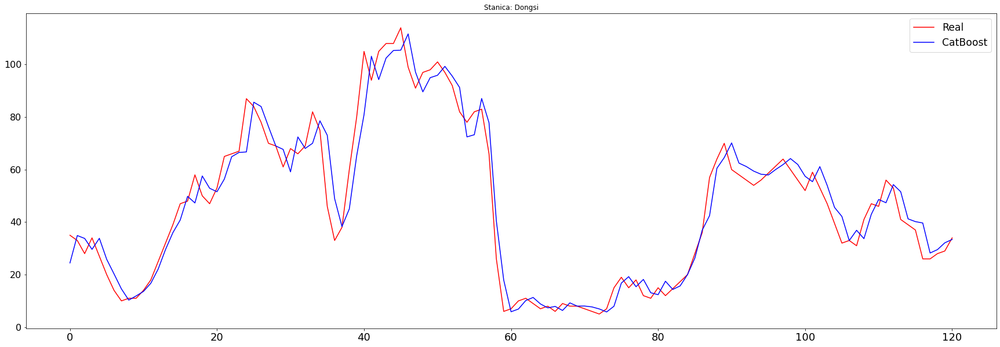

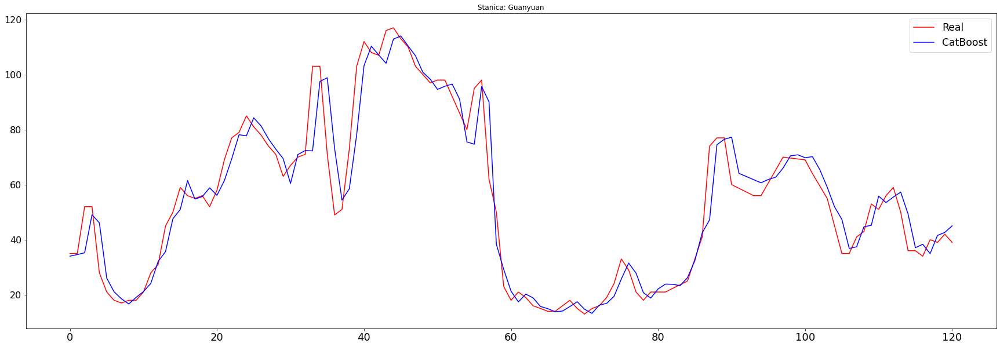

...

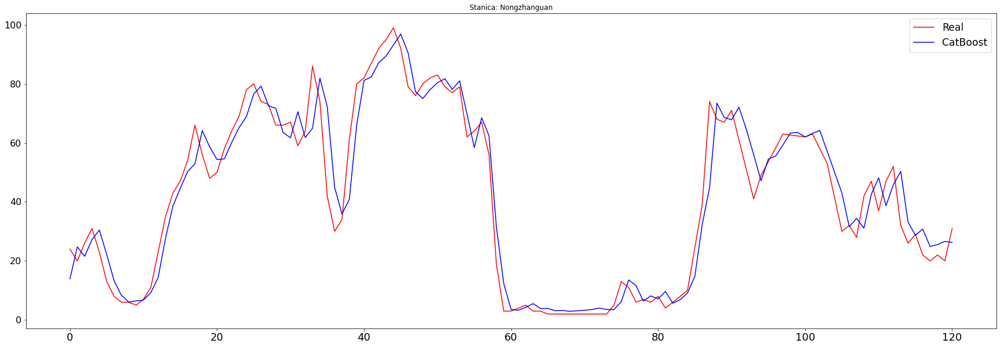

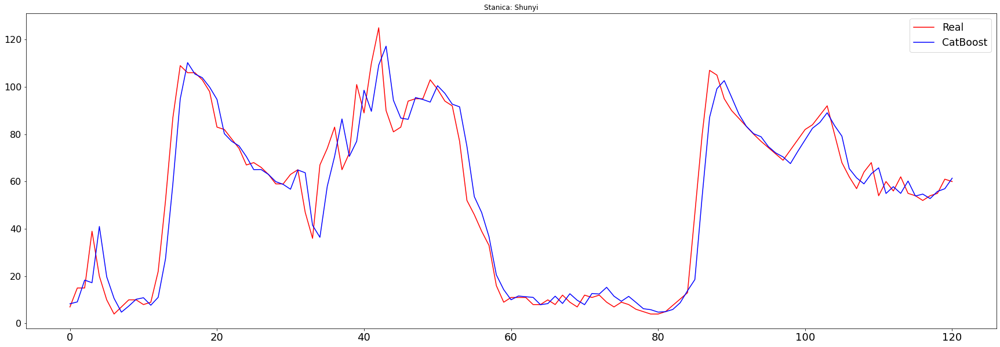

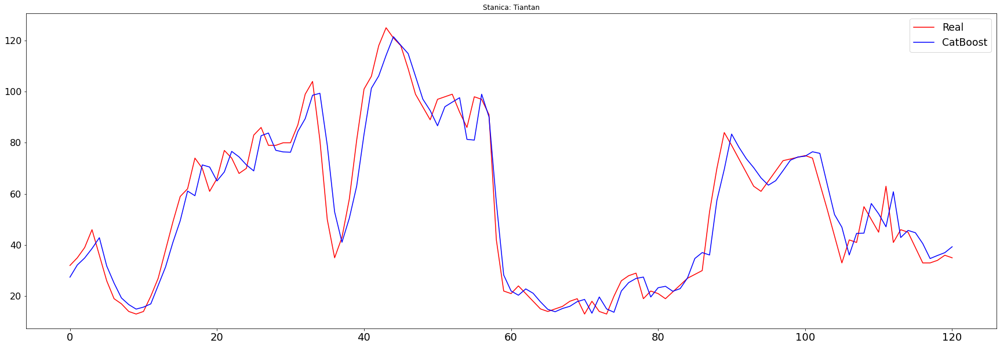

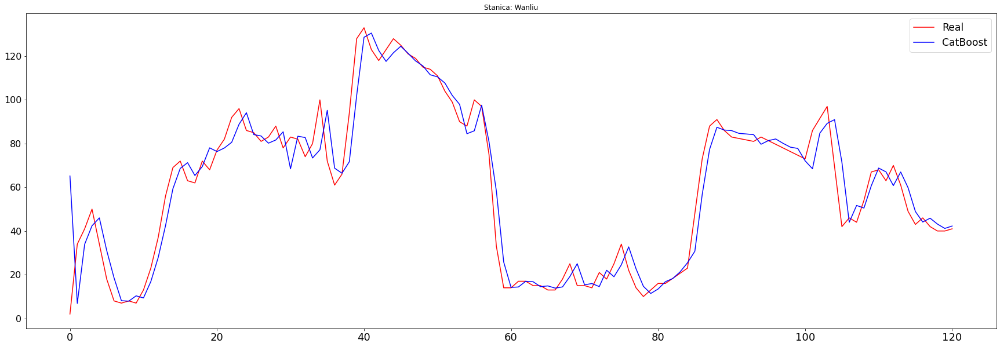

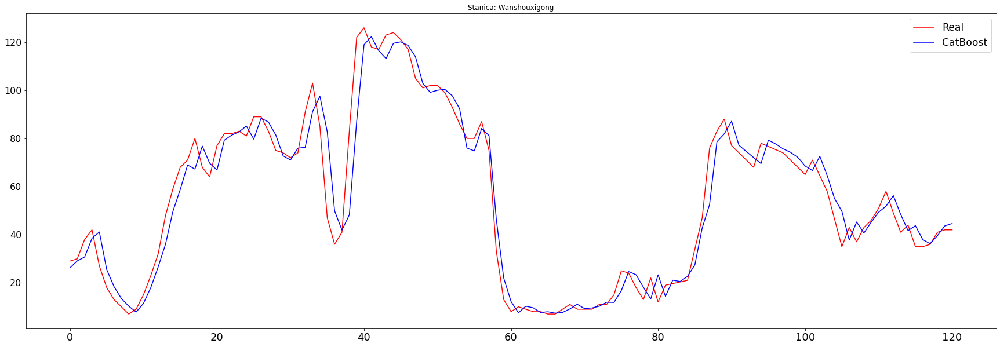

In [438]:
for i in range(0,len(reframedNO2)):
  plt.figure(figsize=(30, 10))
  plt.plot(np.arange(len(X_testNO2[i])), y_testNO2[i], label='Real', color='r')
  plt.plot(np.arange(len(X_testNO2[i])), predsNO2[i], label='CatBoost', color='blue')
  plt.legend(loc='best', fontsize='xx-large')
  plt.xticks(fontsize=18)
  plt.yticks(fontsize=16)
  plt.title('Stanica: '+ stations[i].split('_')[0])
plt.show()

In [439]:
# => Predvidjanje CO na osnovu vrednosti polutanata u prethodnom satu i prognoze meteroloskih podataka za taj sat

reframedCO=[]
for i in reframed:
    pom=i.drop(i.columns[[0,7,8,9,10,11,12,13,14,15,16,17,18,20]],axis=1).copy()
    reframedCO.append(pom)
Dingling_reframedCO = reframedCO[2]
Huairou_reframedCO = reframedCO[6]
Aotizhongxin_reframedCO = reframedCO[0]
Changping_reframedCO = reframedCO[1]
Dongsi_reframedCO = reframedCO[3]
Guanyuan_reframedCO = reframedCO[4]
Nongzhanguan_reframedCO = reframedCO[7]
Shunyi_reframedCO = reframedCO[8]
Tiantan_reframedCO = reframedCO[9]
Wanliu_reframedCO = reframedCO[10]
Wanshouxigong_reframedCO = reframedCO[11]
Gucheng_reframedCO = reframedCO[5]


In [440]:
Dingling_reframedCO.head(5) 
# var6(t-1) Koncentracija CO u prethodnom satu
# var6(t) Koncentracija CO za naredni sat

,var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var6(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t)
2013-03-01 01:00:00,4.0,4.0,3.0,7.0,200.0,82.0,200.0,-2.5,1021.3,-19.0,0.0,0.0,0.7,0.0
2013-03-01 02:00:00,7.0,7.0,3.0,6.0,200.0,80.0,200.0,-3.0,1021.3,-19.9,0.0,0.0,0.2,0.0
2013-03-01 03:00:00,5.0,5.0,3.0,2.0,200.0,79.0,200.0,-3.6,1021.8,-19.1,0.0,0.0,1.0,0.0
2013-03-01 04:00:00,6.0,6.0,3.0,8.0,200.0,79.0,200.0,-3.5,1022.3,-19.4,0.0,0.0,2.1,0.0
2013-03-01 05:00:00,5.0,5.0,3.0,8.0,200.0,81.0,200.0,-4.5,1022.6,-19.5,0.0,0.0,1.7,0.0


In [441]:
XCO=[]
yCO=[]

for i in reframedCO:
    pom=i.copy()
    pom=pom.drop('var6(t)',axis=1)
    XCO.append(pom.copy())
    yCO.append(i['var6(t)'])

In [442]:
n_len=34780
X_trainCO=[]
X_testCO=[]
y_trainCO=[]
y_testCO=[]

for i in XCO:
  X_trainCO.append(i.iloc[:n_len])
  X_testCO.append(i.iloc[n_len:34901])
for i in yCO:
  y_trainCO.append(i.iloc[:n_len])
  y_testCO.append(i.iloc[n_len:34901])

In [443]:
X_trainCOall=pd.concat(X_trainCO,ignore_index=True)
X_testCOall=pd.concat(X_testCO,ignore_index=True)
y_trainCOall=pd.concat(y_trainCO,ignore_index=True)
y_testCOall=pd.concat(y_testCO,ignore_index=True)

In [444]:
from catboost import Pool, CatBoostRegressor

modelCO=CatBoostRegressor(iterations=1500,
                          depth=10, 
                          learning_rate = 0.01, 
                          loss_function='RMSE',
                          eval_metric = 'RMSE',
                          random_seed = 55,
                          od_type = "Iter",
                          metric_period = 1,
                          od_wait = 20
                          )

In [445]:
modelCO.fit(X_trainCOall,y_trainCOall)

0:	learn: 1160.0626066	total: 55.6ms	remaining: 1m 23s
1:	learn: 1149.8789998	total: 111ms	remaining: 1m 22s
2:	learn: 1139.8013427	total: 168ms	remaining: 1m 23s
3:	learn: 1129.7860446	total: 231ms	remaining: 1m 26s
4:	learn: 1119.8987684	total: 296ms	remaining: 1m 28s
5:	learn: 1110.1494071	total: 354ms	remaining: 1m 28s
6:	learn: 1100.5069228	total: 413ms	remaining: 1m 28s
7:	learn: 1090.9260640	total: 471ms	remaining: 1m 27s
8:	learn: 1081.4449160	total: 531ms	remaining: 1m 27s
9:	learn: 1072.0868329	total: 591ms	remaining: 1m 27s
10:	learn: 1062.8502847	total: 649ms	remaining: 1m 27s
11:	learn: 1053.6962944	total: 708ms	remaining: 1m 27s
12:	learn: 1044.6706082	total: 769ms	remaining: 1m 27s
13:	learn: 1035.7415868	total: 829ms	remaining: 1m 27s
14:	learn: 1026.9513280	total: 888ms	remaining: 1m 27s
15:	learn: 1018.2341801	total: 952ms	remaining: 1m 28s
16:	learn: 1009.5979034	total: 1.01s	remaining: 1m 28s
17:	learn: 1001.0031927	total: 1.07s	remaining: 1m 28s
18:	learn: 992.5211

153:	learn: 429.5656355	total: 9.89s	remaining: 1m 26s
154:	learn: 428.1170231	total: 9.95s	remaining: 1m 26s
155:	learn: 426.7033585	total: 10s	remaining: 1m 26s
156:	learn: 425.3048509	total: 10.1s	remaining: 1m 26s
157:	learn: 423.9192228	total: 10.1s	remaining: 1m 26s
158:	learn: 422.5597931	total: 10.2s	remaining: 1m 26s
159:	learn: 421.2227451	total: 10.3s	remaining: 1m 26s
160:	learn: 419.8880697	total: 10.3s	remaining: 1m 25s
161:	learn: 418.5772207	total: 10.4s	remaining: 1m 25s
162:	learn: 417.3003035	total: 10.5s	remaining: 1m 25s
163:	learn: 416.0468659	total: 10.5s	remaining: 1m 25s
164:	learn: 414.8164732	total: 10.6s	remaining: 1m 25s
165:	learn: 413.5829693	total: 10.6s	remaining: 1m 25s
166:	learn: 412.3676787	total: 10.7s	remaining: 1m 25s
167:	learn: 411.1786130	total: 10.8s	remaining: 1m 25s
168:	learn: 410.0068948	total: 10.8s	remaining: 1m 25s
169:	learn: 408.8557301	total: 10.9s	remaining: 1m 25s
170:	learn: 407.7226084	total: 11s	remaining: 1m 25s
171:	learn: 40

303:	learn: 345.1622952	total: 19.9s	remaining: 1m 18s
304:	learn: 345.0203972	total: 19.9s	remaining: 1m 18s
305:	learn: 344.8715189	total: 20s	remaining: 1m 18s
306:	learn: 344.7321328	total: 20.1s	remaining: 1m 17s
307:	learn: 344.5888951	total: 20.1s	remaining: 1m 17s
308:	learn: 344.4540921	total: 20.2s	remaining: 1m 17s
309:	learn: 344.3237448	total: 20.3s	remaining: 1m 17s
310:	learn: 344.1865573	total: 20.3s	remaining: 1m 17s
311:	learn: 344.0515207	total: 20.4s	remaining: 1m 17s
312:	learn: 343.9144263	total: 20.4s	remaining: 1m 17s
313:	learn: 343.7989032	total: 20.5s	remaining: 1m 17s
314:	learn: 343.6646930	total: 20.6s	remaining: 1m 17s
315:	learn: 343.5276633	total: 20.6s	remaining: 1m 17s
316:	learn: 343.4095147	total: 20.7s	remaining: 1m 17s
317:	learn: 343.2811712	total: 20.8s	remaining: 1m 17s
318:	learn: 343.1561743	total: 20.8s	remaining: 1m 17s
319:	learn: 343.0379442	total: 20.9s	remaining: 1m 16s
320:	learn: 342.9264217	total: 20.9s	remaining: 1m 16s
321:	learn: 

455:	learn: 334.1409038	total: 29.9s	remaining: 1m 8s
456:	learn: 334.1069820	total: 29.9s	remaining: 1m 8s
457:	learn: 334.0720309	total: 30s	remaining: 1m 8s
458:	learn: 334.0296235	total: 30.1s	remaining: 1m 8s
459:	learn: 333.9922369	total: 30.2s	remaining: 1m 8s
460:	learn: 333.9577455	total: 30.3s	remaining: 1m 8s
461:	learn: 333.9189594	total: 30.3s	remaining: 1m 8s
462:	learn: 333.8715773	total: 30.4s	remaining: 1m 8s
463:	learn: 333.8414258	total: 30.5s	remaining: 1m 8s
464:	learn: 333.8071880	total: 30.6s	remaining: 1m 8s
465:	learn: 333.7697934	total: 30.6s	remaining: 1m 7s
466:	learn: 333.7340485	total: 30.7s	remaining: 1m 7s
467:	learn: 333.6948060	total: 30.8s	remaining: 1m 7s
468:	learn: 333.6626870	total: 30.8s	remaining: 1m 7s
469:	learn: 333.6232384	total: 30.9s	remaining: 1m 7s
470:	learn: 333.5920404	total: 31s	remaining: 1m 7s
471:	learn: 333.5593091	total: 31.1s	remaining: 1m 7s
472:	learn: 333.5361560	total: 31.1s	remaining: 1m 7s
473:	learn: 333.5092605	total: 3

612:	learn: 329.7754089	total: 40.2s	remaining: 58.2s
613:	learn: 329.7543274	total: 40.3s	remaining: 58.1s
614:	learn: 329.7363480	total: 40.4s	remaining: 58.1s
615:	learn: 329.7215055	total: 40.4s	remaining: 58s
616:	learn: 329.7047832	total: 40.5s	remaining: 57.9s
617:	learn: 329.6804605	total: 40.5s	remaining: 57.9s
618:	learn: 329.6565280	total: 40.6s	remaining: 57.8s
619:	learn: 329.6365210	total: 40.7s	remaining: 57.7s
620:	learn: 329.6186018	total: 40.7s	remaining: 57.7s
621:	learn: 329.5967735	total: 40.8s	remaining: 57.6s
622:	learn: 329.5723632	total: 40.9s	remaining: 57.5s
623:	learn: 329.5512347	total: 40.9s	remaining: 57.5s
624:	learn: 329.5288577	total: 41s	remaining: 57.4s
625:	learn: 329.5037092	total: 41.1s	remaining: 57.3s
626:	learn: 329.4820364	total: 41.1s	remaining: 57.3s
627:	learn: 329.4573292	total: 41.2s	remaining: 57.2s
628:	learn: 329.4372915	total: 41.3s	remaining: 57.2s
629:	learn: 329.4159375	total: 41.3s	remaining: 57.1s
630:	learn: 329.3884599	total: 4

767:	learn: 326.7726264	total: 50.5s	remaining: 48.1s
768:	learn: 326.7588621	total: 50.6s	remaining: 48.1s
769:	learn: 326.7344095	total: 50.6s	remaining: 48s
770:	learn: 326.7187324	total: 50.7s	remaining: 47.9s
771:	learn: 326.7032261	total: 50.8s	remaining: 47.9s
772:	learn: 326.6900647	total: 50.8s	remaining: 47.8s
773:	learn: 326.6733212	total: 50.9s	remaining: 47.7s
774:	learn: 326.6540554	total: 51s	remaining: 47.7s
775:	learn: 326.6415225	total: 51s	remaining: 47.6s
776:	learn: 326.6279043	total: 51.1s	remaining: 47.5s
777:	learn: 326.6017918	total: 51.1s	remaining: 47.5s
778:	learn: 326.5806660	total: 51.2s	remaining: 47.4s
779:	learn: 326.5572395	total: 51.3s	remaining: 47.3s
780:	learn: 326.5418382	total: 51.3s	remaining: 47.3s
781:	learn: 326.5298357	total: 51.4s	remaining: 47.2s
782:	learn: 326.5143002	total: 51.5s	remaining: 47.1s
783:	learn: 326.5036647	total: 51.5s	remaining: 47s
784:	learn: 326.4878816	total: 51.6s	remaining: 47s
785:	learn: 326.4759586	total: 51.7s	r

922:	learn: 324.1785206	total: 1m	remaining: 37.8s
923:	learn: 324.1560019	total: 1m	remaining: 37.7s
924:	learn: 324.1440146	total: 1m	remaining: 37.7s
925:	learn: 324.1348781	total: 1m	remaining: 37.6s
926:	learn: 324.1201652	total: 1m	remaining: 37.5s
927:	learn: 324.1102340	total: 1m	remaining: 37.5s
928:	learn: 324.0973773	total: 1m	remaining: 37.4s
929:	learn: 324.0829860	total: 1m	remaining: 37.3s
930:	learn: 324.0628018	total: 1m 1s	remaining: 37.3s
931:	learn: 324.0425457	total: 1m 1s	remaining: 37.2s
932:	learn: 324.0131564	total: 1m 1s	remaining: 37.2s
933:	learn: 323.9985066	total: 1m 1s	remaining: 37.1s
934:	learn: 323.9832425	total: 1m 1s	remaining: 37s
935:	learn: 323.9687620	total: 1m 1s	remaining: 37s
936:	learn: 323.9541127	total: 1m 1s	remaining: 36.9s
937:	learn: 323.9325638	total: 1m 1s	remaining: 36.8s
938:	learn: 323.9227347	total: 1m 1s	remaining: 36.8s
939:	learn: 323.9043179	total: 1m 1s	remaining: 36.7s
940:	learn: 323.8931990	total: 1m 1s	remaining: 36.7s
94

1075:	learn: 321.8841177	total: 1m 11s	remaining: 28s
1076:	learn: 321.8750433	total: 1m 11s	remaining: 28s
1077:	learn: 321.8549759	total: 1m 11s	remaining: 27.9s
1078:	learn: 321.8389186	total: 1m 11s	remaining: 27.8s
1079:	learn: 321.8309762	total: 1m 11s	remaining: 27.8s
1080:	learn: 321.8105779	total: 1m 11s	remaining: 27.7s
1081:	learn: 321.7961972	total: 1m 11s	remaining: 27.6s
1082:	learn: 321.7814606	total: 1m 11s	remaining: 27.6s
1083:	learn: 321.7630392	total: 1m 11s	remaining: 27.5s
1084:	learn: 321.7238975	total: 1m 11s	remaining: 27.4s
1085:	learn: 321.7125466	total: 1m 11s	remaining: 27.4s
1086:	learn: 321.6976768	total: 1m 11s	remaining: 27.3s
1087:	learn: 321.6822948	total: 1m 11s	remaining: 27.2s
1088:	learn: 321.6730012	total: 1m 12s	remaining: 27.2s
1089:	learn: 321.6576469	total: 1m 12s	remaining: 27.1s
1090:	learn: 321.6436243	total: 1m 12s	remaining: 27.1s
1091:	learn: 321.6282401	total: 1m 12s	remaining: 27s
1092:	learn: 321.6128299	total: 1m 12s	remaining: 26.9

1224:	learn: 319.7591186	total: 1m 21s	remaining: 18.3s
1225:	learn: 319.7419596	total: 1m 21s	remaining: 18.3s
1226:	learn: 319.7306616	total: 1m 21s	remaining: 18.2s
1227:	learn: 319.7184950	total: 1m 21s	remaining: 18.1s
1228:	learn: 319.7046058	total: 1m 21s	remaining: 18.1s
1229:	learn: 319.6922107	total: 1m 22s	remaining: 18s
1230:	learn: 319.6771126	total: 1m 22s	remaining: 17.9s
1231:	learn: 319.6646031	total: 1m 22s	remaining: 17.9s
1232:	learn: 319.6537324	total: 1m 22s	remaining: 17.8s
1233:	learn: 319.6461358	total: 1m 22s	remaining: 17.7s
1234:	learn: 319.6370195	total: 1m 22s	remaining: 17.7s
1235:	learn: 319.6271660	total: 1m 22s	remaining: 17.6s
1236:	learn: 319.6075435	total: 1m 22s	remaining: 17.5s
1237:	learn: 319.5974507	total: 1m 22s	remaining: 17.5s
1238:	learn: 319.5786391	total: 1m 22s	remaining: 17.4s
1239:	learn: 319.5566430	total: 1m 22s	remaining: 17.3s
1240:	learn: 319.5451948	total: 1m 22s	remaining: 17.3s
1241:	learn: 319.5279721	total: 1m 22s	remaining: 

1373:	learn: 317.8060787	total: 1m 31s	remaining: 8.42s
1374:	learn: 317.7965122	total: 1m 31s	remaining: 8.36s
1375:	learn: 317.7787185	total: 1m 31s	remaining: 8.29s
1376:	learn: 317.7642534	total: 1m 32s	remaining: 8.22s
1377:	learn: 317.7462124	total: 1m 32s	remaining: 8.16s
1378:	learn: 317.7335430	total: 1m 32s	remaining: 8.09s
1379:	learn: 317.7124468	total: 1m 32s	remaining: 8.02s
1380:	learn: 317.6990303	total: 1m 32s	remaining: 7.96s
1381:	learn: 317.6884530	total: 1m 32s	remaining: 7.89s
1382:	learn: 317.6746643	total: 1m 32s	remaining: 7.82s
1383:	learn: 317.6629033	total: 1m 32s	remaining: 7.76s
1384:	learn: 317.6450887	total: 1m 32s	remaining: 7.69s
1385:	learn: 317.6351517	total: 1m 32s	remaining: 7.63s
1386:	learn: 317.6228345	total: 1m 32s	remaining: 7.56s
1387:	learn: 317.6057108	total: 1m 32s	remaining: 7.49s
1388:	learn: 317.5965708	total: 1m 32s	remaining: 7.43s
1389:	learn: 317.5885784	total: 1m 33s	remaining: 7.36s
1390:	learn: 317.5784104	total: 1m 33s	remaining

In [446]:
predsCO=[]

for i in range(0,len(reframedCO)):
  predsCO.append(modelCO.predict(X_testCO[i]))

In [447]:
for i in range(0,len(reframedCO)):
  print('Stanica: '+ stations[i].split('_')[0])
  rmse = math.sqrt(mean_squared_error(y_testCO[i], predsCO[i]))
  mae= mean_absolute_error(y_testCO[i], predsCO[i])
  R2 = r2_score(y_testCO[i],predsCO[i])
  print('Test RMSE: %.3f' % rmse)
  print('Test MAE: %.3f' % mae)
  print('R2 SCORE: {}'.format(R2))
  print(' ------------ ')

Stanica: Aotizhongxin
Test RMSE: 339.493
Test MAE: 195.923
R2 SCORE: 0.7739220596128916
 ------------ 
Stanica: Changping
Test RMSE: 421.923
Test MAE: 241.335
R2 SCORE: 0.6402407937080709
 ------------ 
Stanica: Dingling
Test RMSE: 264.619
Test MAE: 150.257
R2 SCORE: 0.7716680081125851
 ------------ 
Stanica: Dongsi
Test RMSE: 371.939
Test MAE: 219.170
R2 SCORE: 0.6665175864524004
 ------------ 
Stanica: Guanyuan
Test RMSE: 270.507
Test MAE: 156.426
R2 SCORE: 0.6603904643457972
 ------------ 
Stanica: Gucheng
Test RMSE: 299.425
Test MAE: 162.703
R2 SCORE: 0.7545258550036356
 ------------ 
Stanica: Huairou
Test RMSE: 491.733
Test MAE: 293.080
R2 SCORE: 0.5607780530261253
 ------------ 
Stanica: Nongzhanguan
Test RMSE: 301.092
Test MAE: 171.594
R2 SCORE: 0.740917978198716
 ------------ 
Stanica: Shunyi
Test RMSE: 335.842
Test MAE: 195.524
R2 SCORE: 0.8562669482449488
 ------------ 
Stanica: Tiantan
Test RMSE: 306.117
Test MAE: 180.346
R2 SCORE: 0.7172252640774792
 ------------ 
Stanica: 

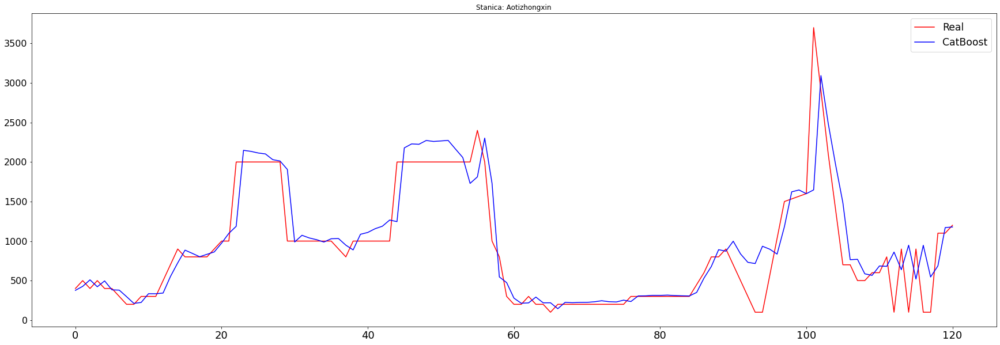

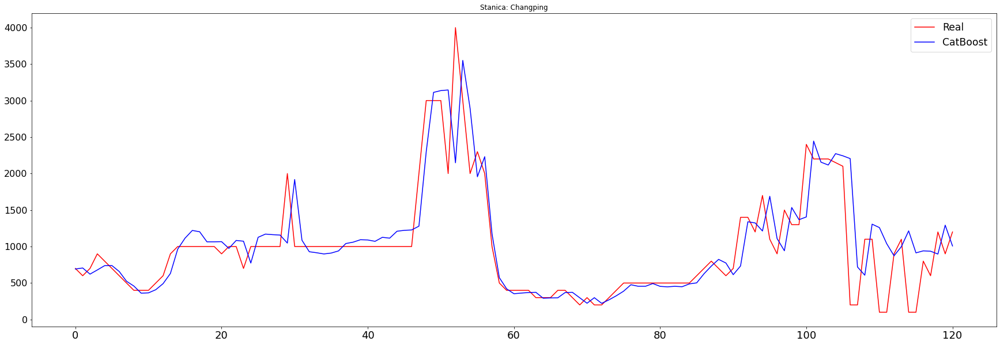

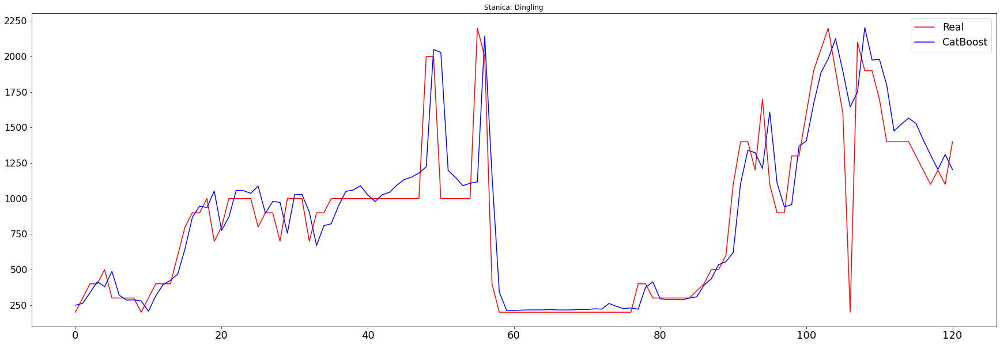

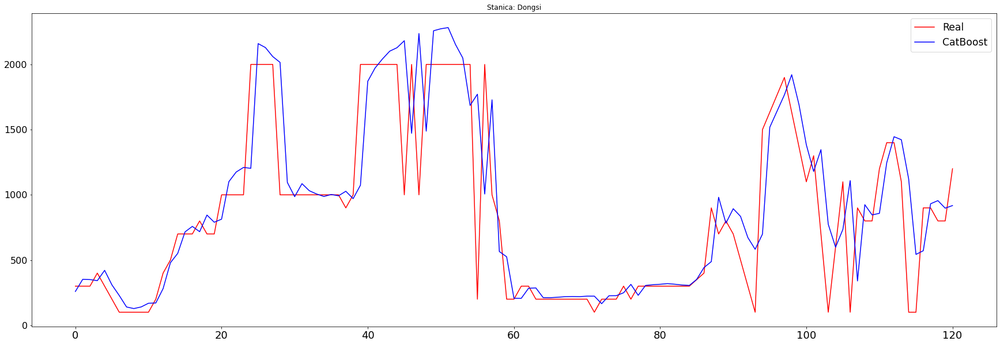

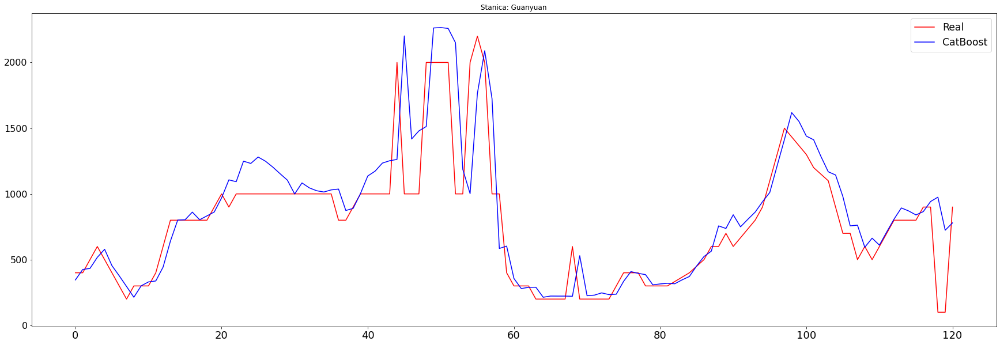

...

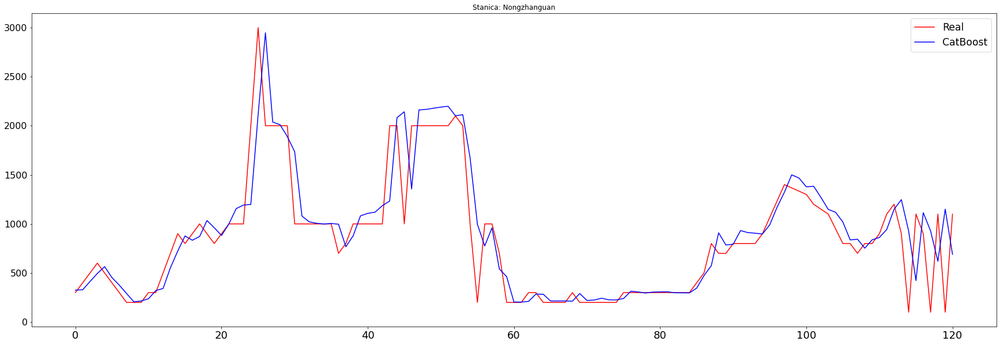

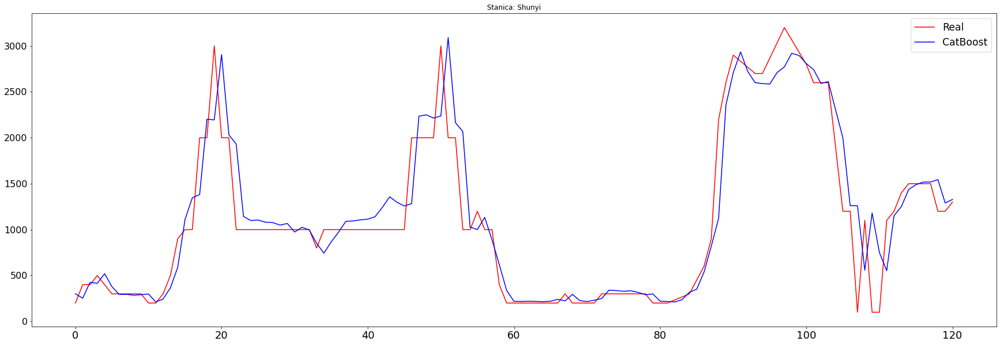

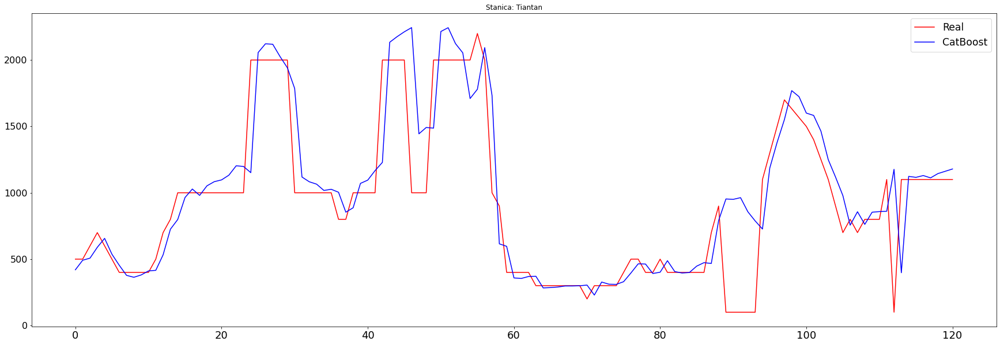

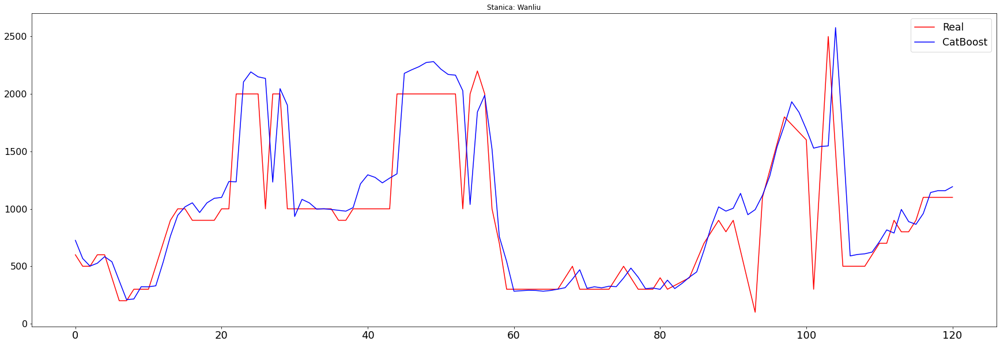

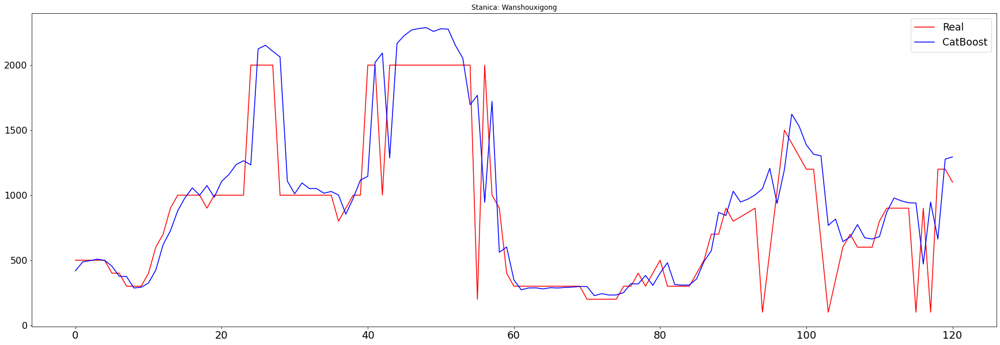

In [448]:
for i in range(0,len(reframedCO)):
  plt.figure(figsize=(30, 10))
  plt.plot(np.arange(len(X_testCO[i])), y_testCO[i], label='Real', color='r')
  plt.plot(np.arange(len(X_testCO[i])), predsCO[i], label='CatBoost', color='blue')
  plt.legend(loc='best', fontsize='xx-large')
  plt.xticks(fontsize=18)
  plt.yticks(fontsize=16)
  plt.title('Stanica: '+ stations[i].split('_')[0])
plt.show()

In [449]:
# => Predvidjanje O3 na osnovu vrednosti polutanata u prethodnom satu i prognoze meteroloskih podataka za taj sat

reframedO3=[]
for i in reframed:
    pom=i.drop(i.columns[[0,7,8,9,10,11,12,13,14,15,16,17,18,19]],axis=1).copy()
    reframedO3.append(pom)
Dingling_reframedO3 = reframedO3[2]
Huairou_reframedO3 = reframedO3[6]
Aotizhongxin_reframedO3 = reframedO3[0]
Changping_reframedO3 = reframedO3[1]
Dongsi_reframedO3 = reframedO3[3]
Guanyuan_reframedO3 = reframedO3[4]
Nongzhanguan_reframedO3 = reframedO3[7]
Shunyi_reframedO3 = reframedO3[8]
Tiantan_reframedO3 = reframedO3[9]
Wanliu_reframedO3 = reframedO3[10]
Wanshouxigong_reframedO3 = reframedO3[11]
Gucheng_reframedO3 = reframedO3[5]

In [450]:
Dingling_reframedO3.head(5) 
# var7(t-1) Koncentracija O3 u prethodnom satu
# var7(t) Koncentracija O3 za naredni sat

,var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var7(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t)
2013-03-01 01:00:00,4.0,4.0,3.0,7.0,200.0,82.0,80.0,-2.5,1021.3,-19.0,0.0,0.0,0.7,0.0
2013-03-01 02:00:00,7.0,7.0,3.0,6.0,200.0,80.0,79.0,-3.0,1021.3,-19.9,0.0,0.0,0.2,0.0
2013-03-01 03:00:00,5.0,5.0,3.0,2.0,200.0,79.0,79.0,-3.6,1021.8,-19.1,0.0,0.0,1.0,0.0
2013-03-01 04:00:00,6.0,6.0,3.0,8.0,200.0,79.0,81.0,-3.5,1022.3,-19.4,0.0,0.0,2.1,0.0
2013-03-01 05:00:00,5.0,5.0,3.0,8.0,200.0,81.0,79.0,-4.5,1022.6,-19.5,0.0,0.0,1.7,0.0


In [451]:
XO3=[]
yO3=[]

for i in reframedO3:
    pom=i.copy()
    pom=pom.drop('var7(t)',axis=1)
    XO3.append(pom.copy())
    yO3.append(i['var7(t)'])

In [452]:
n_len=34780
X_trainO3=[]
X_testO3=[]
y_trainO3=[]
y_testO3=[]

for i in XO3:
  X_trainO3.append(i.iloc[:n_len])
  X_testO3.append(i.iloc[n_len:34901])
for i in yO3:
  y_trainO3.append(i.iloc[:n_len])
  y_testO3.append(i.iloc[n_len:34901])

In [453]:
X_trainO3all=pd.concat(X_trainO3,ignore_index=True)
X_testO3all=pd.concat(X_testO3,ignore_index=True)
y_trainO3all=pd.concat(y_trainO3,ignore_index=True)
y_testO3all=pd.concat(y_testO3,ignore_index=True)

In [454]:
from catboost import Pool, CatBoostRegressor

modelO3=CatBoostRegressor(iterations=1500,
                          depth=10, 
                          learning_rate = 0.01, 
                          loss_function='RMSE',
                          eval_metric = 'RMSE',
                          random_seed = 55,
                          od_type = "Iter",
                          metric_period = 1,
                          od_wait = 20
                          )

In [455]:
modelO3.fit(X_trainO3all,y_trainO3all)

0:	learn: 56.2502888	total: 59.7ms	remaining: 1m 29s
1:	learn: 55.7464997	total: 122ms	remaining: 1m 31s
2:	learn: 55.2473812	total: 183ms	remaining: 1m 31s
3:	learn: 54.7551716	total: 241ms	remaining: 1m 30s
4:	learn: 54.2670661	total: 301ms	remaining: 1m 30s
5:	learn: 53.7863949	total: 361ms	remaining: 1m 29s
6:	learn: 53.3120149	total: 424ms	remaining: 1m 30s
7:	learn: 52.8400932	total: 490ms	remaining: 1m 31s
8:	learn: 52.3719820	total: 552ms	remaining: 1m 31s
9:	learn: 51.9109154	total: 612ms	remaining: 1m 31s
10:	learn: 51.4554205	total: 672ms	remaining: 1m 31s
11:	learn: 51.0030881	total: 731ms	remaining: 1m 30s
12:	learn: 50.5579683	total: 818ms	remaining: 1m 33s
13:	learn: 50.1151576	total: 912ms	remaining: 1m 36s
14:	learn: 49.6796537	total: 987ms	remaining: 1m 37s
15:	learn: 49.2518163	total: 1.06s	remaining: 1m 38s
16:	learn: 48.8240862	total: 1.12s	remaining: 1m 38s
17:	learn: 48.3999278	total: 1.18s	remaining: 1m 37s
18:	learn: 47.9817644	total: 1.25s	remaining: 1m 37s
19

155:	learn: 19.5604451	total: 10.3s	remaining: 1m 28s
156:	learn: 19.4847498	total: 10.4s	remaining: 1m 28s
157:	learn: 19.4099569	total: 10.4s	remaining: 1m 28s
158:	learn: 19.3351697	total: 10.5s	remaining: 1m 28s
159:	learn: 19.2623122	total: 10.6s	remaining: 1m 28s
160:	learn: 19.1912415	total: 10.7s	remaining: 1m 28s
161:	learn: 19.1216064	total: 10.7s	remaining: 1m 28s
162:	learn: 19.0530766	total: 10.8s	remaining: 1m 28s
163:	learn: 18.9849695	total: 10.9s	remaining: 1m 28s
164:	learn: 18.9189021	total: 10.9s	remaining: 1m 28s
165:	learn: 18.8534968	total: 11s	remaining: 1m 28s
166:	learn: 18.7872804	total: 11s	remaining: 1m 28s
167:	learn: 18.7235126	total: 11.1s	remaining: 1m 28s
168:	learn: 18.6595926	total: 11.2s	remaining: 1m 27s
169:	learn: 18.5982680	total: 11.2s	remaining: 1m 27s
170:	learn: 18.5376042	total: 11.3s	remaining: 1m 27s
171:	learn: 18.4782563	total: 11.4s	remaining: 1m 27s
172:	learn: 18.4180020	total: 11.4s	remaining: 1m 27s
173:	learn: 18.3581438	total: 11

310:	learn: 14.8598108	total: 20.7s	remaining: 1m 19s
311:	learn: 14.8509213	total: 20.8s	remaining: 1m 19s
312:	learn: 14.8415375	total: 20.9s	remaining: 1m 19s
313:	learn: 14.8334245	total: 21s	remaining: 1m 19s
314:	learn: 14.8251958	total: 21s	remaining: 1m 19s
315:	learn: 14.8165187	total: 21.1s	remaining: 1m 19s
316:	learn: 14.8080072	total: 21.2s	remaining: 1m 19s
317:	learn: 14.8007708	total: 21.2s	remaining: 1m 18s
318:	learn: 14.7917455	total: 21.3s	remaining: 1m 18s
319:	learn: 14.7838398	total: 21.4s	remaining: 1m 18s
320:	learn: 14.7745914	total: 21.4s	remaining: 1m 18s
321:	learn: 14.7659709	total: 21.5s	remaining: 1m 18s
322:	learn: 14.7581588	total: 21.6s	remaining: 1m 18s
323:	learn: 14.7506367	total: 21.7s	remaining: 1m 18s
324:	learn: 14.7433525	total: 21.8s	remaining: 1m 18s
325:	learn: 14.7359900	total: 21.9s	remaining: 1m 18s
326:	learn: 14.7291161	total: 21.9s	remaining: 1m 18s
327:	learn: 14.7212533	total: 22s	remaining: 1m 18s
328:	learn: 14.7140672	total: 22.1

464:	learn: 14.1366435	total: 31.2s	remaining: 1m 9s
465:	learn: 14.1339835	total: 31.2s	remaining: 1m 9s
466:	learn: 14.1315080	total: 31.3s	remaining: 1m 9s
467:	learn: 14.1286571	total: 31.4s	remaining: 1m 9s
468:	learn: 14.1259726	total: 31.4s	remaining: 1m 9s
469:	learn: 14.1239615	total: 31.5s	remaining: 1m 9s
470:	learn: 14.1214353	total: 31.6s	remaining: 1m 8s
471:	learn: 14.1186100	total: 31.6s	remaining: 1m 8s
472:	learn: 14.1160431	total: 31.7s	remaining: 1m 8s
473:	learn: 14.1132585	total: 31.8s	remaining: 1m 8s
474:	learn: 14.1106576	total: 31.8s	remaining: 1m 8s
475:	learn: 14.1078599	total: 31.9s	remaining: 1m 8s
476:	learn: 14.1053096	total: 32s	remaining: 1m 8s
477:	learn: 14.1029171	total: 32s	remaining: 1m 8s
478:	learn: 14.1006905	total: 32.1s	remaining: 1m 8s
479:	learn: 14.0983866	total: 32.2s	remaining: 1m 8s
480:	learn: 14.0961725	total: 32.2s	remaining: 1m 8s
481:	learn: 14.0936845	total: 32.3s	remaining: 1m 8s
482:	learn: 14.0918636	total: 32.4s	remaining: 1m 

621:	learn: 13.8538200	total: 41.8s	remaining: 59s
622:	learn: 13.8526183	total: 41.9s	remaining: 59s
623:	learn: 13.8510581	total: 42s	remaining: 58.9s
624:	learn: 13.8498193	total: 42s	remaining: 58.8s
625:	learn: 13.8485615	total: 42.1s	remaining: 58.8s
626:	learn: 13.8472294	total: 42.2s	remaining: 58.7s
627:	learn: 13.8456032	total: 42.2s	remaining: 58.6s
628:	learn: 13.8440814	total: 42.3s	remaining: 58.6s
629:	learn: 13.8427791	total: 42.4s	remaining: 58.5s
630:	learn: 13.8417106	total: 42.4s	remaining: 58.4s
631:	learn: 13.8403107	total: 42.5s	remaining: 58.4s
632:	learn: 13.8386936	total: 42.6s	remaining: 58.3s
633:	learn: 13.8373240	total: 42.6s	remaining: 58.2s
634:	learn: 13.8361208	total: 42.7s	remaining: 58.2s
635:	learn: 13.8351546	total: 42.8s	remaining: 58.1s
636:	learn: 13.8336242	total: 42.8s	remaining: 58s
637:	learn: 13.8322508	total: 42.9s	remaining: 58s
638:	learn: 13.8310007	total: 43s	remaining: 57.9s
639:	learn: 13.8291003	total: 43.1s	remaining: 57.9s
640:	le

779:	learn: 13.6724118	total: 52.5s	remaining: 48.4s
780:	learn: 13.6709254	total: 52.5s	remaining: 48.4s
781:	learn: 13.6699867	total: 52.6s	remaining: 48.3s
782:	learn: 13.6693524	total: 52.7s	remaining: 48.2s
783:	learn: 13.6680657	total: 52.7s	remaining: 48.2s
784:	learn: 13.6667917	total: 52.8s	remaining: 48.1s
785:	learn: 13.6651946	total: 52.9s	remaining: 48s
786:	learn: 13.6642605	total: 53s	remaining: 48s
787:	learn: 13.6629764	total: 53s	remaining: 47.9s
788:	learn: 13.6619661	total: 53.1s	remaining: 47.8s
789:	learn: 13.6610586	total: 53.2s	remaining: 47.8s
790:	learn: 13.6600882	total: 53.2s	remaining: 47.7s
791:	learn: 13.6592658	total: 53.3s	remaining: 47.7s
792:	learn: 13.6583830	total: 53.4s	remaining: 47.6s
793:	learn: 13.6572914	total: 53.5s	remaining: 47.5s
794:	learn: 13.6558632	total: 53.5s	remaining: 47.5s
795:	learn: 13.6548204	total: 53.6s	remaining: 47.4s
796:	learn: 13.6535898	total: 53.7s	remaining: 47.4s
797:	learn: 13.6525173	total: 53.8s	remaining: 47.3s
7

938:	learn: 13.5267369	total: 1m 3s	remaining: 37.6s
939:	learn: 13.5261801	total: 1m 3s	remaining: 37.6s
940:	learn: 13.5254639	total: 1m 3s	remaining: 37.5s
941:	learn: 13.5247064	total: 1m 3s	remaining: 37.5s
942:	learn: 13.5238676	total: 1m 3s	remaining: 37.4s
943:	learn: 13.5226645	total: 1m 3s	remaining: 37.3s
944:	learn: 13.5215815	total: 1m 3s	remaining: 37.3s
945:	learn: 13.5206738	total: 1m 3s	remaining: 37.2s
946:	learn: 13.5200548	total: 1m 3s	remaining: 37.2s
947:	learn: 13.5194372	total: 1m 3s	remaining: 37.1s
948:	learn: 13.5188006	total: 1m 3s	remaining: 37s
949:	learn: 13.5177501	total: 1m 3s	remaining: 36.9s
950:	learn: 13.5164808	total: 1m 3s	remaining: 36.9s
951:	learn: 13.5156625	total: 1m 3s	remaining: 36.8s
952:	learn: 13.5147864	total: 1m 4s	remaining: 36.7s
953:	learn: 13.5141093	total: 1m 4s	remaining: 36.7s
954:	learn: 13.5133009	total: 1m 4s	remaining: 36.6s
955:	learn: 13.5126649	total: 1m 4s	remaining: 36.5s
956:	learn: 13.5119853	total: 1m 4s	remaining: 3

1091:	learn: 13.4108601	total: 1m 13s	remaining: 27.6s
1092:	learn: 13.4103310	total: 1m 13s	remaining: 27.5s
1093:	learn: 13.4094995	total: 1m 13s	remaining: 27.4s
1094:	learn: 13.4089487	total: 1m 13s	remaining: 27.4s
1095:	learn: 13.4083665	total: 1m 14s	remaining: 27.3s
1096:	learn: 13.4077496	total: 1m 14s	remaining: 27.2s
1097:	learn: 13.4070481	total: 1m 14s	remaining: 27.1s
1098:	learn: 13.4063312	total: 1m 14s	remaining: 27.1s
1099:	learn: 13.4056932	total: 1m 14s	remaining: 27s
1100:	learn: 13.4046396	total: 1m 14s	remaining: 26.9s
1101:	learn: 13.4041264	total: 1m 14s	remaining: 26.9s
1102:	learn: 13.4035529	total: 1m 14s	remaining: 26.8s
1103:	learn: 13.4027932	total: 1m 14s	remaining: 26.7s
1104:	learn: 13.4020152	total: 1m 14s	remaining: 26.7s
1105:	learn: 13.4008849	total: 1m 14s	remaining: 26.6s
1106:	learn: 13.4002464	total: 1m 14s	remaining: 26.5s
1107:	learn: 13.3996739	total: 1m 14s	remaining: 26.5s
1108:	learn: 13.3991356	total: 1m 14s	remaining: 26.4s
1109:	learn:

1242:	learn: 13.3093289	total: 1m 23s	remaining: 17.3s
1243:	learn: 13.3087900	total: 1m 23s	remaining: 17.2s
1244:	learn: 13.3082375	total: 1m 23s	remaining: 17.2s
1245:	learn: 13.3078229	total: 1m 23s	remaining: 17.1s
1246:	learn: 13.3073547	total: 1m 23s	remaining: 17s
1247:	learn: 13.3068997	total: 1m 23s	remaining: 17s
1248:	learn: 13.3062996	total: 1m 24s	remaining: 16.9s
1249:	learn: 13.3058295	total: 1m 24s	remaining: 16.8s
1250:	learn: 13.3050543	total: 1m 24s	remaining: 16.8s
1251:	learn: 13.3045581	total: 1m 24s	remaining: 16.7s
1252:	learn: 13.3041194	total: 1m 24s	remaining: 16.6s
1253:	learn: 13.3034077	total: 1m 24s	remaining: 16.6s
1254:	learn: 13.3028362	total: 1m 24s	remaining: 16.5s
1255:	learn: 13.3021351	total: 1m 24s	remaining: 16.4s
1256:	learn: 13.3012043	total: 1m 24s	remaining: 16.4s
1257:	learn: 13.3003848	total: 1m 24s	remaining: 16.3s
1258:	learn: 13.2997327	total: 1m 24s	remaining: 16.2s
1259:	learn: 13.2991670	total: 1m 24s	remaining: 16.2s
1260:	learn: 1

1393:	learn: 13.2169893	total: 1m 33s	remaining: 7.13s
1394:	learn: 13.2163542	total: 1m 33s	remaining: 7.06s
1395:	learn: 13.2155605	total: 1m 33s	remaining: 6.99s
1396:	learn: 13.2150774	total: 1m 33s	remaining: 6.92s
1397:	learn: 13.2144480	total: 1m 33s	remaining: 6.86s
1398:	learn: 13.2137211	total: 1m 34s	remaining: 6.79s
1399:	learn: 13.2130600	total: 1m 34s	remaining: 6.72s
1400:	learn: 13.2121985	total: 1m 34s	remaining: 6.65s
1401:	learn: 13.2117112	total: 1m 34s	remaining: 6.58s
1402:	learn: 13.2110297	total: 1m 34s	remaining: 6.52s
1403:	learn: 13.2103282	total: 1m 34s	remaining: 6.45s
1404:	learn: 13.2098509	total: 1m 34s	remaining: 6.38s
1405:	learn: 13.2093046	total: 1m 34s	remaining: 6.32s
1406:	learn: 13.2086363	total: 1m 34s	remaining: 6.25s
1407:	learn: 13.2076585	total: 1m 34s	remaining: 6.18s
1408:	learn: 13.2071508	total: 1m 34s	remaining: 6.11s
1409:	learn: 13.2063127	total: 1m 34s	remaining: 6.05s
1410:	learn: 13.2056970	total: 1m 34s	remaining: 5.98s
1411:	lear

In [456]:
predsO3=[]

for i in range(0,len(reframedO3)):
  predsO3.append(modelO3.predict(X_testO3[i]))

In [457]:
for i in range(0,len(reframedO3)):
  print('Stanica: '+ stations[i].split('_')[0])
  rmse = math.sqrt(mean_squared_error(y_testO3[i], predsO3[i]))
  mae= mean_absolute_error(y_testO3[i], predsO3[i])
  accuracy = r2_score(y_testO3[i],predsO3[i])
  R2 = r2_score(y_testO3[i],predsO3[i])
  print('Test RMSE: %.3f' % rmse)
  print('Test MAE: %.3f' % mae)
  print('R2 SCORE: {}'.format(R2))

Stanica: Aotizhongxin
Test RMSE: 10.769
Test MAE: 7.093
R2 SCORE: 0.8777015384029032
Stanica: Changping
Test RMSE: 9.489
Test MAE: 6.447
R2 SCORE: 0.8500995737359058
Stanica: Dingling
Test RMSE: 7.580
Test MAE: 5.277
R2 SCORE: 0.9457621462025738
Stanica: Dongsi
Test RMSE: 9.718
Test MAE: 6.480
R2 SCORE: 0.9047204840776859
Stanica: Guanyuan
Test RMSE: 9.610
Test MAE: 6.413
R2 SCORE: 0.8724413587321037
Stanica: Gucheng
Test RMSE: 7.749
Test MAE: 5.188
R2 SCORE: 0.893012440125478
Stanica: Huairou
Test RMSE: 11.391
Test MAE: 7.439
R2 SCORE: 0.9101736415222464
Stanica: Nongzhanguan
Test RMSE: 14.628
Test MAE: 8.356
R2 SCORE: 0.7660634022523231
Stanica: Shunyi
Test RMSE: 10.844
Test MAE: 7.100
R2 SCORE: 0.9150748944780025
Stanica: Tiantan
Test RMSE: 14.527
Test MAE: 8.273
R2 SCORE: 0.8125616518723072
Stanica: Wanliu
Test RMSE: 10.522
Test MAE: 6.822
R2 SCORE: 0.8927175758144084
Stanica: Wanshouxigong
Test RMSE: 13.471
Test MAE: 7.583
R2 SCORE: 0.7977873495615524


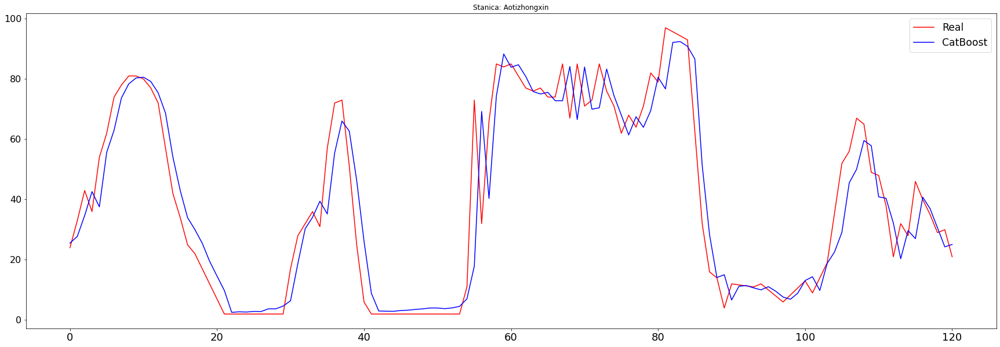

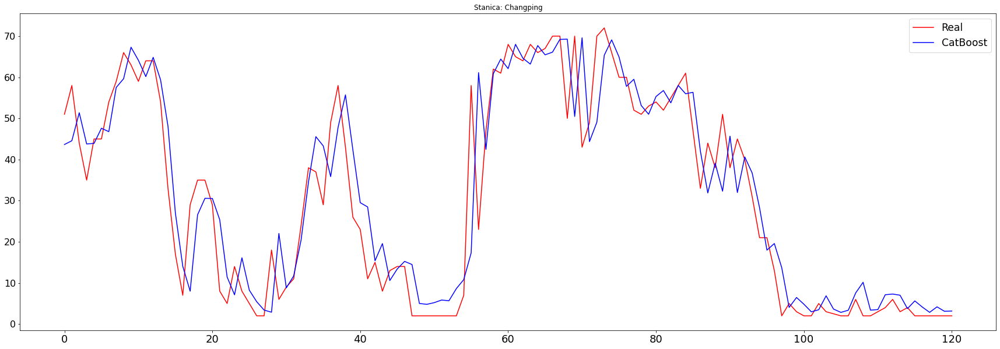

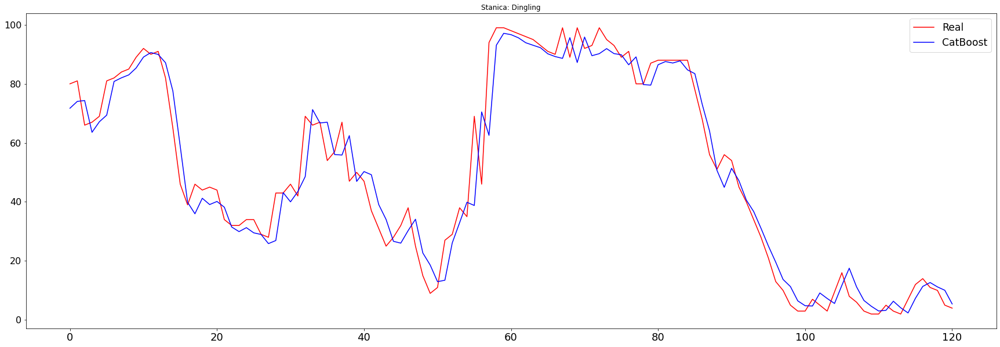

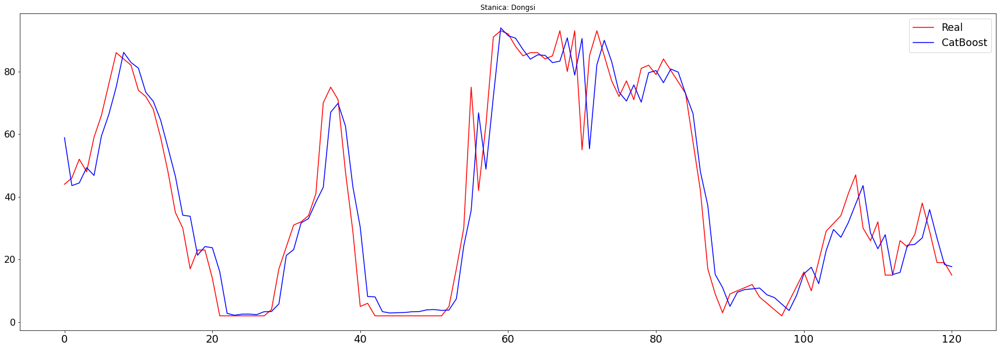

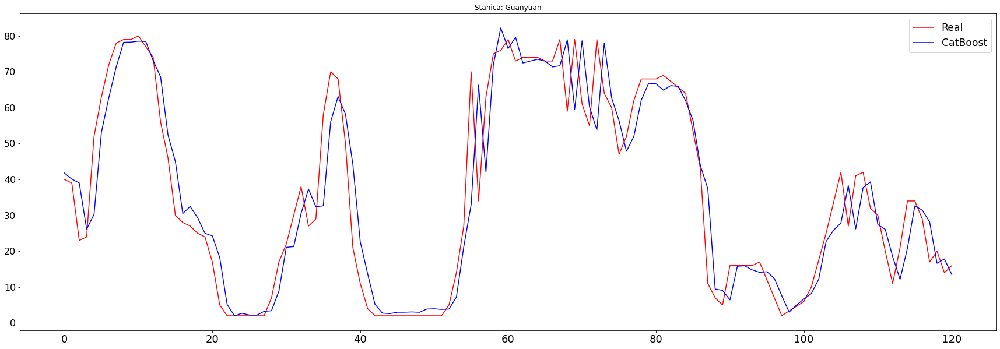

...

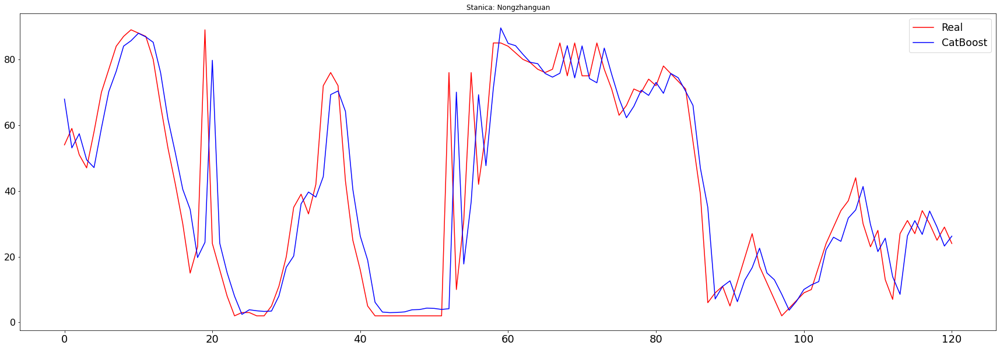

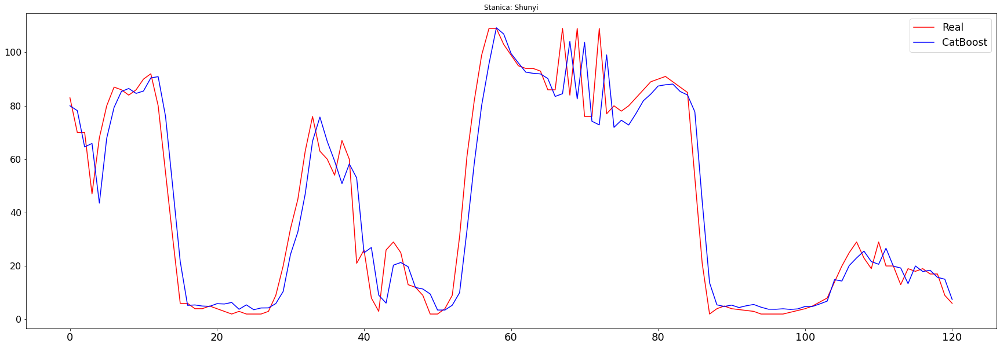

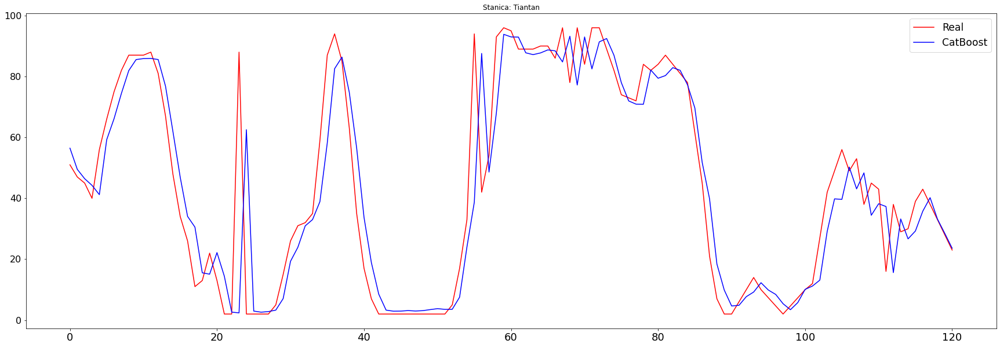

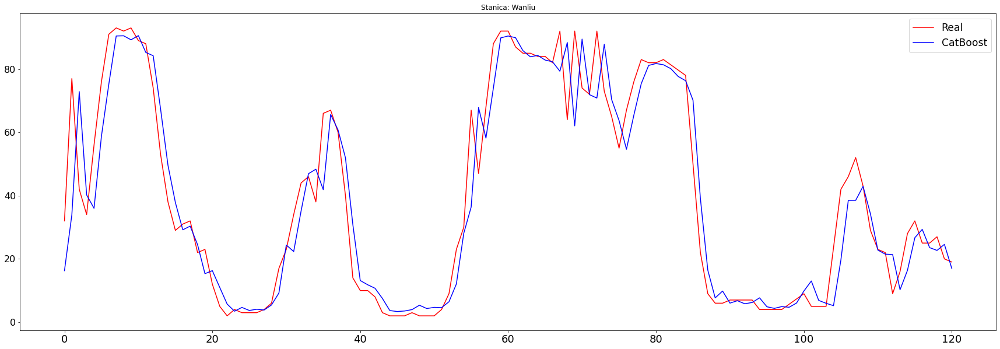

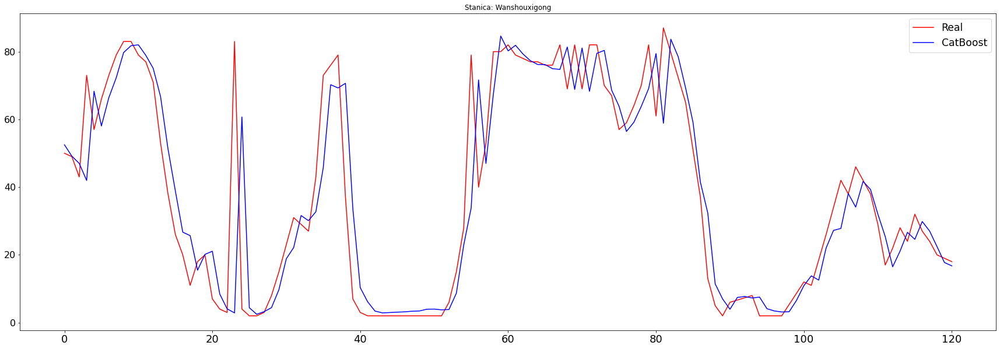

In [458]:
for i in range(0,len(reframedO3)):
  plt.figure(figsize=(30, 10))
  plt.plot(np.arange(len(X_testO3[i])), y_testO3[i], label='Real', color='r')
  plt.plot(np.arange(len(X_testO3[i])), predsO3[i], label='CatBoost', color='blue')
  plt.legend(loc='best', fontsize='xx-large')
  plt.xticks(fontsize=18)
  plt.yticks(fontsize=16)
  plt.title('Stanica: '+ stations[i].split('_')[0])
plt.show()

In [459]:
# S obzirom da je moguce imati vremensku prognozu za 5 dana unapred, ideja je da pokusamo da predvidimo koncentracije
# PM2.5 pet narednih dana po satima, tako sto cemo za svaki naredni sat koristiti predvidjenu vrednost za prethodni sat!

In [460]:
for i in range(0,len(reframed)):
    X_testCO[i]=pd.DataFrame(X_testCO[i])
    X_testPM25[i]=pd.DataFrame(X_testPM25[i])
    X_testPM10[i]=pd.DataFrame(X_testPM10[i])
    X_testO3[i]=pd.DataFrame(X_testO3[i])
    X_testNO2[i]=pd.DataFrame(X_testNO2[i])
    X_testSO2[i]=pd.DataFrame(X_testSO2[i])

In [461]:
predsonpredsPM25=[]
predsonpredsSO2=[]
predsonpredsPM10=[]
predsonpredsCO=[]
predsonpredsNO2=[]
predsonpredsO3=[]
for k in range(0,len(reframed)): 
  print('{}-ta stanica se obradjuje'.format(k))
  predvidjenonapredvidjenoPM25=[]
  predvidjenonapredvidjenoSO2=[]
  predvidjenonapredvidjenoPM10=[]
  predvidjenonapredvidjenoNO2=[]
  predvidjenonapredvidjenoCO=[]
  predvidjenonapredvidjenoO3=[]
  dan=np.array(X_testCO[k].iloc[0])
  dan=dan.reshape(1,13)
  danpredvidjenPM25=modelPM25.predict(dan)
  danpredvidjenSO2=modelSO2.predict(dan)
  danpredvidjenPM10=modelPM10.predict(dan)
  danpredvidjenNO2=modelNO2.predict(dan)
  danpredvidjenCO=modelCO.predict(dan)
  danpredvidjenO3=modelO3.predict(dan)
  predvidjenonapredvidjenoPM25.append(danpredvidjenPM25)
  predvidjenonapredvidjenoSO2.append(danpredvidjenSO2)
  predvidjenonapredvidjenoPM10.append(danpredvidjenPM10)
  predvidjenonapredvidjenoNO2.append(danpredvidjenNO2)
  predvidjenonapredvidjenoCO.append(danpredvidjenCO)
  predvidjenonapredvidjenoO3.append(danpredvidjenO3)
  for i in range(1, len(X_testCO[k])):
    day=np.array(X_testCO[k].iloc[i])
    day[0]=predvidjenonapredvidjenoPM25[i-1]
    day[1]=predvidjenonapredvidjenoPM10[i-1]
    day[2]=predvidjenonapredvidjenoSO2[i-1]
    day[3]=predvidjenonapredvidjenoNO2[i-1]
    day[4]=predvidjenonapredvidjenoCO[i-1]
    day[5]=predvidjenonapredvidjenoO3[i-1]
    day=day.reshape(1,13)
    daypredictPM25=modelPM25.predict(day)
    daypredictSO2=modelSO2.predict(day)
    daypredictPM10=modelPM10.predict(day)
    daypredictNO2=modelNO2.predict(day)
    daypredictCO=modelCO.predict(day)
    daypredictO3=modelO3.predict(day)
    predvidjenonapredvidjenoPM25.append(daypredictPM25)
    predvidjenonapredvidjenoSO2.append(daypredictSO2)
    predvidjenonapredvidjenoPM10.append(daypredictPM10)
    predvidjenonapredvidjenoNO2.append(daypredictNO2)
    predvidjenonapredvidjenoCO.append(daypredictCO)
    predvidjenonapredvidjenoO3.append(daypredictO3)
  predsonpredsPM25.append(predvidjenonapredvidjenoPM25)
  predsonpredsSO2.append(predvidjenonapredvidjenoSO2)
  predsonpredsPM10.append(predvidjenonapredvidjenoPM10)
  predsonpredsCO.append(predvidjenonapredvidjenoCO)
  predsonpredsNO2.append(predvidjenonapredvidjenoNO2)
  predsonpredsO3.append(predvidjenonapredvidjenoO3)

0-ta stanica se obradjuje
1-ta stanica se obradjuje
2-ta stanica se obradjuje
3-ta stanica se obradjuje
4-ta stanica se obradjuje
5-ta stanica se obradjuje
6-ta stanica se obradjuje
7-ta stanica se obradjuje
8-ta stanica se obradjuje
9-ta stanica se obradjuje
10-ta stanica se obradjuje
11-ta stanica se obradjuje


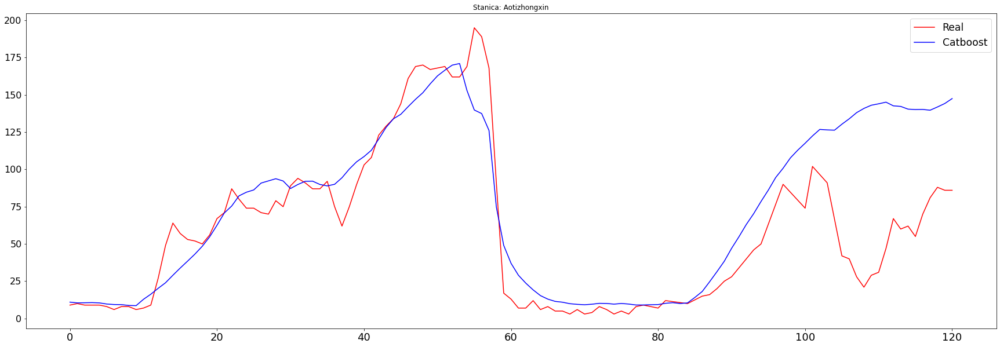

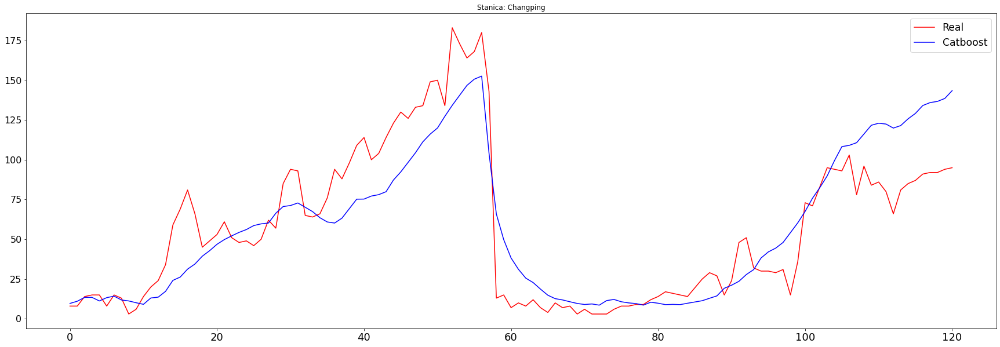

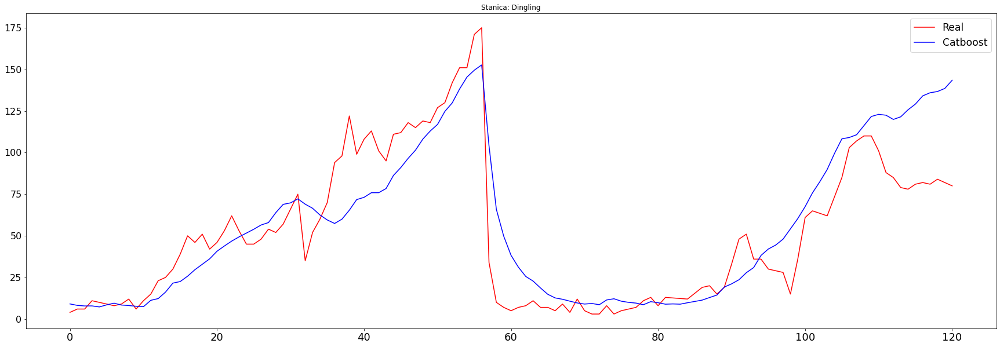

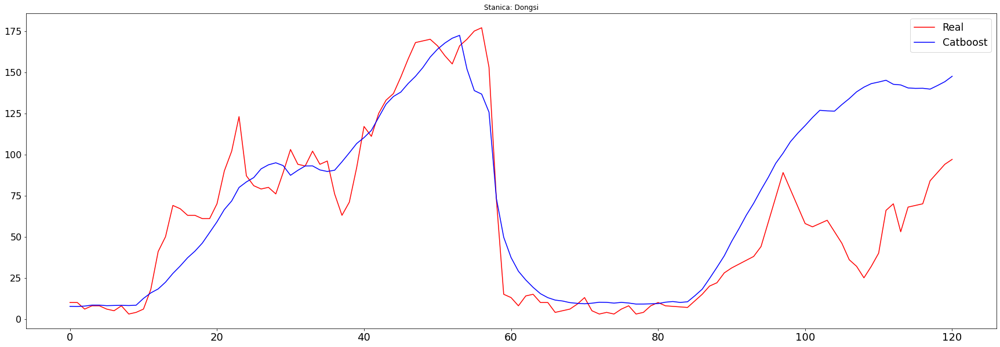

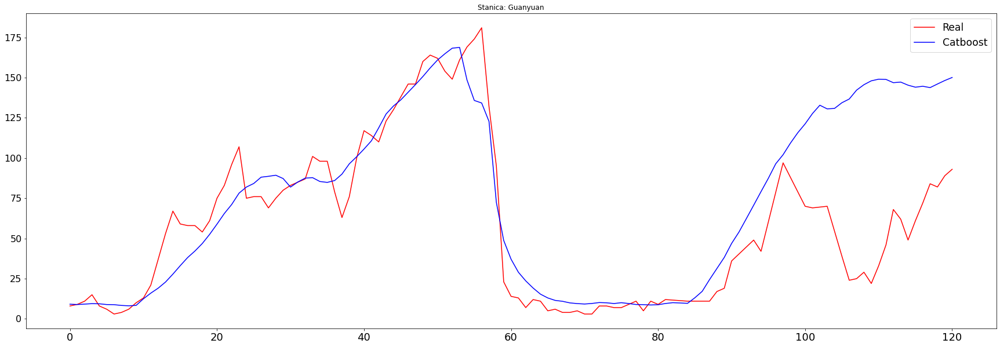

...

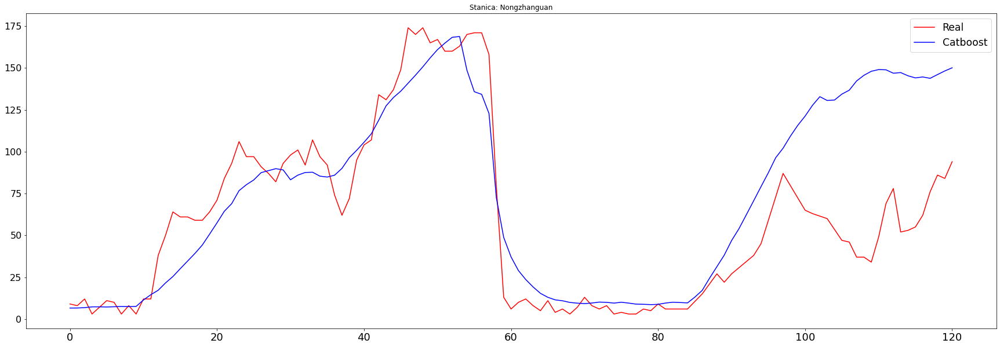

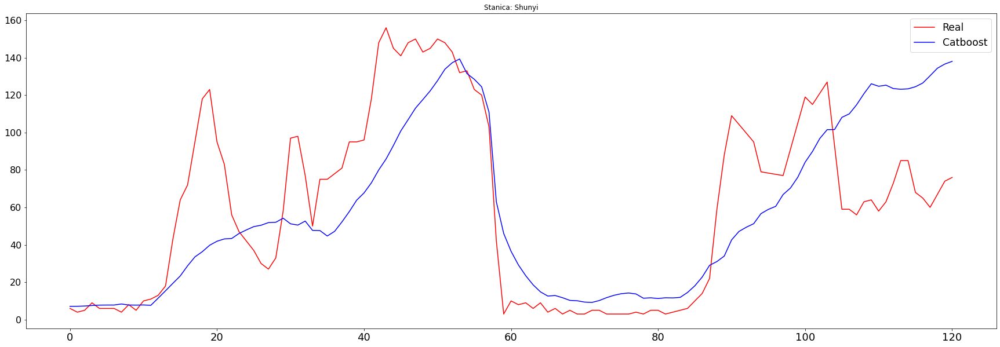

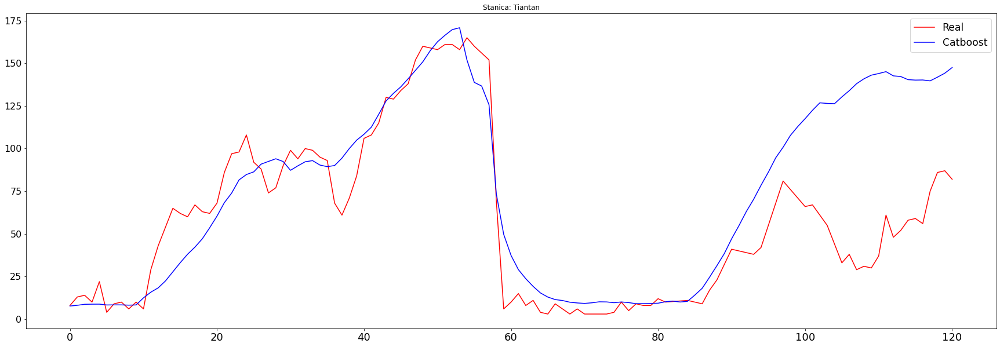

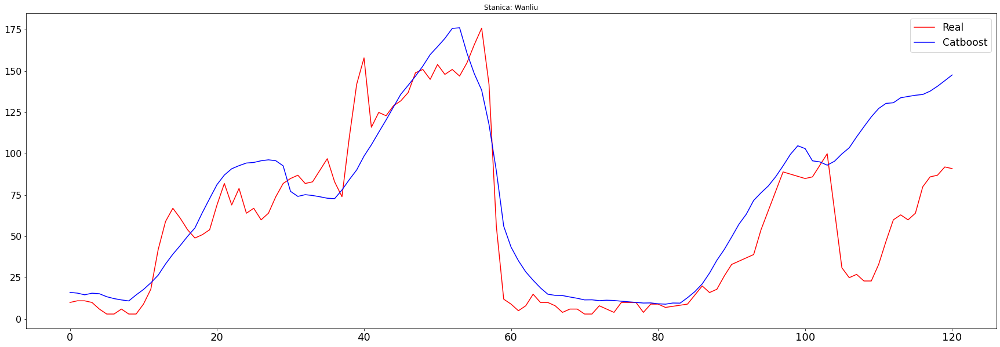

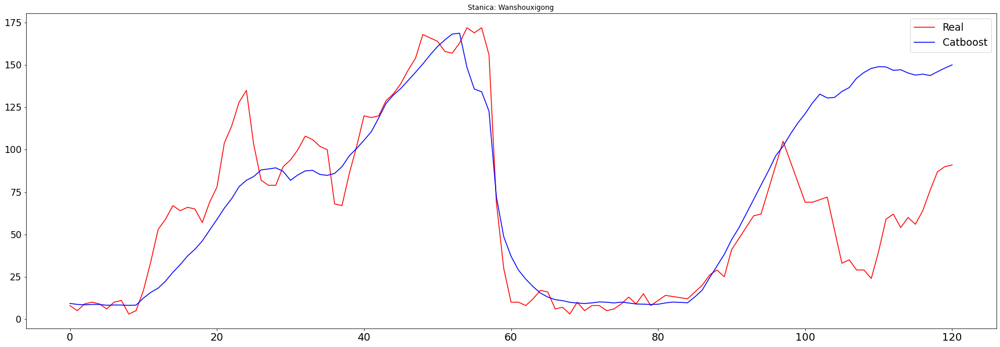

In [462]:
# Grafici za PM2.5
# Nezdrava vrednost za PM2.5 je iznad 35

for i in range(0,len(reframedPM25)):
  plt.figure(figsize=(30, 10))
  plt.plot(np.arange(len(X_testPM25[i])), y_testPM25[i], label='Real', color='r')
  plt.plot(np.arange(len(X_testPM25[i])), predsonpredsPM25[i], label='Catboost', color='blue')
  plt.legend(loc='best', fontsize='xx-large')
  plt.xticks(fontsize=18)
  plt.yticks(fontsize=16)
  plt.title('Stanica: '+ stations[i].split('_')[0])
plt.show()

In [474]:
# Na osnovu grafika mozemo primetiti da nasa kriva delimicno prati trend zagadjenja vazduha.

# Kako je nama najbitnije da vidimo koliko puta je nas model bio u pravu kad je rekao da je vazduh zagadjen
# (tj. koliko puta je nas model bio upravu kad je rekao da treba da se podigne alarm)
# Ideja za evaluaciju modela bi bila neka verzija matrice konfuzije koja bi odgovarala ovom problemu!
# Odnosno posmatracemo broj laznih alarma, broj tacnih alarma, broj trenutaka kada je alarm treba da se podigne a nije,
# broj trenutaka kada se nije podigao alarm i nije ni trebao kao i procenat laznih alarma i procenat tacnosti 

# Literatura u kojoj je prethodna ideja pronadjena -> https://openreview.net/pdf?id=SkymMAxAb strana 4

provera=[]
for i in range(0,len(reframedPM25)):
  provera.append(pd.DataFrame(y_testPM25[i]))
  forecast=np.array(predsonpredsPM25[i]).reshape(-1)
  provera[i]['predvidjeno']=forecast

pogodak=[0,0,0,0,0,0,0,0,0,0,0,0]
greska=[0,0,0,0,0,0,0,0,0,0,0,0]
lazanalarm=[0,0,0,0,0,0,0,0,0,0,0,0]
nije_zagadjeno=[0,0,0,0,0,0,0,0,0,0,0,0]
print('Predvidjanja za 5 dana PM2.5')
for j in range(0,len(reframedPM25)):
  print('\n')
  print('Stanica: '+ stations[j].split('_')[0])
  for i in range(0,120):
    if provera[j]['var2(t)'].iloc[i]>35 and provera[j]['predvidjeno'].iloc[i]>35:
      pogodak[j]=pogodak[j]+1
    elif provera[j]['var2(t)'].iloc[i]>35 and provera[j]['predvidjeno'].iloc[i]<35:
      greska[j]=greska[j]+1
    elif provera[j]['var2(t)'].iloc[i]<35 and provera[j]['predvidjeno'].iloc[i]>35:
      lazanalarm[j]=lazanalarm[j]+1
    else:
      nije_zagadjeno[j]=nije_zagadjeno[j]+1  
  print('Broj laznih alarma je: %d '  %lazanalarm[j])
  print('Broj tacnih alarma je: %d' %pogodak[j])
  print('Broj trenutaka kada je trebao da se podigne alarm a nije je: %d'  %greska[j])
  print('Broj trenutaka kada se nije podigao alarm i nije trebao je: %d' %nije_zagadjeno[j])
  print('Procenat laznih alarma je: %.3f' %((lazanalarm[j])/(lazanalarm[j]+pogodak[j])))
  print('Procenat tacnosti je: %.3f' %((nije_zagadjeno[j]+pogodak[j])/(lazanalarm[j]+pogodak[j]+greska[j]+nije_zagadjeno[j])))


Predvidjanja za 5 dana PM2.5


Stanica: Aotizhongxin
Broj laznih alarma je: 9 
Broj tacnih alarma je: 67
Broj trenutaka kada je trebao da se podigne alarm a nije je: 3
Broj trenutaka kada se nije podigao alarm i nije trebao je: 41
Procenat laznih alarma je: 0.118
Procenat tacnosti je: 0.900


Stanica: Changping
Broj laznih alarma je: 8 
Broj tacnih alarma je: 61
Broj trenutaka kada je trebao da se podigne alarm a nije je: 6
Broj trenutaka kada se nije podigao alarm i nije trebao je: 45
Procenat laznih alarma je: 0.116
Procenat tacnosti je: 0.883


Stanica: Dingling
Broj laznih alarma je: 8 
Broj tacnih alarma je: 59
Broj trenutaka kada je trebao da se podigne alarm a nije je: 7
Broj trenutaka kada se nije podigao alarm i nije trebao je: 46
Procenat laznih alarma je: 0.119
Procenat tacnosti je: 0.875


Stanica: Dongsi
Broj laznih alarma je: 8 
Broj tacnih alarma je: 68
Broj trenutaka kada je trebao da se podigne alarm a nije je: 4
Broj trenutaka kada se nije podigao alarm i nije trebao 

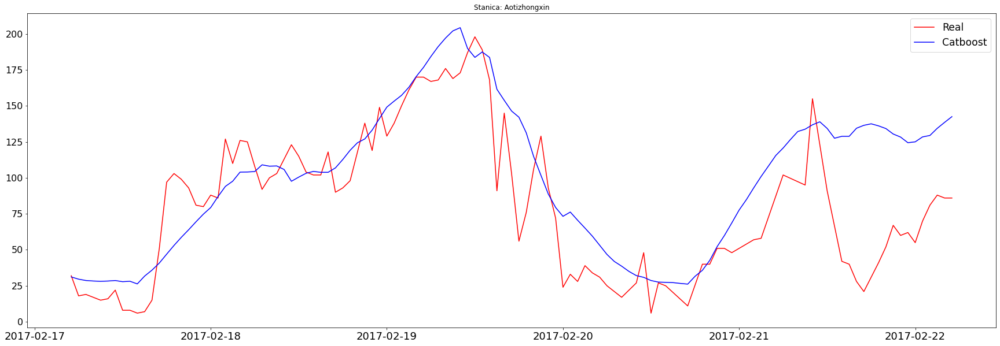

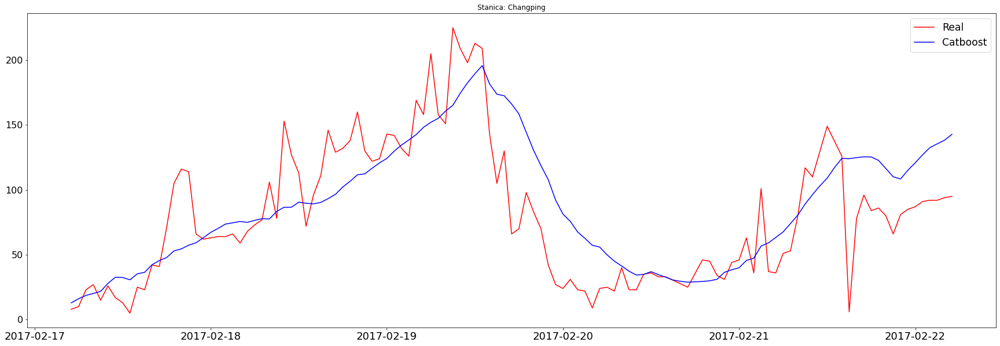

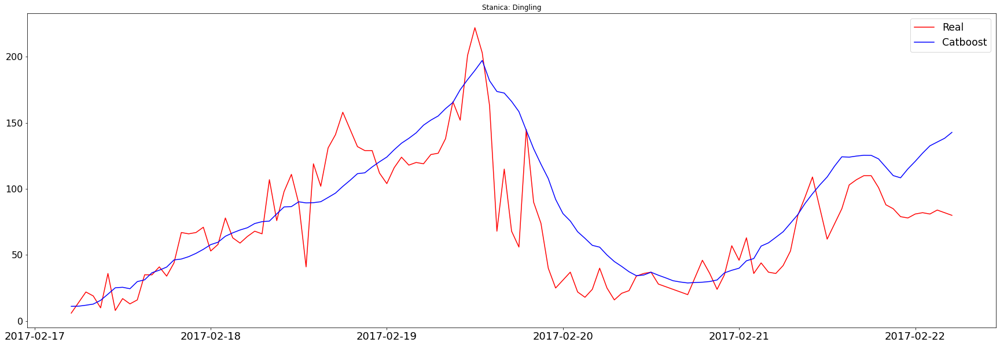

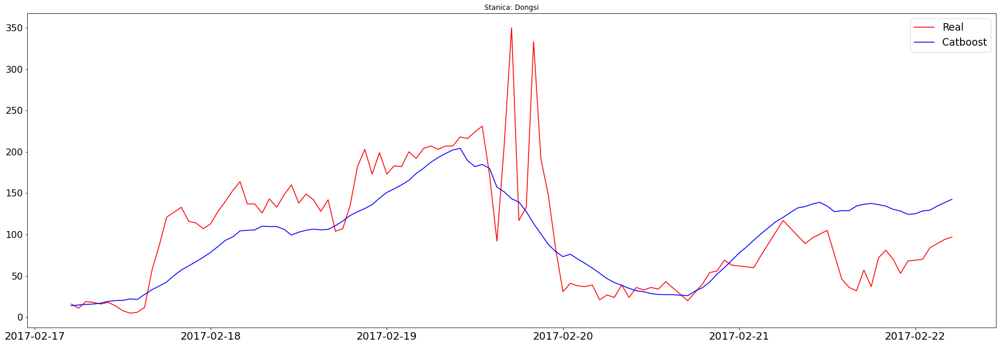

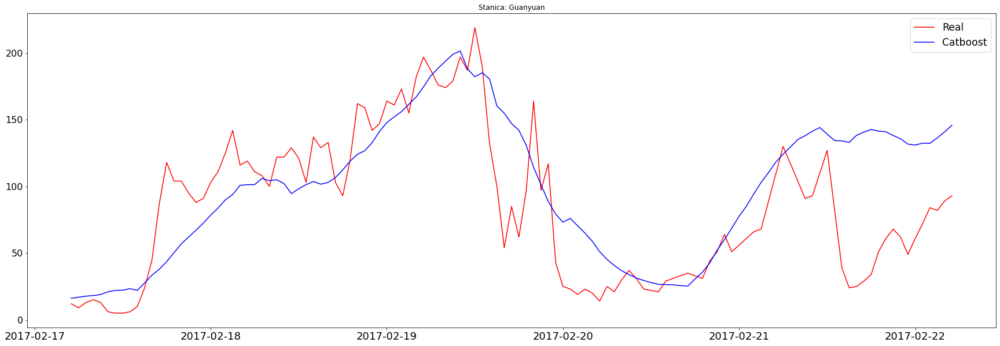

...

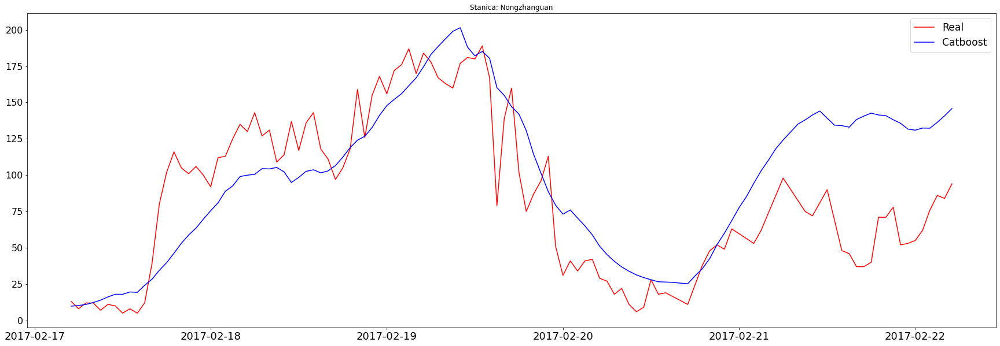

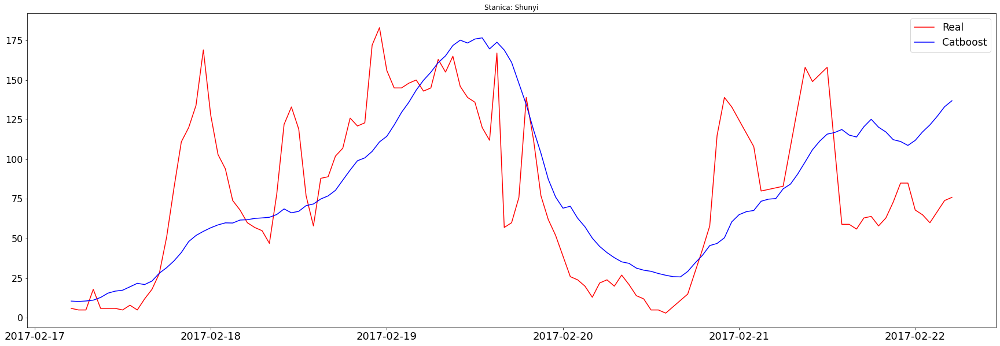

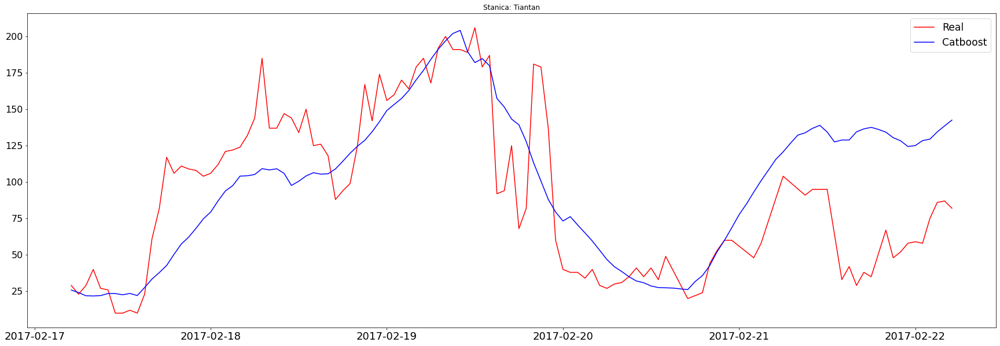

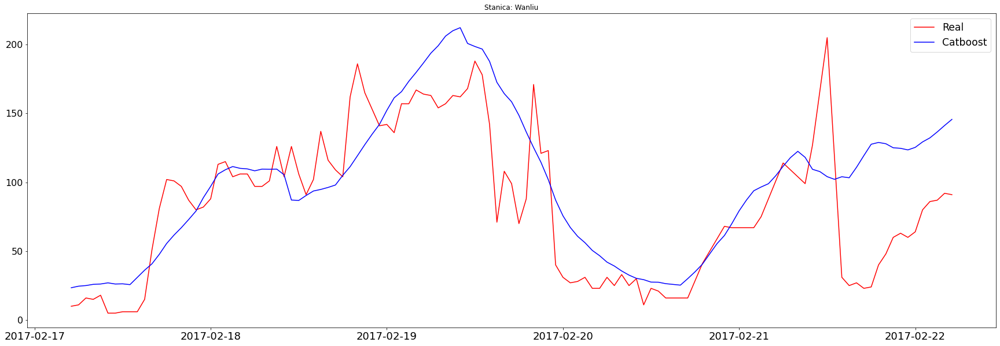

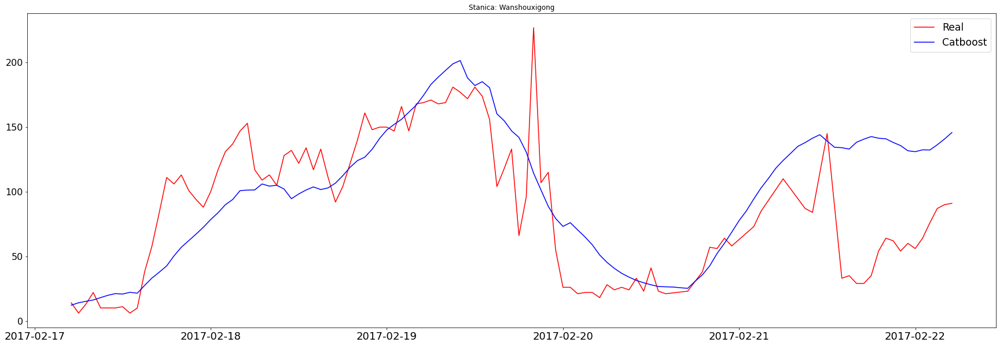

In [475]:
# Grafici za PM10
# Nezdrava vrednost za PM10 je iznad 160

for i in range(0,len(reframedPM10)):
  plt.figure(figsize=(30, 10))
  plt.plot(X_testPM10[i].index, y_testPM10[i], label='Real', color='r')
  plt.plot(X_testPM10[i].index, predsonpredsPM10[i], label='Catboost', color='blue')
  plt.legend(loc='best', fontsize='xx-large')
  plt.xticks(fontsize=18)
  plt.yticks(fontsize=16)
  plt.title('Stanica: '+ stations[i].split('_')[0])
plt.show()

In [476]:
provera=[]
for i in range(0,len(reframedPM10)):
  provera.append(pd.DataFrame(y_testPM10[i]))
  forecast=np.array(predsonpredsPM10[i]).reshape(-1)
  provera[i]['predvidjeno']=forecast

pogodak=[0,0,0,0,0,0,0,0,0,0,0,0]
greska=[0,0,0,0,0,0,0,0,0,0,0,0]
lazanalarm=[0,0,0,0,0,0,0,0,0,0,0,0]
nije_zagadjeno=[0,0,0,0,0,0,0,0,0,0,0,0]
print('Predvidjanja za 5 dana PM 10')
for j in range(0,len(reframedPM10)):
  print('\n')
  print('Stanica: '+ stations[j].split('_')[0])
  for i in range(0,120):
    if provera[j]['var3(t)'].iloc[i]>160 and provera[j]['predvidjeno'].iloc[i]>160:
      pogodak[j]=pogodak[j]+1
    elif provera[j]['var3(t)'].iloc[i]>160 and provera[j]['predvidjeno'].iloc[i]<160:
      greska[j]=greska[j]+1
    elif provera[j]['var3(t)'].iloc[i]<160 and provera[j]['predvidjeno'].iloc[i]>160:
      lazanalarm[j]=lazanalarm[j]+1
    else:
      nije_zagadjeno[j]=nije_zagadjeno[j]+1  
  print('Broj laznih alarma je: %d '  %lazanalarm[j])
  print('Broj tacnih alarma je: %d' %pogodak[j])
  print('Broj trenutaka kada je trebao da se podigne alarm a nije je: %d'  %greska[j])
  print('Broj trenutaka kada se nije podigao alarm i nije trebao je: %d' %nije_zagadjeno[j])
  print('Procenat laznih alarma je: %.3f' %((lazanalarm[j])/(lazanalarm[j]+pogodak[j])))
  print('Procenat tacnosti je: %.3f' %((nije_zagadjeno[j]+pogodak[j])/(lazanalarm[j]+pogodak[j]+greska[j]+nije_zagadjeno[j])))


Predvidjanja za 5 dana PM 10


Stanica: Aotizhongxin
Broj laznih alarma je: 1 
Broj tacnih alarma je: 12
Broj trenutaka kada je trebao da se podigne alarm a nije je: 0
Broj trenutaka kada se nije podigao alarm i nije trebao je: 107
Procenat laznih alarma je: 0.077
Procenat tacnosti je: 0.992


Stanica: Changping
Broj laznih alarma je: 5 
Broj tacnih alarma je: 5
Broj trenutaka kada je trebao da se podigne alarm a nije je: 2
Broj trenutaka kada se nije podigao alarm i nije trebao je: 108
Procenat laznih alarma je: 0.500
Procenat tacnosti je: 0.942


Stanica: Dingling
Broj laznih alarma je: 5 
Broj tacnih alarma je: 5
Broj trenutaka kada je trebao da se podigne alarm a nije je: 0
Broj trenutaka kada se nije podigao alarm i nije trebao je: 110
Procenat laznih alarma je: 0.500
Procenat tacnosti je: 0.958


Stanica: Dongsi
Broj laznih alarma je: 0 
Broj tacnih alarma je: 13
Broj trenutaka kada je trebao da se podigne alarm a nije je: 11
Broj trenutaka kada se nije podigao alarm i nije treba

In [466]:
# Sacuvajmo modele

In [467]:
import pickle

In [468]:
with open('models/modelPM25.model.pickle', 'wb') as model_file:
    pickle.dump(modelPM25, model_file)

In [469]:
with open('models/modelPM10.model.pickle', 'wb') as model_file:
    pickle.dump(modelPM10, model_file)

In [470]:
with open('models/modelNO2.model.pickle', 'wb') as model_file:
    pickle.dump(modelNO2, model_file)

In [471]:
with open('models/modelSO2.model.pickle', 'wb') as model_file:
    pickle.dump(modelSO2, model_file)

In [472]:
with open('models/modelCO.model.pickle', 'wb') as model_file:
    pickle.dump(modelCO, model_file)

In [473]:
with open('models/modelO3.model.pickle', 'wb') as model_file:
    pickle.dump(modelO3, model_file)

In [94]:
# Formirajmo baze za prikaz!

dataframes_to_display=[]
for i in range(0,12):
    dataframe=pd.concat([pd.DataFrame(predsonpredsPM25[i]),pd.DataFrame(predsonpredsPM10[i]),pd.DataFrame(predsonpredsSO2[i]),pd.DataFrame(predsonpredsNO2[i]),pd.DataFrame(predsonpredsO3[i]),pd.DataFrame(predsonpredsCO[i])],axis=1)
    dataframe.columns=['PM25','PM10','SO2','NO2','O3','CO']
    dataframe['station']=stations[i]
    dataframes_to_display.append(dataframe)

In [95]:
dataframes_to_display[0].head(5)

,PM25,PM10,SO2,NO2,O3,CO,station
0,10.970650,31.147082,6.123928,44.647669,25.543934,376.598776,Aotizhongxin
1,10.482001,29.602280,6.824457,41.491924,28.924111,411.342520,Aotizhongxin
2,10.556380,28.669942,7.538146,40.124825,30.372458,447.832553,Aotizhongxin
3,10.660261,28.321802,8.332234,39.906280,31.788932,461.202291,Aotizhongxin
4,10.474733,28.107045,8.555223,37.840452,34.432809,464.314397,Aotizhongxin


In [96]:
# Sacuvajmo prethodne baze
for data in dataframes_to_display:
    data.to_csv("data_demo/" +"Data_{}.csv".format(data['station'].iloc[0]))

In [97]:
# Predvidjanje koncentracije za naredni sat samo za PM25 sa ostalim modelima radi poredjenja!
# Napomena: Catboost je izabran da se prikaze i odradi za sve jer je imao najbolje performanse, sto cemo
# videti na kraju u tabeli!

In [482]:
# Za ovaj slucaj cemo skalirati podatke

scaler=preprocessing.StandardScaler()
scaler.fit(X_trainPM25all)


StandardScaler()

In [483]:
# Pripremimo podatke
X_trainPM25all=scaler.transform(X_trainPM25all)
X_testPM25all=scaler.transform(X_testPM25all)

In [484]:
# Skalirajmo i sve ostale X_test podate

for i in range(0,len(reframed)):
    X_testPM25[i]=scaler.transform(X_testPM25[i])

In [101]:
# RandomForestRegressor

In [102]:
modelPM25_1=ensemble.RandomForestRegressor(n_estimators = 1000,  random_state=0,max_depth=2)

In [103]:
modelPM25_1.fit(X_trainPM25all,y_trainPM25all)

RandomForestRegressor(max_depth=2, n_estimators=1000, random_state=0)

In [104]:
# Predvidjanje modelom:


predsPM25_1=[]

for i in range(0,len(reframed)):
  predsPM25_1.append(modelPM25_1.predict(X_testPM25[i]))

In [105]:
# Evaluacija modela:

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import math
from sklearn.metrics import r2_score

for i in range(0,len(reframedPM25)):
  print('Stanica: '+ stations[i].split('_')[0])
  rmse = math.sqrt(mean_squared_error(y_testPM25[i], predsPM25_1[i]))
  mae= mean_absolute_error(y_testPM25[i], predsPM25_1[i])
  R2 = r2_score(y_testPM25[i],predsPM25_1[i])
  print('Test RMSE: %.3f' % rmse)
  print('Test MAE: %.3f' % mae)
  print('R2 SCORE: {}'.format(R2))

Stanica: Aotizhongxin
Test RMSE: 20.310
Test MAE: 15.999
R2 SCORE: 0.8417410921321832
Stanica: Changping
Test RMSE: 23.819
Test MAE: 16.749
R2 SCORE: 0.7451473743190193
Stanica: Dingling
Test RMSE: 22.996
Test MAE: 17.772
R2 SCORE: 0.722281262280549
Stanica: Dongsi
Test RMSE: 21.792
Test MAE: 17.284
R2 SCORE: 0.8138607174048371
Stanica: Guanyuan
Test RMSE: 20.855
Test MAE: 17.129
R2 SCORE: 0.8133100171436622
Stanica: Gucheng
Test RMSE: 23.019
Test MAE: 18.632
R2 SCORE: 0.8106561324259461
Stanica: Huairou
Test RMSE: 21.303
Test MAE: 16.973
R2 SCORE: 0.7595738741944085
Stanica: Nongzhanguan
Test RMSE: 21.275
Test MAE: 16.980
R2 SCORE: 0.8245670537322701
Stanica: Shunyi
Test RMSE: 23.140
Test MAE: 20.382
R2 SCORE: 0.7712589529035466
Stanica: Tiantan
Test RMSE: 21.888
Test MAE: 17.589
R2 SCORE: 0.7878429100357957
Stanica: Wanliu
Test RMSE: 23.491
Test MAE: 17.746
R2 SCORE: 0.7633538997458701
Stanica: Wanshouxigong
Test RMSE: 21.743
Test MAE: 16.910
R2 SCORE: 0.8086697649635333


In [106]:
# GradientBoostingRegressor

In [107]:
modelPM25_2=ensemble.GradientBoostingRegressor()

In [108]:
modelPM25_2.fit(X_trainPM25all,y_trainPM25all)

GradientBoostingRegressor()

In [109]:
# Predvidjanje modelom:


predsPM25_2=[]

for i in range(0,len(reframed)):
  predsPM25_2.append(modelPM25_2.predict(X_testPM25[i]))

In [110]:
# Evaluacija modela:

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import math
from sklearn.metrics import r2_score

for i in range(0,len(reframedPM25)):
  print('Stanica: '+ stations[i].split('_')[0])
  rmse = math.sqrt(mean_squared_error(y_testPM25[i], predsPM25_2[i]))
  mae= mean_absolute_error(y_testPM25[i], predsPM25_2[i])
  R2 = r2_score(y_testPM25[i],predsPM25_2[i])
  print('Test RMSE: %.3f' % rmse)
  print('Test MAE: %.3f' % mae)
  print('R2 SCORE: {}'.format(R2))

Stanica: Aotizhongxin
Test RMSE: 11.055
Test MAE: 7.076
R2 SCORE: 0.953114476053649
Stanica: Changping
Test RMSE: 13.969
Test MAE: 8.093
R2 SCORE: 0.9123433133800269
Stanica: Dingling
Test RMSE: 11.820
Test MAE: 6.927
R2 SCORE: 0.9266277279017007
Stanica: Dongsi
Test RMSE: 10.947
Test MAE: 7.321
R2 SCORE: 0.9530305605395516
Stanica: Guanyuan
Test RMSE: 10.580
Test MAE: 7.166
R2 SCORE: 0.9519494178125745
Stanica: Gucheng
Test RMSE: 13.092
Test MAE: 7.846
R2 SCORE: 0.9387526219584676
Stanica: Huairou
Test RMSE: 9.921
Test MAE: 6.516
R2 SCORE: 0.9478583900289769
Stanica: Nongzhanguan
Test RMSE: 10.797
Test MAE: 7.068
R2 SCORE: 0.9548157335902738
Stanica: Shunyi
Test RMSE: 12.161
Test MAE: 7.958
R2 SCORE: 0.9368255883379566
Stanica: Tiantan
Test RMSE: 10.731
Test MAE: 7.008
R2 SCORE: 0.9490076582351161
Stanica: Wanliu
Test RMSE: 12.202
Test MAE: 7.485
R2 SCORE: 0.9361506051544131
Stanica: Wanshouxigong
Test RMSE: 10.973
Test MAE: 7.353
R2 SCORE: 0.9512728238709961


In [111]:
# XGBoost

In [112]:
import xgboost

In [113]:
modelPM25_3=xgboost.XGBRegressor(n_estimators=500,eta=0.05,max_depth =6, objective = 'reg:squarederror', silent=1, colsample_bytree = 1, gamma = 2.294 ,subsample = 0.5, min_child_weight =20, learning_rate =0.05)

In [114]:
modelPM25_3.fit(X_trainPM25all,y_trainPM25all)

[12:48:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "silent" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, eta=0.05, gamma=2.294,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=20, missing=nan, monotone_constraints='()',
             n_estimators=500, n_jobs=12, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, silent=1,
             subsample=0.5, tree_method='exact', validate_parameters=1,
             verbosity=None)

In [115]:
# Predvidjanje modelom:


predsPM25_3=[]

for i in range(0,len(reframed)):
  predsPM25_3.append(modelPM25_3.predict(X_testPM25[i]))

In [116]:
# Evaluacija modela:

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import math
from sklearn.metrics import r2_score

for i in range(0,len(reframedPM25)):
  print('Stanica: '+ stations[i].split('_')[0])
  rmse = math.sqrt(mean_squared_error(y_testPM25[i], predsPM25_3[i]))
  mae= mean_absolute_error(y_testPM25[i], predsPM25_3[i])
  R2 = r2_score(y_testPM25[i],predsPM25_3[i])
  print('Test RMSE: %.3f' % rmse)
  print('Test MAE: %.3f' % mae)
  print('R2 SCORE: {}'.format(R2))

Stanica: Aotizhongxin
Test RMSE: 9.692
Test MAE: 6.383
R2 SCORE: 0.9639589564281754
Stanica: Changping
Test RMSE: 11.759
Test MAE: 7.413
R2 SCORE: 0.9378901300018049
Stanica: Dingling
Test RMSE: 10.547
Test MAE: 6.463
R2 SCORE: 0.9415809170963685
Stanica: Dongsi
Test RMSE: 9.802
Test MAE: 6.948
R2 SCORE: 0.9623450636072275
Stanica: Guanyuan
Test RMSE: 9.923
Test MAE: 7.136
R2 SCORE: 0.9577308559637427
Stanica: Gucheng
Test RMSE: 13.074
Test MAE: 7.947
R2 SCORE: 0.9389182882932857
Stanica: Huairou
Test RMSE: 8.834
Test MAE: 5.843
R2 SCORE: 0.9586551296999096
Stanica: Nongzhanguan
Test RMSE: 9.185
Test MAE: 6.667
R2 SCORE: 0.9673004095076354
Stanica: Shunyi
Test RMSE: 11.015
Test MAE: 7.366
R2 SCORE: 0.9481662668038736
Stanica: Tiantan
Test RMSE: 9.453
Test MAE: 6.715
R2 SCORE: 0.9604329470473495
Stanica: Wanliu
Test RMSE: 11.337
Test MAE: 7.218
R2 SCORE: 0.9448865437762255
Stanica: Wanshouxigong
Test RMSE: 9.452
Test MAE: 6.553
R2 SCORE: 0.9638464130096621


In [122]:
# AdaBoostRegresor

In [129]:
modelPM25_4=ensemble.AdaBoostRegressor(base_estimator=tree.DecisionTreeRegressor(max_depth=10), n_estimators=100, random_state=7)

In [130]:
modelPM25_4.fit(X_trainPM25all,y_trainPM25all)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=10),
                  n_estimators=100, random_state=7)

In [131]:
# Predvidjanje modelom:


predsPM25_4=[]

for i in range(0,len(reframed)):
  predsPM25_4.append(modelPM25_4.predict(X_testPM25[i]))

In [132]:
# Evaluacija modela:

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import math
from sklearn.metrics import r2_score

for i in range(0,len(reframedPM25)):
  print('Stanica: '+ stations[i].split('_')[0])
  rmse = math.sqrt(mean_squared_error(y_testPM25[i], predsPM25_4[i]))
  mae= mean_absolute_error(y_testPM25[i], predsPM25_4[i])
  R2 = r2_score(y_testPM25[i],predsPM25_4[i])
  print('Test RMSE: %.3f' % rmse)
  print('Test MAE: %.3f' % mae)
  print('R2 SCORE: {}'.format(R2))

Stanica: Aotizhongxin
Test RMSE: 17.740
Test MAE: 13.239
R2 SCORE: 0.8792676802845395
Stanica: Changping
Test RMSE: 20.106
Test MAE: 15.582
R2 SCORE: 0.818409598431205
Stanica: Dingling
Test RMSE: 15.359
Test MAE: 11.528
R2 SCORE: 0.87611133358952
Stanica: Dongsi
Test RMSE: 16.894
Test MAE: 13.688
R2 SCORE: 0.8881364884174512
Stanica: Guanyuan
Test RMSE: 17.517
Test MAE: 14.207
R2 SCORE: 0.8682837597347457
Stanica: Gucheng
Test RMSE: 19.833
Test MAE: 14.900
R2 SCORE: 0.8594464887982088
Stanica: Huairou
Test RMSE: 16.913
Test MAE: 13.129
R2 SCORE: 0.8484460592626504
Stanica: Nongzhanguan
Test RMSE: 15.768
Test MAE: 12.082
R2 SCORE: 0.9036360082020711
Stanica: Shunyi
Test RMSE: 17.996
Test MAE: 13.544
R2 SCORE: 0.8616494634521454
Stanica: Tiantan
Test RMSE: 16.861
Test MAE: 13.303
R2 SCORE: 0.8741053405758485
Stanica: Wanliu
Test RMSE: 22.140
Test MAE: 16.539
R2 SCORE: 0.7897823975145464
Stanica: Wanshouxigong
Test RMSE: 16.215
Test MAE: 12.532
R2 SCORE: 0.8935982300465093


In [133]:
# Sacuvajmo prvo sve oe model

with open('models/modelPM25_1.model.pickle', 'wb') as model_file:
    pickle.dump(modelPM25_1, model_file)

In [134]:
with open('models/modelPM25_2.model.pickle', 'wb') as model_file:
    pickle.dump(modelPM25_2, model_file)

In [135]:
with open('models/modelPM25_3.model.pickle', 'wb') as model_file:
    pickle.dump(modelPM25_3, model_file)

In [136]:
with open('models/modelPM25_4.model.pickle', 'wb') as model_file:
    pickle.dump(modelPM25_4, model_file)

In [515]:
with open('models/scalerPM25.scaler.pickle', 'wb') as model_file:
    pickle.dump(scaler, model_file)

In [147]:
# Napravimo poredjenje svih modela

map = {
    
          "CatBoost" : [0,0,0],
          "XGBoost" : [0,0,0 ],
          "AdaBoost" : [0,0,0 ],
          "Random Forest" : [0,0,0],
          "Gradient Boosting" : [0,0,0],
}

df = pd.DataFrame(map, index = ['RMSE','MAE','R2'])
df = df.transpose()


In [148]:
df.head()

,RMSE,MAE,R2
CatBoost,0,0,0
XGBoost,0,0,0
AdaBoost,0,0,0
Random Forest,0,0,0
Gradient Boosting,0,0,0


In [485]:
# Sada popunimo prethodnu bazu srednjim vrednostima RMSE, MAE i ROC za 12 stanica 
# za svaki od prethodnih modela za PM2.5

models={'XGBoost':modelPM25_3,'AdaBoost':modelPM25_4,'Random Forest':modelPM25_1,'Gradient Boosting':modelPM25_2}

R={}
M={}
R2={}

for name,model in models.items():
    rmse=[]
    mae=[]
    r2=[]
    for i in range(0,len(reframed)):
         predictions=model.predict(X_testPM25[i])
         rmse_ = math.sqrt(mean_squared_error(y_testPM25[i], predictions))
         mae_= mean_absolute_error(y_testPM25[i], predictions)
         r2_ = r2_score(y_testPM25[i],predictions)
         rmse.append(rmse_)
         mae.append(mae_)
         r2.append(r2_)
    R[name]=np.mean(rmse)
    M[name]=np.mean(mae)
    R2[name]=np.mean(r2)

In [486]:
# Dodajemo sada jos za catboost, te vrednosti smo vec prethodno sacuvali!

R['CatBoost']=np.mean(R_CAT)
M['CatBoost']=np.mean(M_CAT)
R2['CatBoost']=np.mean(R2_CAT)

In [487]:
[R['CatBoost'],M['CatBoost'],R2['CatBoost']]

[10.39179005839791, 6.969064460255045, 0.9531919258663214]

In [488]:
df.loc['CatBoost']=[R['CatBoost'],M['CatBoost'],R2['CatBoost']]
df.loc['XGBoost']=[R['XGBoost'],M['XGBoost'],R2['XGBoost']]
df.loc['AdaBoost']=[R['AdaBoost'],M['AdaBoost'],R2['AdaBoost']]
df.loc['Random Forest']=[R['Random Forest'],M['Random Forest'],R2['Random Forest']]
df.loc['Gradient Boosting']=[R['Gradient Boosting'],M['Gradient Boosting'],R2['Gradient Boosting']]

In [489]:
# Poredjenje rezultata!

,RMSE,MAE,R2
CatBoost,10.391790,6.969064,0.953192
XGBoost,10.339377,6.887872,0.953809
AdaBoost,17.778518,13.689424,0.863406
Random Forest,22.136002,17.512009,0.788522
Gradient Boosting,11.520616,7.318015,0.942646


In [504]:
R.keys()

dict_keys(['XGBoost', 'AdaBoost', 'Random Forest', 'Gradient Boosting', 'CatBoost'])

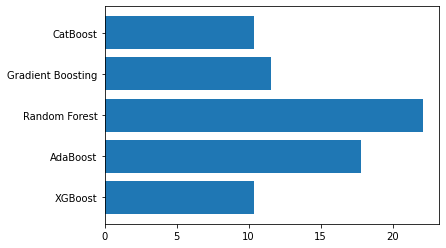

In [508]:
# Histogram za RMSE za svaki model
plt.barh(np.arange(len(R.values())),R.values())
plt.yticks(np.arange(len(R.values())),R.keys())
plt.show()

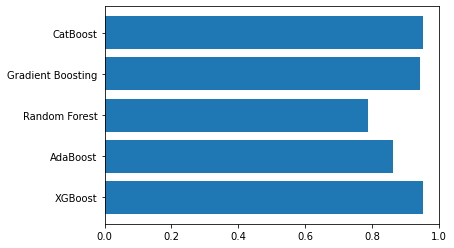

In [509]:
# Histogram za R2 za svaki model
plt.barh(np.arange(len(R2.values())),R2.values())
plt.yticks(np.arange(len(R2.values())),R2.keys())
plt.show()